## **Prep** ##

In [1]:
library(sf)
library(dplyr)

Linking to GEOS 3.10.2, GDAL 3.4.1, PROJ 8.2.1; sf_use_s2() is TRUE


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union




**Load Data Frames**

In [2]:
shape <- st_read("Combined_Parcels_2024.shp") 
classifications <- read.csv("Parcel_Classifications_2023.csv")
ratio <- read.csv("Combined_Study_2023.csv")
exc <- read.csv("Combined_Reconciliation_2023.csv")
ctyb = st_read('Combined_County_Boundaries_2024.shp')

Reading layer `Combined_Parcels_2024' from data source 
  `/anvil/projects/x-cis220051/sps/tippecanoe-project/Combined_Parcels_2024.shp' 
  using driver `ESRI Shapefile'


Warning message in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, :
"GDAL Message 1: organizePolygons() received an unexpected geometry.  Either a polygon with interior rings, or a polygon with less than 4 points, or a non-Polygon geometry.  Return arguments as a collection."
Warning message in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, :
"GDAL Message 1: organizePolygons() received an unexpected geometry.  Either a polygon with interior rings, or a polygon with less than 4 points, or a non-Polygon geometry.  Return arguments as a collection."
Warning message in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, :
"GDAL Message 1: organizePolygons() received an unexpected geometry.  Either a polygon with interior rings, or a polygon with less than 4 points, or a non-Polygon geometry.  Return arguments as a collection."
Warning message in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, :
"GDAL Message 1: organizePolygons() recei

Simple feature collection with 3521572 features and 10 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 403530.9 ymin: 4180997 xmax: 692092.3 ymax: 4625472
Projected CRS: NAD83 / UTM zone 16N
Reading layer `Combined_County_Boundaries_2024' from data source 
  `/anvil/projects/x-cis220051/sps/tippecanoe-project/Combined_County_Boundaries_2024.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 92 features and 12 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: 403540.1 ymin: 4180914 xmax: 692185.5 ymax: 4625472
Projected CRS: NAD83 / UTM zone 16N


**Combine Data Frames**

In [3]:
shape = shape[!is.na(shape$PrprtyC),]
head(shape)

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,PrclNmb,County,Address,PrprtyC,Zip,City,Latitud,Longitd,Length,Area,geometry
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<MULTIPOLYGON [m]>
1,01-05-35-200-001.000-020,ADAMS COUNTY,1712 E 100 N,511,46772,MONROE,40.75970,-84.90522,505.33397,13530.9683,MULTIPOLYGON (((676909.1 45...
2,01-07-11-301-003.001-003,ADAMS COUNTY,4885 W 200 S-1,510,46714,BLUFFTON,40.71473,-85.02958,376.87386,8101.2922,MULTIPOLYGON (((666467.5 45...
3,01-02-19-300-010.500-013,ADAMS COUNTY,N 250 W,100,46733,DECATUR,40.86216,-84.98764,1558.69548,116532.6144,MULTIPOLYGON (((669892.2 45...
4,01-02-19-300-012.000-013,ADAMS COUNTY,8150 N 250 W,501,46733,DECATUR,40.86347,-84.98453,255.94598,4093.4361,MULTIPOLYGON (((669826.1 45...
5,01-02-35-101-002.002-014,ADAMS COUNTY,SYCAMORE ST,100,46733,DECATUR,40.84145,-84.90966,97.54099,566.7275,MULTIPOLYGON (((676244.4 45...
6,01-05-31-100-001.500-020,ADAMS COUNTY,2858 W 100 N,101,46772,MONROE,40.75846,-84.99147,313.67216,6069.6895,MULTIPOLYGON (((669503.9 45...


In [4]:
head(classifications)

,X,ParcelNumber,Zip,County,Township,TaxDistrict,CountyClassification,ZipClassification,TaxClassification,TownshipClassification
,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>
1,1,01-05-35-200-001.000-020,46772,Adams,Washington,20,Rural,Rural,Rural,Urban
2,2,01-07-11-301-003.001-003,46714,Adams,French,3,Rural,Rural,Rural,Rural
3,3,01-02-19-300-010.500-013,46733,Adams,Root,13,Rural,Rural,Rural,Urban
4,4,01-02-19-300-012.000-013,46733,Adams,Root,13,Rural,Rural,Rural,Urban
5,5,01-02-35-101-002.002-014,46733,Adams,Root,14,Rural,Rural,Urban,Urban
6,6,01-05-31-100-001.500-020,46772,Adams,Washington,20,Rural,Rural,Rural,Urban


In [5]:
combinedclass <- inner_join(shape, classifications, by = c("PrclNmb" = "ParcelNumber"),relationship='many-to-many')
combinedrat <- inner_join(combinedclass, ratio, by = c("PrclNmb" = "ParcelNumber"),relationship = "many-to-many")
combinedexc = inner_join(combinedclass, exc, by = c("PrclNmb" = "ParcelNumber"),relationship = "many-to-many")

**Split Data Frames**

In [6]:
nrow(ratio)
nrow(combinedrat)
nrow(exc)
nrow(combinedexc)

[1] 116833

[1] 115674

[1] 91160

[1] 89797

In [7]:
nrow(shape)
nrow(classifications)
nrow(combinedclass)

[1] 3521572

[1] 3499018

[1] 3499018

In [8]:
combinedexc = combinedexc[combinedexc$Explanation %in% c('AV DOES NOT REFLECT MARKET VALUE','MULTI PARCEL SALE','INVESTMENT/RENTAL','SOLD AS IS',
               'INSUFFICIENT TIME ON MARKET','VACANT LAND','APARTMENT','LEASE','BUILDING PERMIT',
               'NOT ENOUGH SALES FOR TRENDING'),]

In [9]:
colnames(combinedexc)
colnames(combinedrat)

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "X"                      "Zip.y"                 
[13] "County.y"               "Township.x"             "TaxDistrict.x"         
[16] "CountyClassification"   "ZipClassification"      "TaxClassification"     
[19] "TownshipClassification" "SaleID"                 "County"                
[22] "Township.y"             "TaxDistrict.y"          "PropertyClass"         
[25] "PostedAV"               "CurrentAV"              "SalePrice"             
[28] "PostedSaleRatio"        "SaleRatio"              "PostedExplanation"     
[31] "Explanation"            "Reclassified"           "geometry"

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "X"                      "Zip.y"                 
[13] "County.y"               "Township.x"             "TaxDistrict.x"         
[16] "CountyClassification"   "ZipClassification"      "TaxClassification"     
[19] "TownshipClassification" "SaleID"                 "County"                
[22] "Township.y"             "TaxDistrict.y"          "PropertyClass"         
[25] "PostedAV"               "CurrentAV"              "SalePrice"             
[28] "PostedSaleRatio"        "SaleRatio"              "MultiParcel"           
[31] "Primary"                "StudySection"           "geometry"

In [10]:
combinedexc = combinedexc[,c(1:10,12:29)]
combinedrat = combinedrat[,c(1:10,12:29)]

In [11]:
colnames(combinedexc)
colnames(combinedrat)
combinedclass = rbind(combinedexc,combinedrat)

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "Zip.y"                  "County.y"              
[13] "Township.x"             "TaxDistrict.x"          "CountyClassification"  
[16] "ZipClassification"      "TaxClassification"      "TownshipClassification"
[19] "SaleID"                 "County"                 "Township.y"            
[22] "TaxDistrict.y"          "PropertyClass"          "PostedAV"              
[25] "CurrentAV"              "SalePrice"              "PostedSaleRatio"       
[28] "SaleRatio"              "geometry"

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "Zip.y"                  "County.y"              
[13] "Township.x"             "TaxDistrict.x"          "CountyClassification"  
[16] "ZipClassification"      "TaxClassification"      "TownshipClassification"
[19] "SaleID"                 "County"                 "Township.y"            
[22] "TaxDistrict.y"          "PropertyClass"          "PostedAV"              
[25] "CurrentAV"              "SalePrice"              "PostedSaleRatio"       
[28] "SaleRatio"              "geometry"

In [12]:
rural = combinedclass[combinedclass$ZipClassification == "Rural",]
urban = combinedclass[combinedclass$ZipClassification == "Urban",]

## **K Means** ##

#### **Rural & Mixed**

In [28]:
library(ggplot2)
# Extract longitude and latitude as a properly formatted numeric matrix
coords <- cbind(
  as.numeric(rural$Longitd),
  as.numeric(rural$Latitud)
)
coords <- na.omit(coords)
coords <- as.matrix(coords)
coords_df <- as.data.frame(coords)
names(coords_df) <- c("Long", "Lat")

set.seed(42)

num_clusters <- 7
kmeans_result <- kmeans(coords_df, centers = num_clusters)
coords_df$Cluster <- as.factor(kmeans_result$cluster)

points_sf <- st_as_sf(coords_df, coords = c("Long", "Lat"), crs = 4326)
rural$Cluster <- as.factor(kmeans_result$cluster)


   1    2    3    4    5    6    7 
6123 6445 4453 4701 5057 4203 2749 

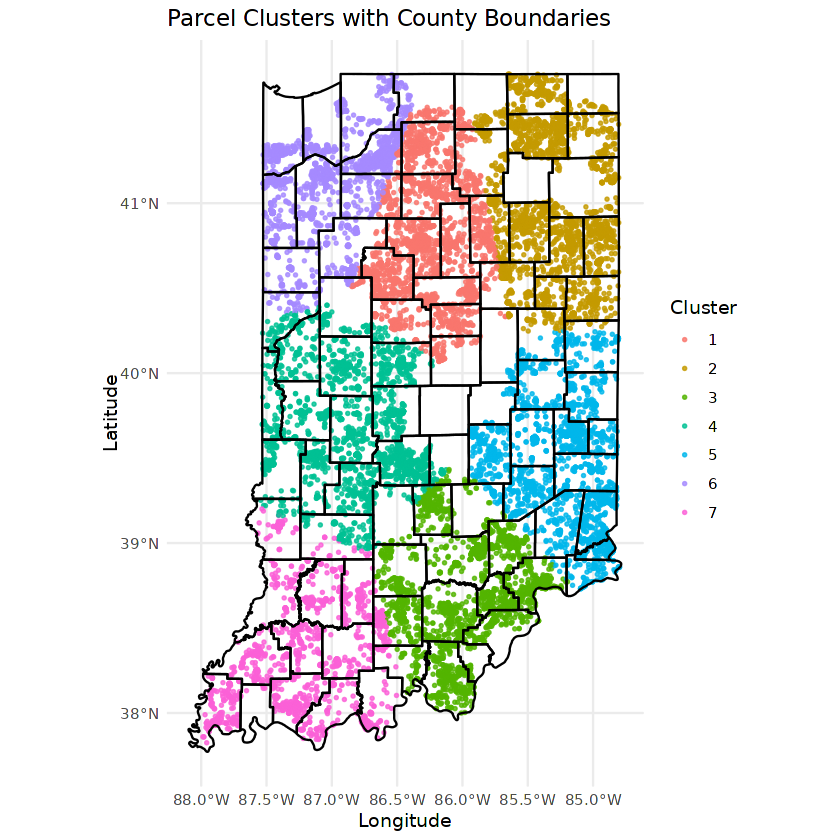

In [30]:
ggplot() +
  geom_sf(data = points_sf, aes(color = Cluster), alpha = 0.8, size = 0.5) +
 geom_sf(data = ctyb, 
          fill = NA, color = "black", size = 0.5,lwd=0.5) +
  theme_minimal() +
  labs(title = "Parcel Clusters with County Boundaries", x = "Longitude", y = "Latitude", color = "Cluster")

table(rural$Cluster)

#### **Urban**


    8     9    10    11    12    13    14 
 8236 18765  5085 47512  5891  8582  7472 

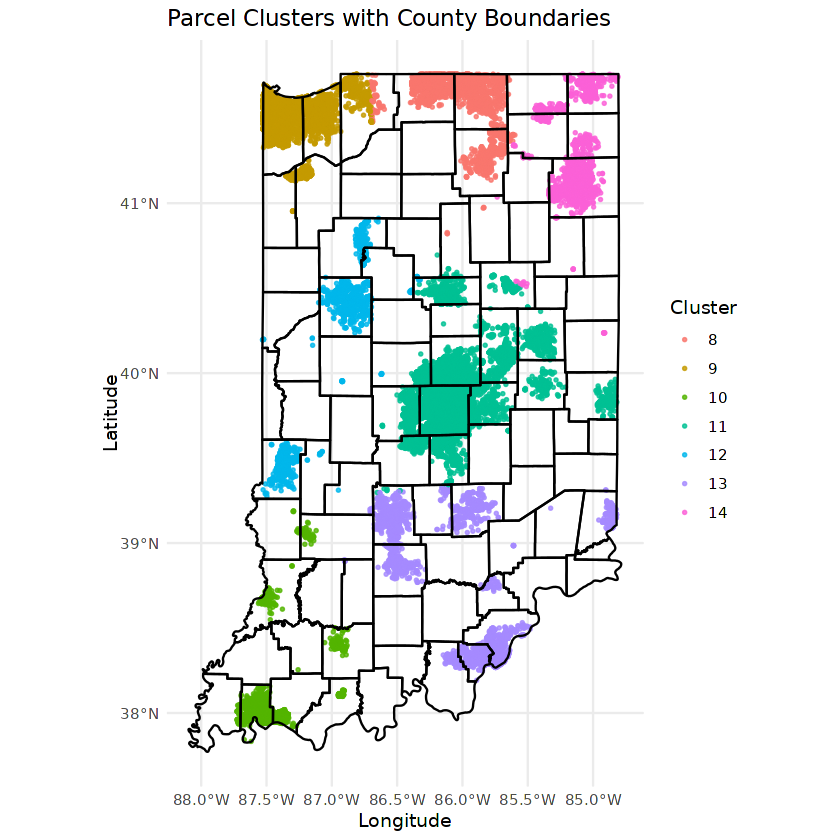

In [31]:
# Extract longitude and latitude as a properly formatted numeric matrix
coords <- cbind(
  as.numeric(urban$Longitd),
  as.numeric(urban$Latitud)
)
coords <- na.omit(coords)
coords <- as.matrix(coords)
coords_df <- as.data.frame(coords)
names(coords_df) <- c("Long", "Lat")  # Better naming for clarity

set.seed(42)

num_clusters <- 7
kmeans_result <- kmeans(coords_df, centers = num_clusters)
coords_df$Cluster <- as.factor(kmeans_result$cluster + 7)

points_sf <- st_as_sf(coords_df, coords = c("Long", "Lat"), crs = 4326)
urban$Cluster <- as.factor(kmeans_result$cluster + 7)
ggplot() +
  geom_sf(data = points_sf, 
          aes(color = as.factor(Cluster)), 
          alpha = 0.8, size = 0.5) +
  geom_sf(data = ctyb, 
          fill = NA, color = "black", size = 0.5,lwd=0.5) +
  theme_minimal() +
  labs(title = "Parcel Clusters with County Boundaries", 
       x = "Longitude", y = "Latitude", color = "Cluster")

table(urban$Cluster)

#### **Commercial Vacant (400)**

In [33]:
colnames(rural)
colnames(urban)

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "Zip.y"                  "County.y"              
[13] "Township.x"             "TaxDistrict.x"          "CountyClassification"  
[16] "ZipClassification"      "TaxClassification"      "TownshipClassification"
[19] "SaleID"                 "County"                 "Township.y"            
[22] "TaxDistrict.y"          "PropertyClass"          "PostedAV"              
[25] "CurrentAV"              "SalePrice"              "PostedSaleRatio"       
[28] "SaleRatio"              "geometry"               "Cluster"

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "Zip.y"                  "County.y"              
[13] "Township.x"             "TaxDistrict.x"          "CountyClassification"  
[16] "ZipClassification"      "TaxClassification"      "TownshipClassification"
[19] "SaleID"                 "County"                 "Township.y"            
[22] "TaxDistrict.y"          "PropertyClass"          "PostedAV"              
[25] "CurrentAV"              "SalePrice"              "PostedSaleRatio"       
[28] "SaleRatio"              "geometry"               "Cluster"

In [34]:
com_vac_urban <- urban[urban$PropertyClass == 400,]
table(com_vac_urban$Cluster)
com_vac_rural <- rural[rural$PropertyClass == 400,]
table(com_vac_rural$Cluster)


  8   9  10  11  12  13  14 
 14  34  39 165  25  18  16 


 1  2  3  4  5  6  7 
37 19 21 31 16 11 12 

In [35]:
ind_imp_urban <- urban[urban$PropertyClass > 300 & urban$PropertyClass < 400,]
table(ind_imp_urban$Cluster)
ind_imp_rural <- rural[rural$PropertyClass > 300 & rural$PropertyClass < 400,]
table(ind_imp_rural$Cluster)


  8   9  10  11  12  13  14 
 75  50  31 114  14  10  27 


 1  2  3  4  5  6  7 
30 26  9 12 15 17 10 

In [36]:
final = rbind(rural,urban)

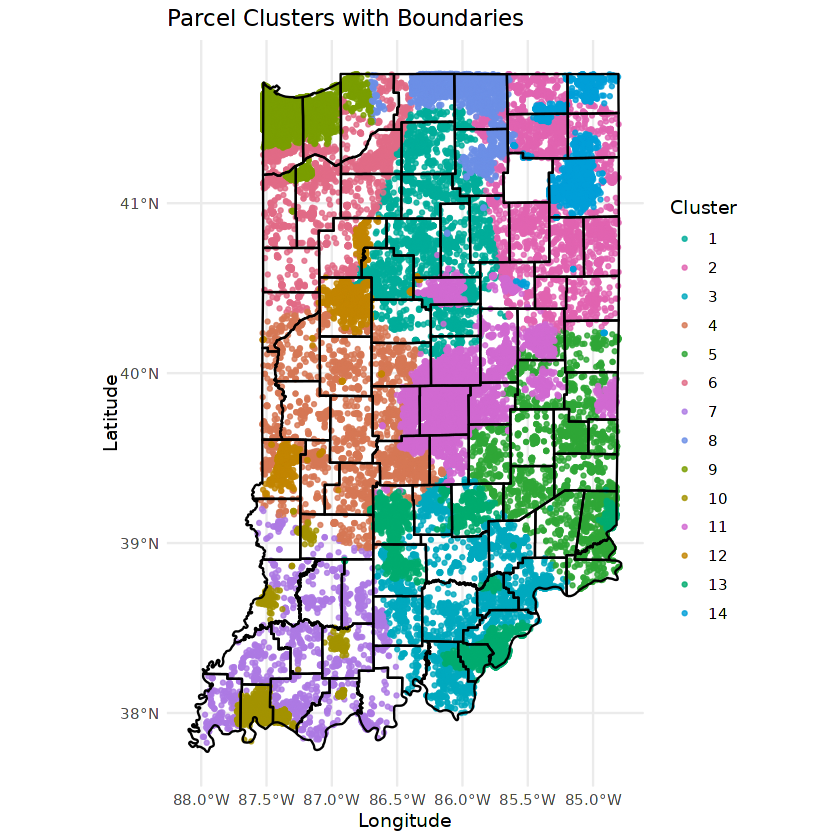

In [37]:
# Extract longitude and latitude as a properly formatted numeric matrix
coords <- cbind(
  as.numeric(final$Longitd),
  as.numeric(final$Latitud)
)

# Check for missing values and remove them
coords <- na.omit(coords)

# Ensure coords is a matrix
coords <- as.matrix(coords)
coords_sf <- st_as_sf(as.data.frame(coords), 
                      coords = c("V1", "V2"), 
                      crs = 4326)  # WGS 84
#library(ggsci)

#colors14 <- pal_d3("category20c")(14)
library(colorspace)
final_clean <- final %>%
  filter(!st_is_empty(geometry)) %>%
  mutate(geometry = st_make_valid(geometry))  # Fix invalid geometry

# 2. Group and compute centroids
cluster_centroids <- final_clean %>%
  group_by(Cluster) %>%
  summarise(geometry = st_union(geometry)) %>%         # union first
  mutate(geometry = st_centroid(geometry))  %>%
  st_transform(26916)

# 2. Extract coordinates
coords <- st_coordinates(cluster_centroids)

# 3. Compute pairwise distances and reduce to 1D for spatial ordering
dist_matrix <- as.matrix(dist(coords))
mds_1d <- cmdscale(dist_matrix, k = 1)

# 4. Order clusters based on spatial similarity
rank_order <- order(mds_1d)

# 5. Generate 14 highly distinct colors using HCL space
# You can also try palette = "Harmonic", "Dynamic", or "Dark 3"
distinct_colors <- qualitative_hcl(14, palette = "Dark 3")

# 6. Shuffle colors to spread out similar clusters
shuffled_colors <- distinct_colors[rank(rank_order)]

# 7. Map cluster labels to colors
cluster_labels <- as.character(cluster_centroids$Cluster)
cluster_colors <- setNames(shuffled_colors, cluster_labels)
coords_sf$Cluster <- final$Cluster
ggplot() +
  geom_sf(data = coords_sf, 
          aes(color = as.factor(Cluster)),  # use Cluster directly from coords_sf
          alpha = 0.8, size = 0.75) +
  geom_sf(data = ctyb, 
          fill = NA, color = "black", size = 0.5,lwd=0.5) +
  scale_color_manual(values = cluster_colors) +
  theme_minimal() +
  labs(title = "Parcel Clusters with Boundaries", 
       x = "Longitude", y = "Latitude", color = "Cluster")

In [38]:
colnames(final)

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "Zip.y"                  "County.y"              
[13] "Township.x"             "TaxDistrict.x"          "CountyClassification"  
[16] "ZipClassification"      "TaxClassification"      "TownshipClassification"
[19] "SaleID"                 "County"                 "Township.y"            
[22] "TaxDistrict.y"          "PropertyClass"          "PostedAV"              
[25] "CurrentAV"              "SalePrice"              "PostedSaleRatio"       
[28] "SaleRatio"              "Cluster"                "geometry"

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"
Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


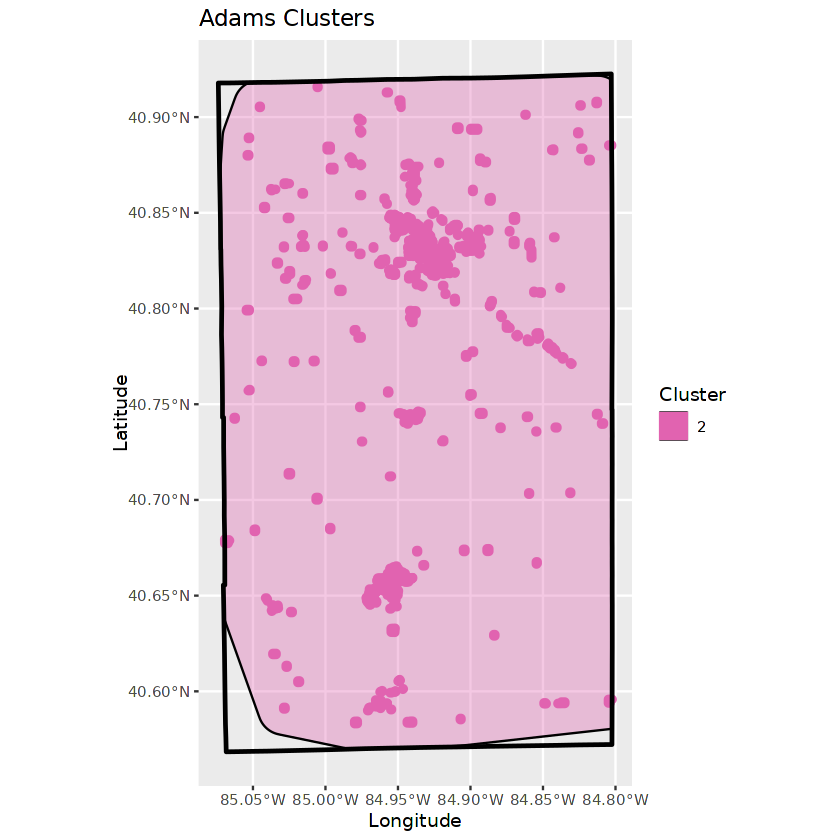

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


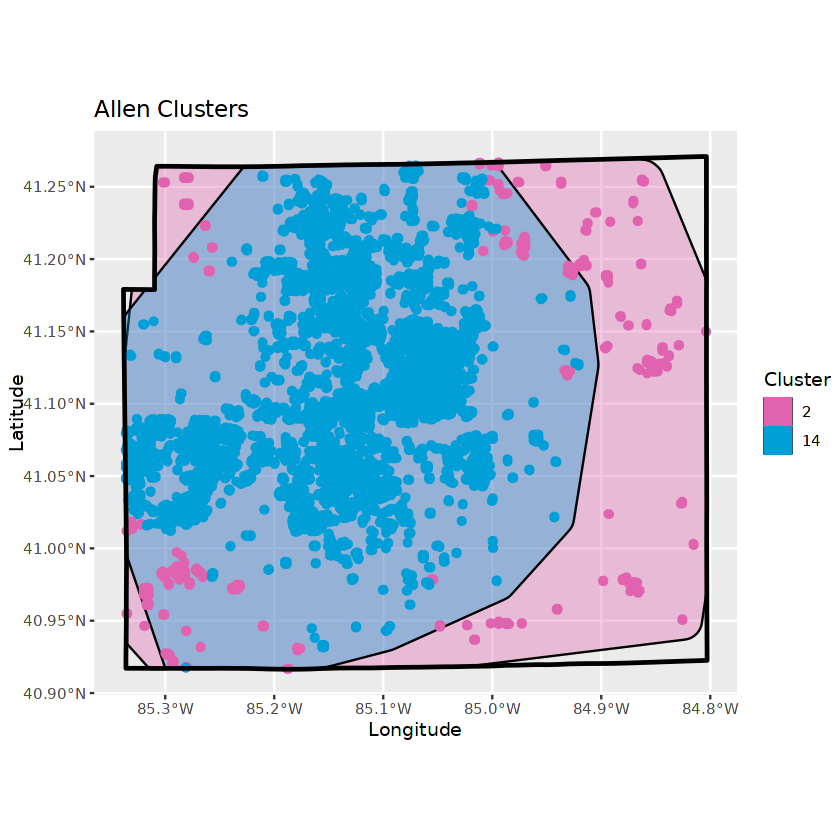

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


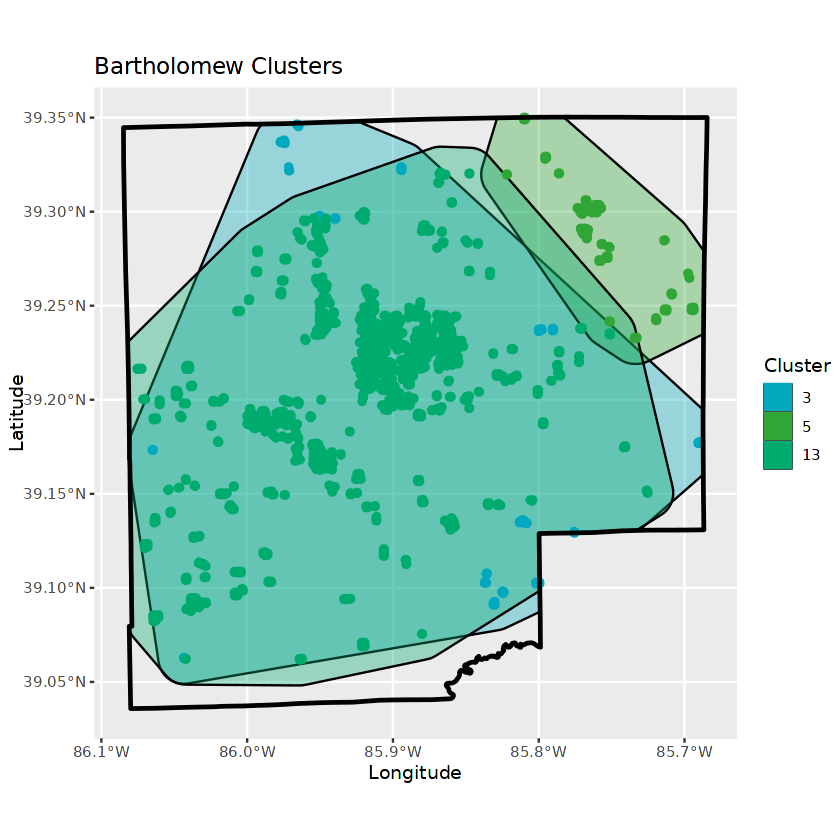

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


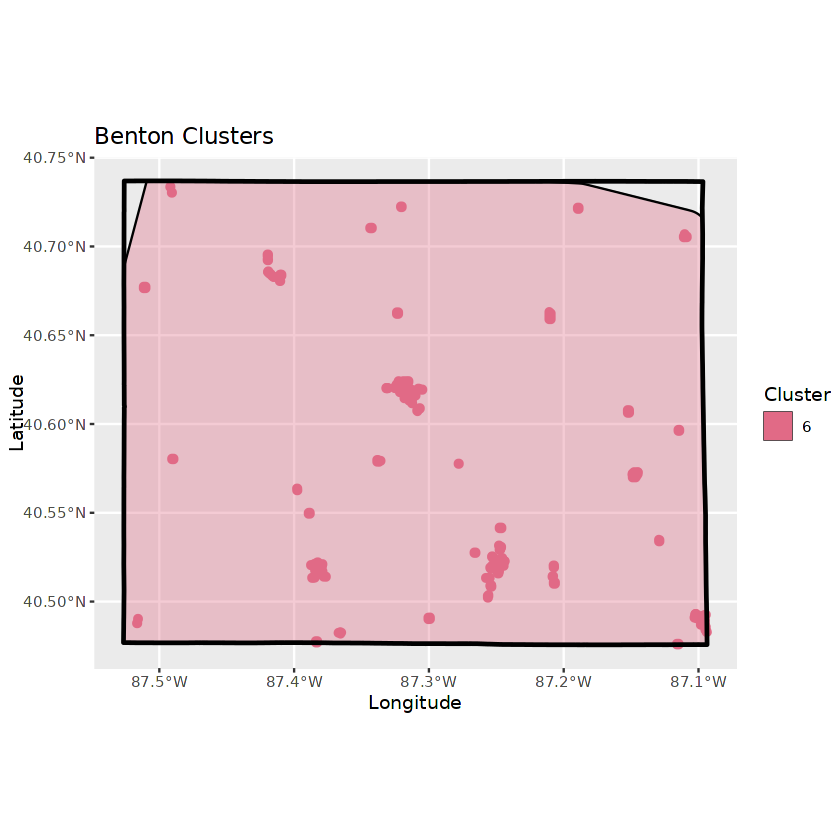

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


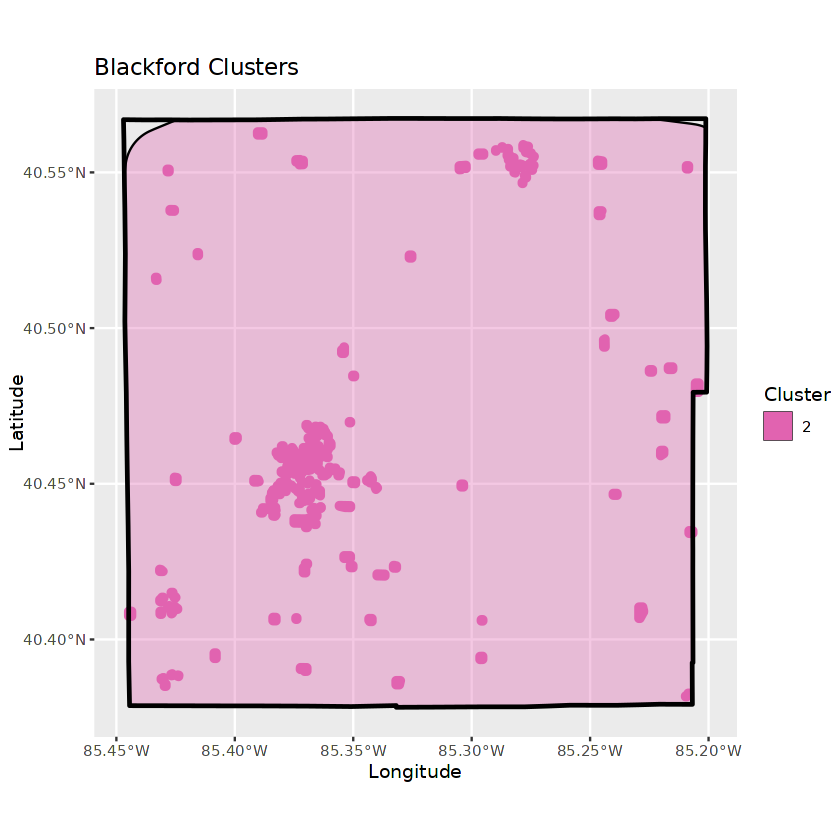

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


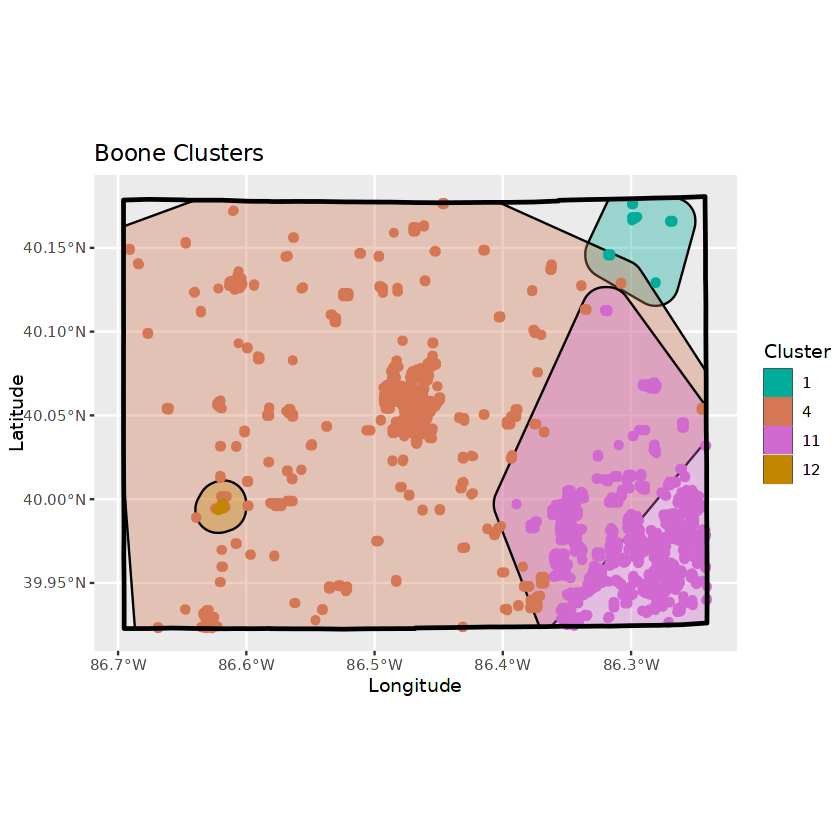

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


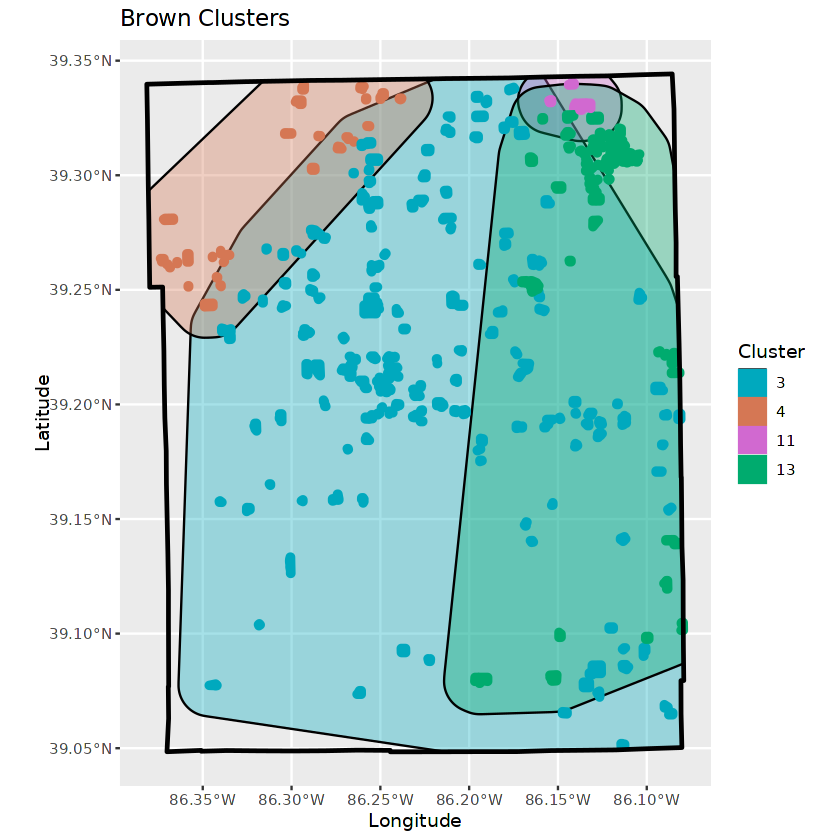

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


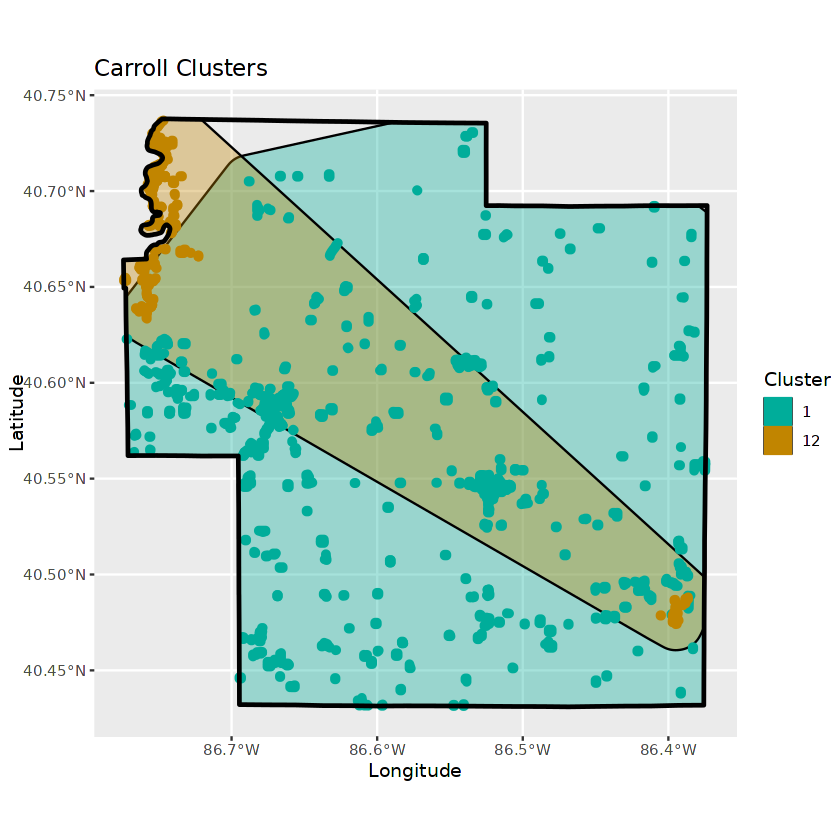

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


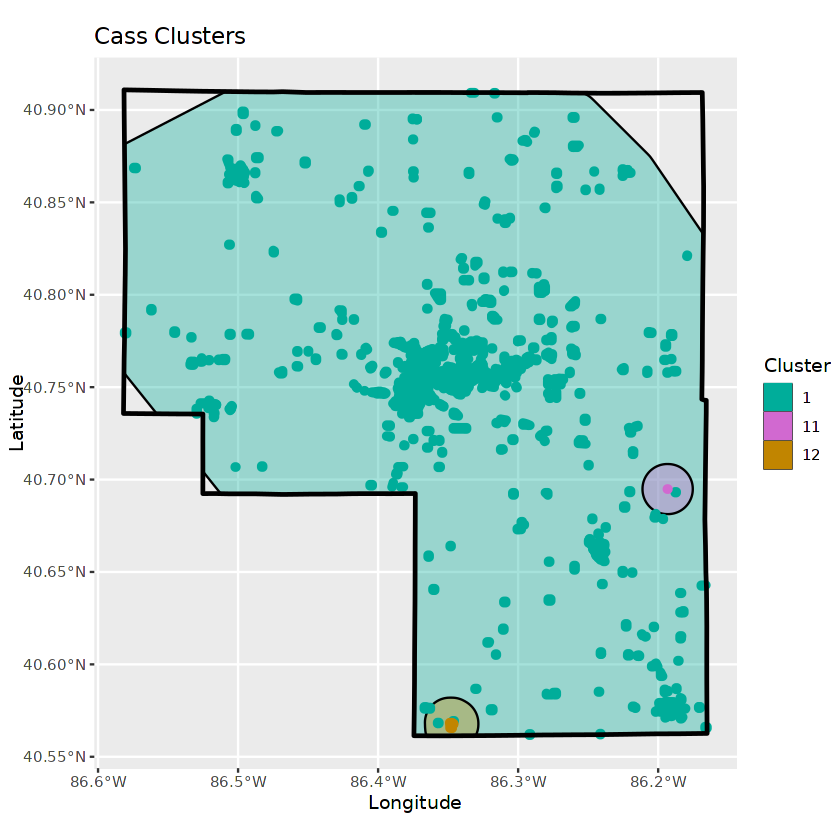

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


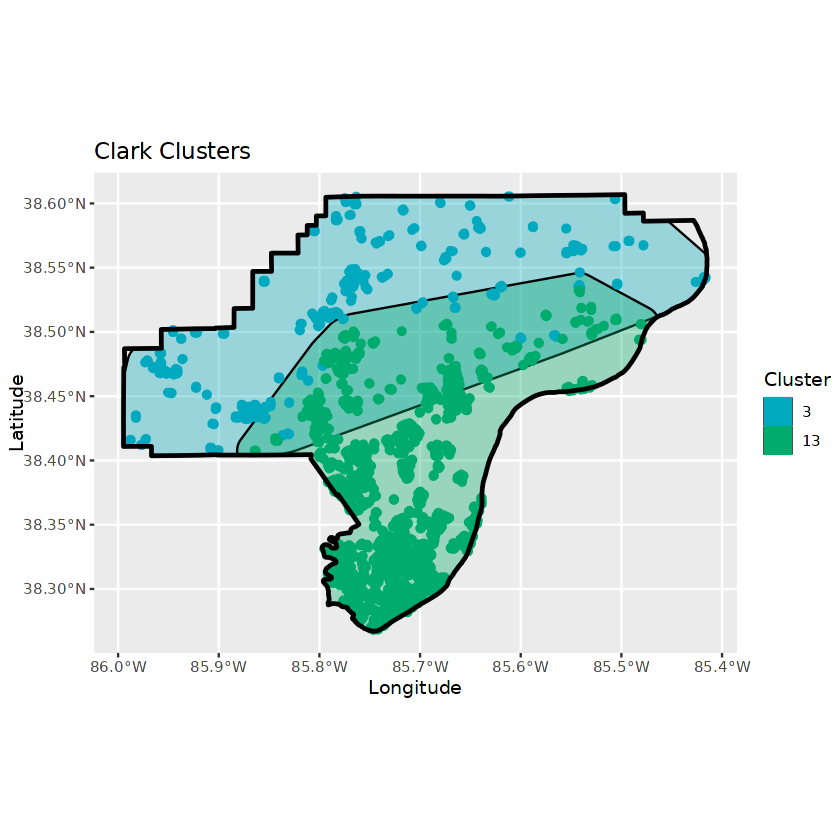

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


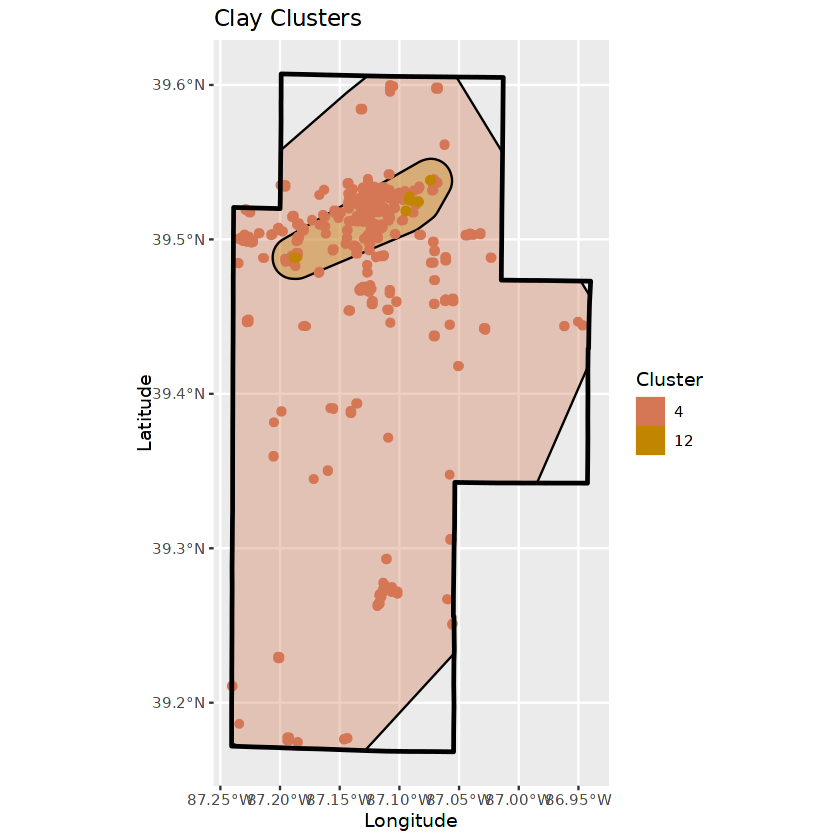

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


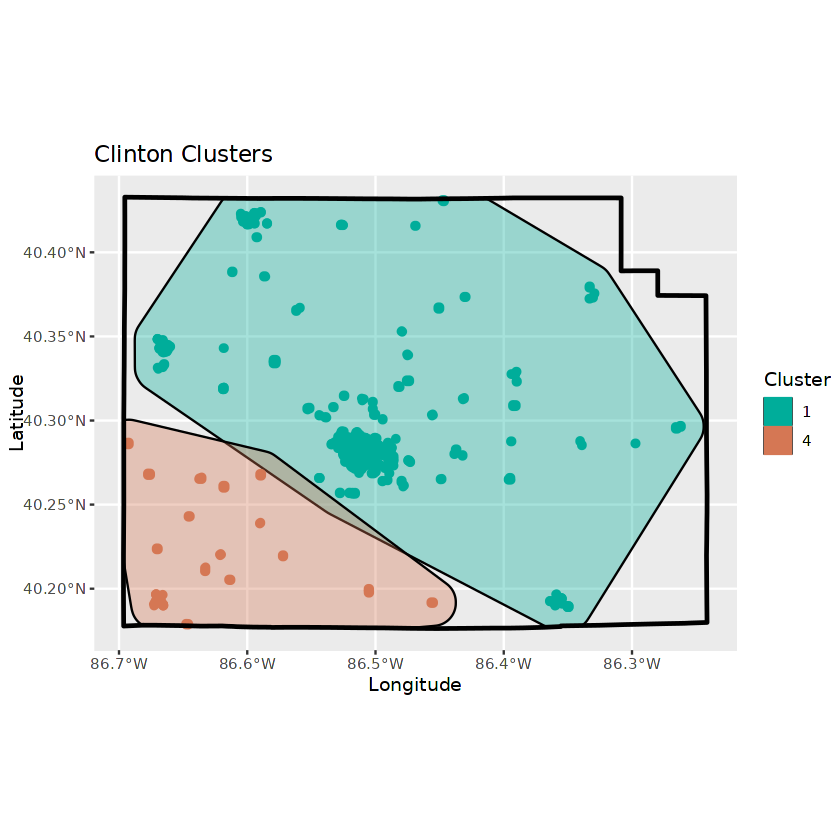

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


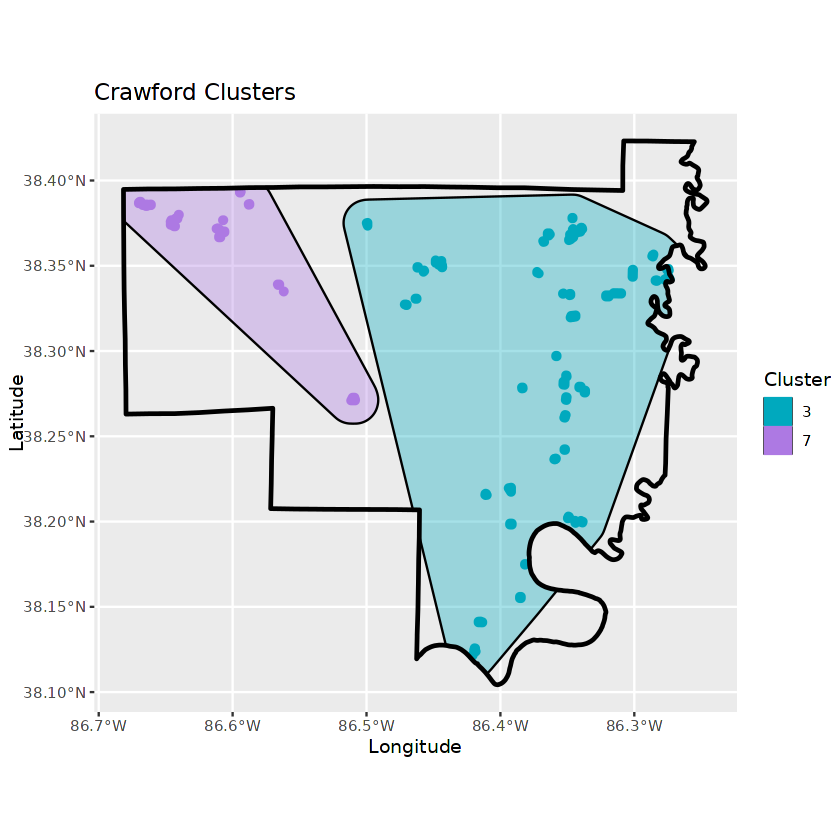

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


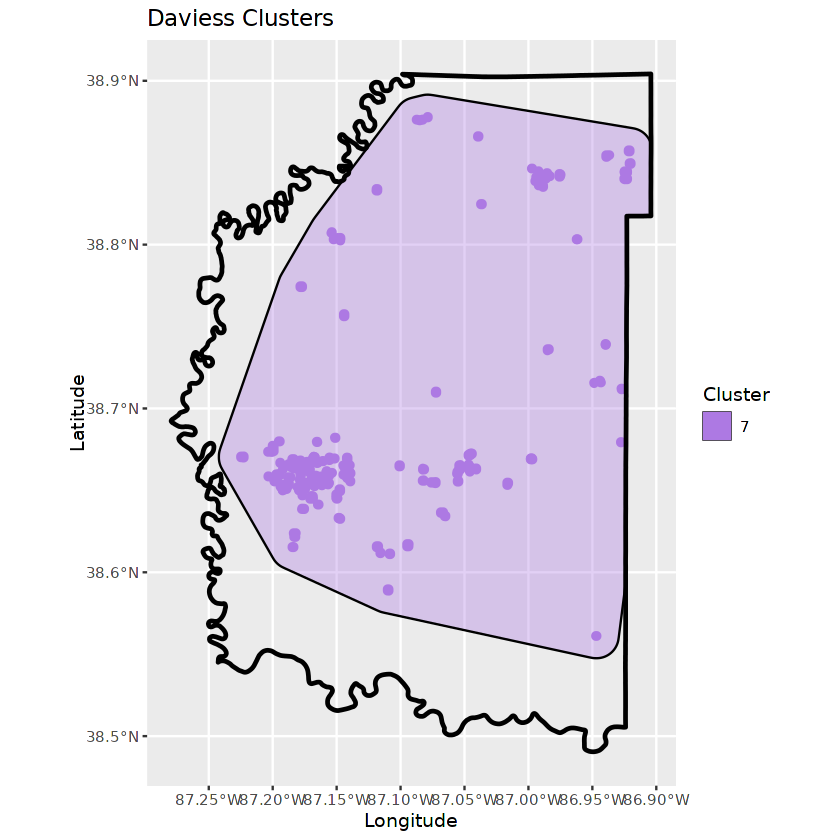

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


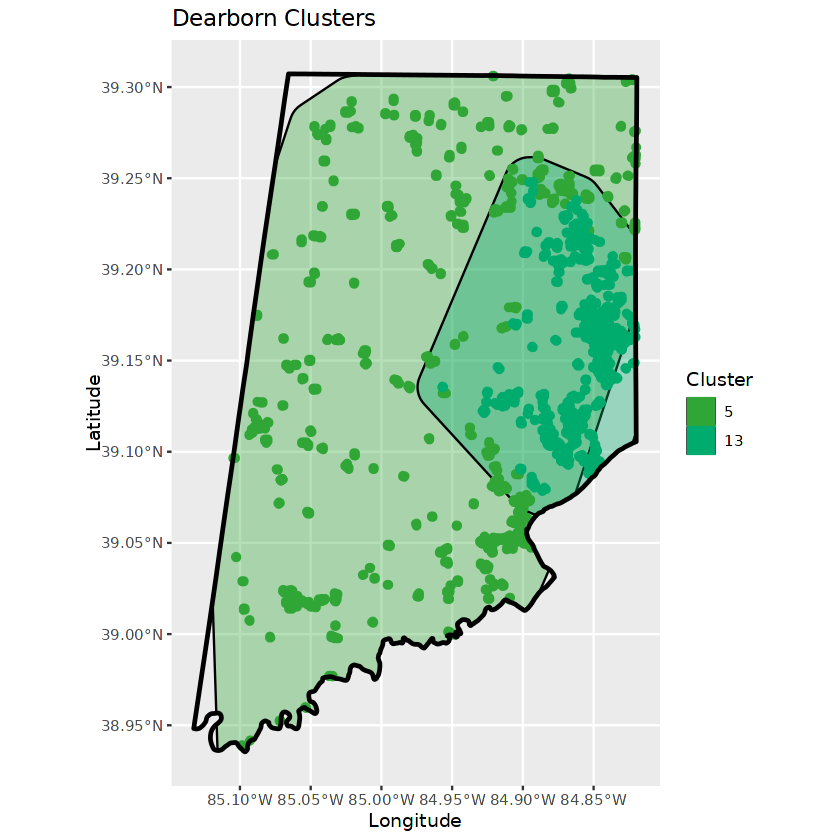

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


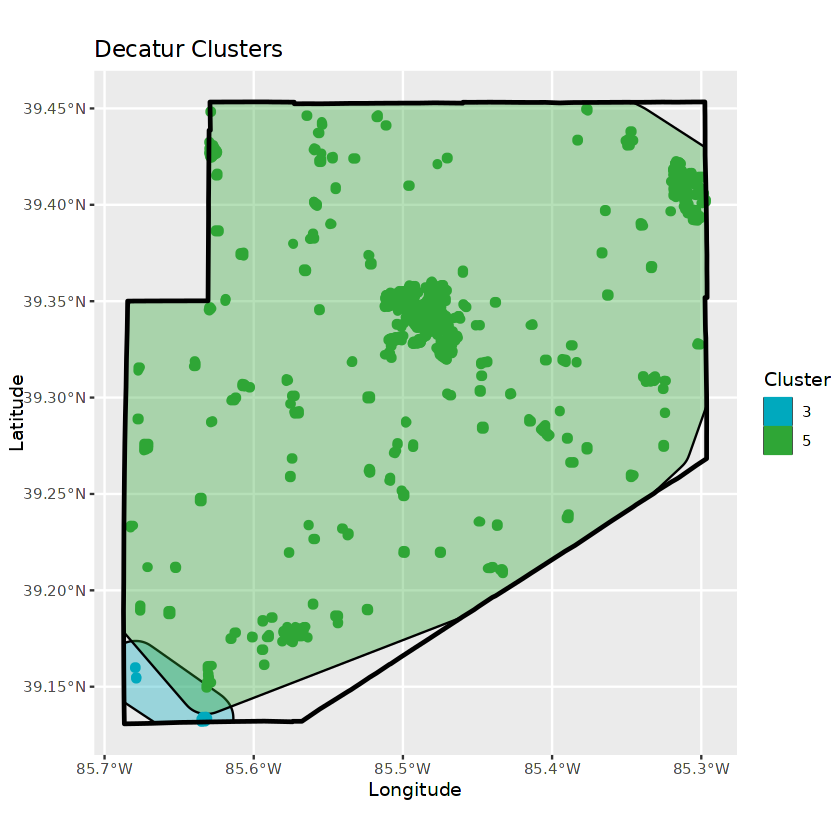

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


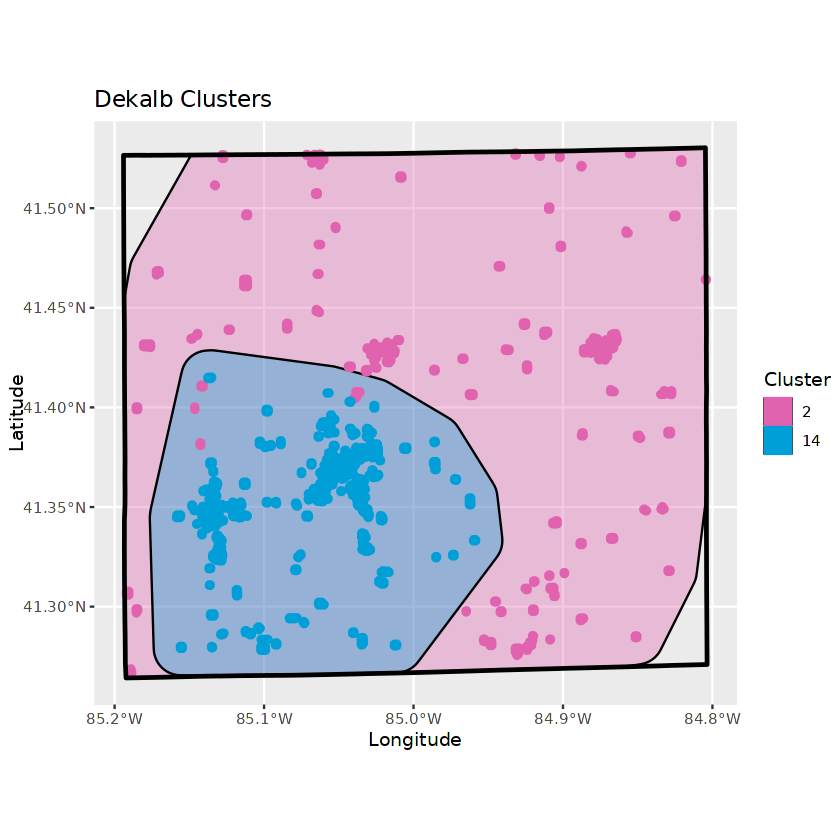

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


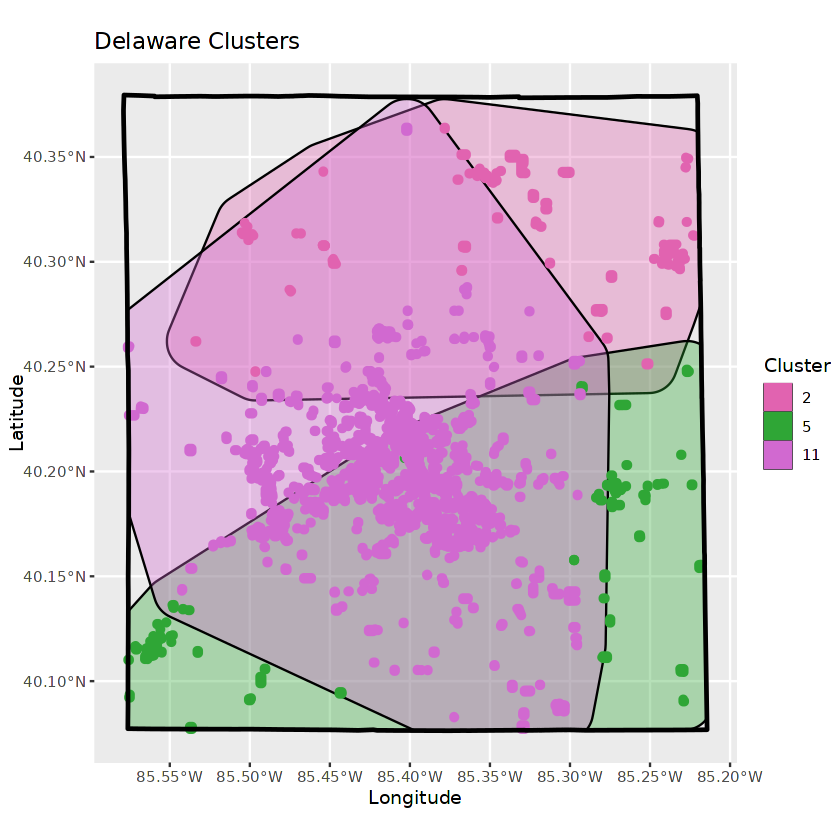

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


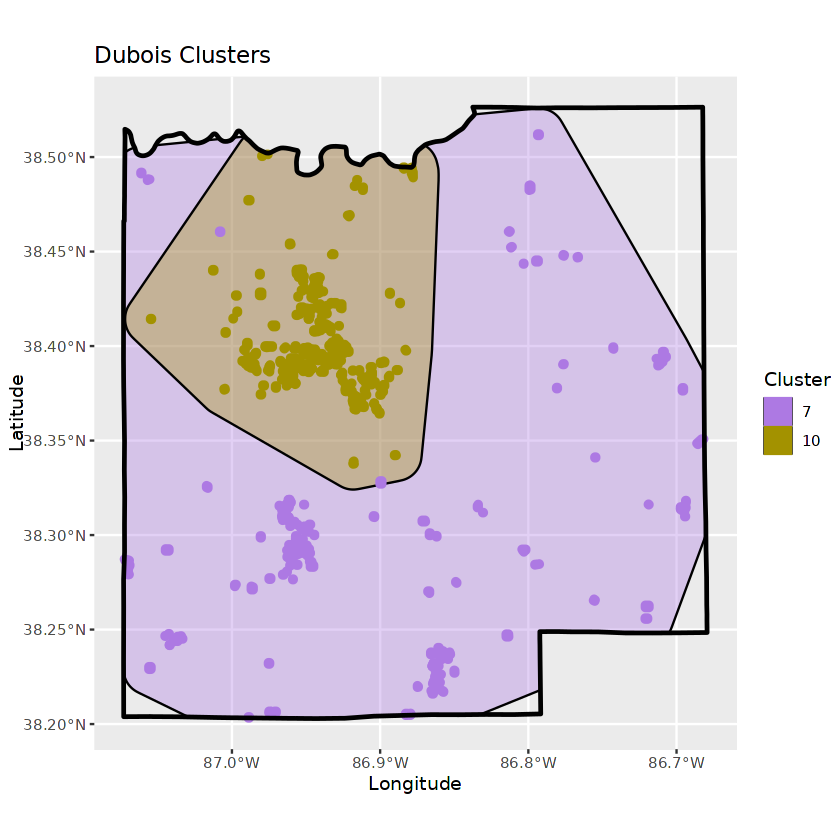

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


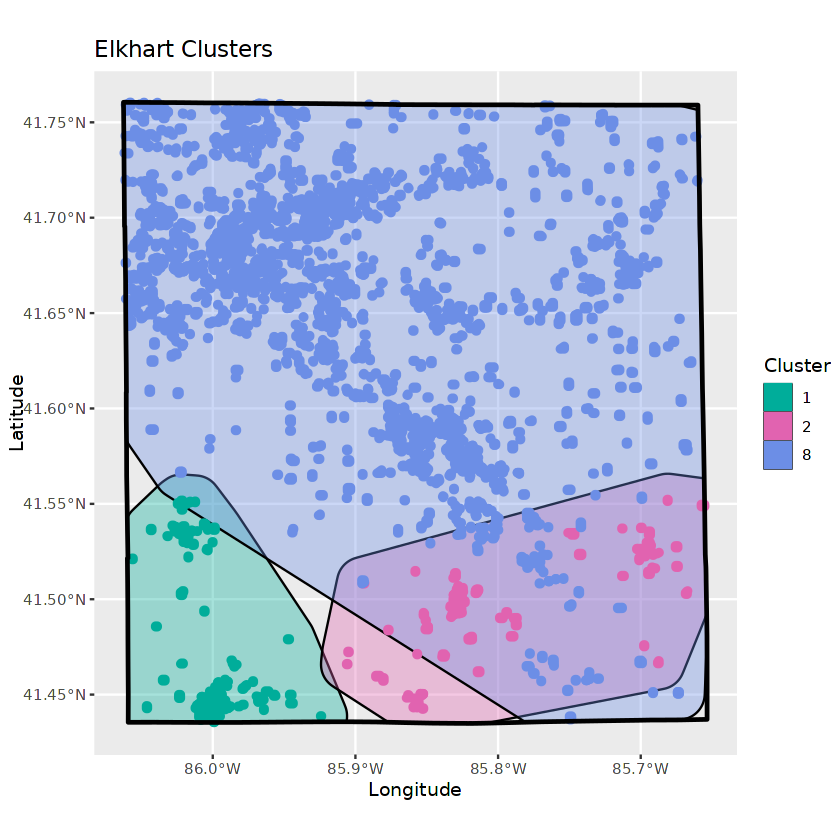

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


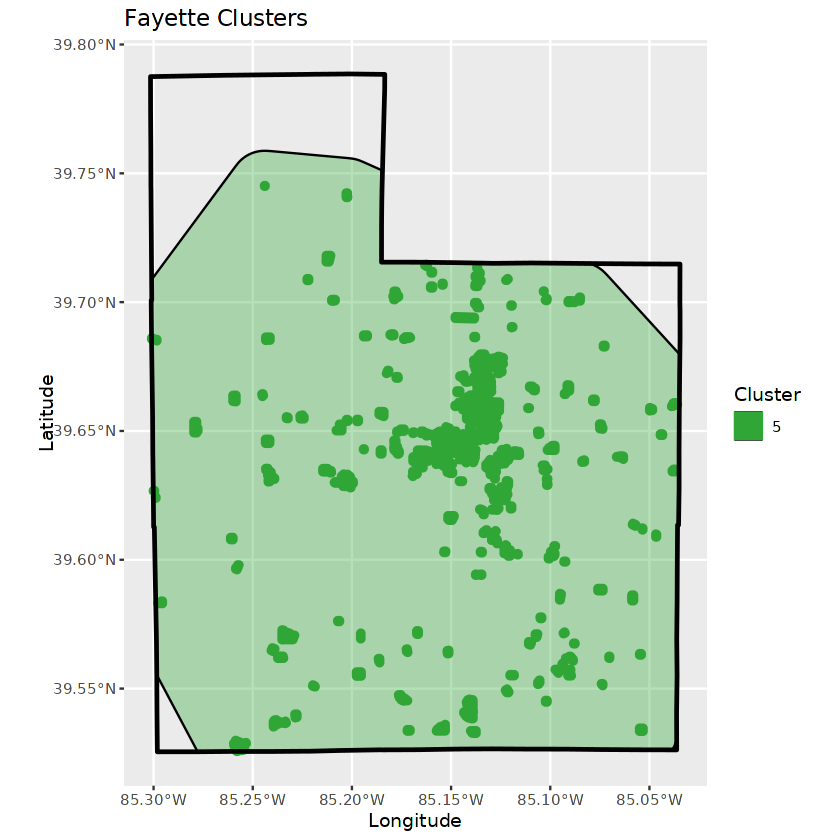

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


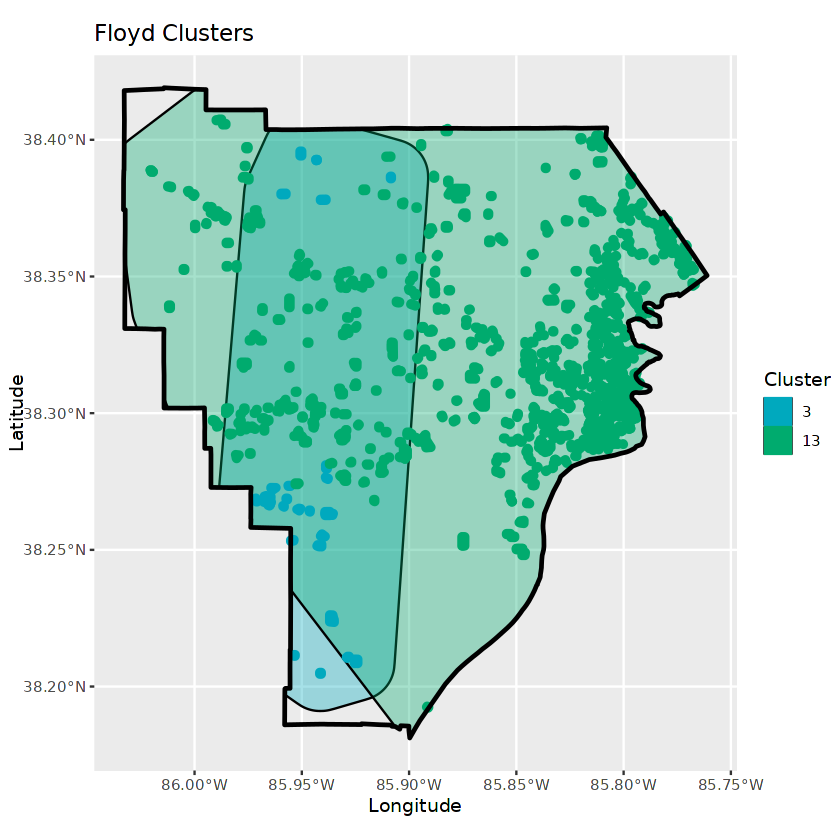

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


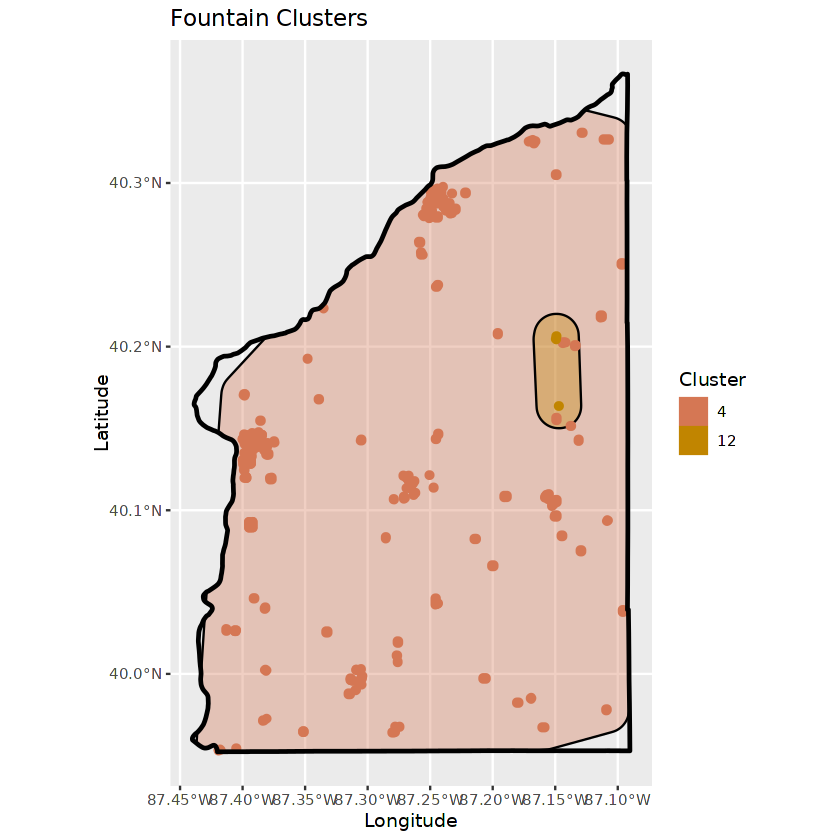

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


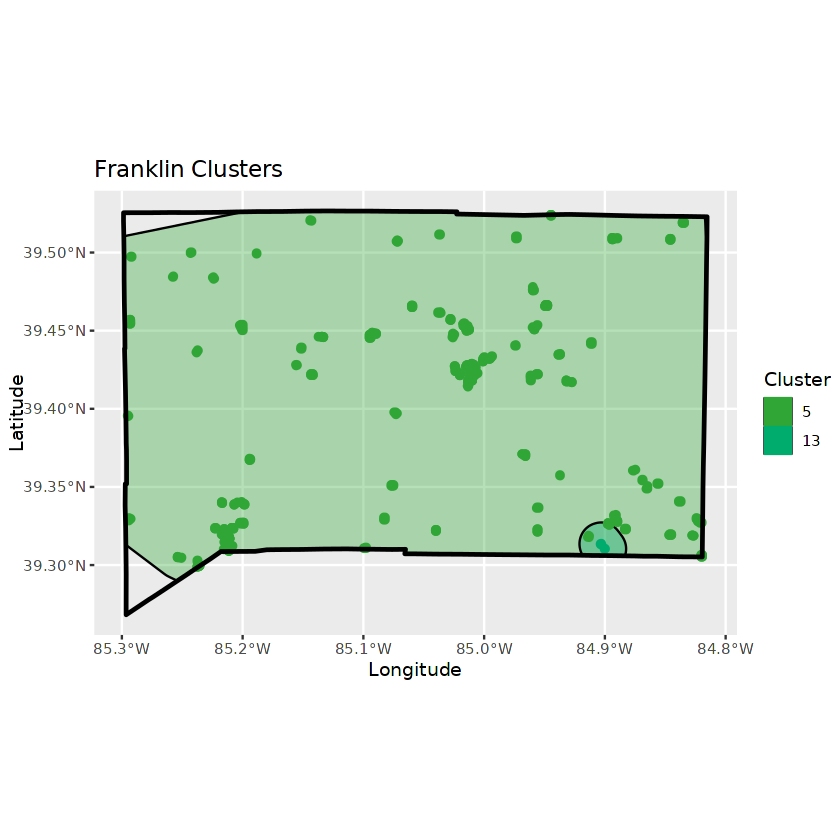

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


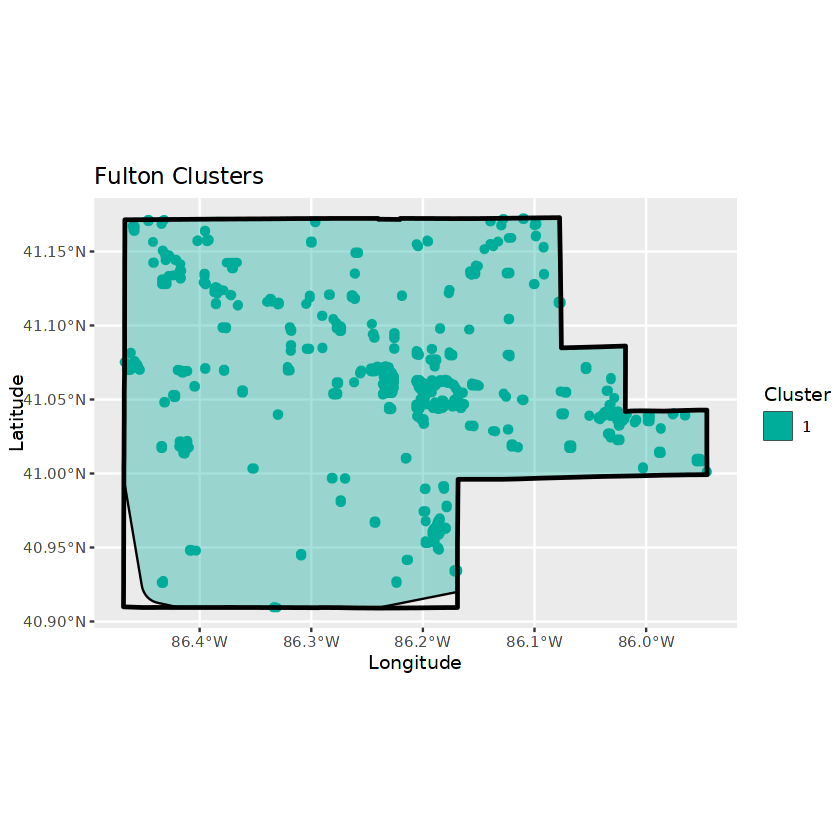

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


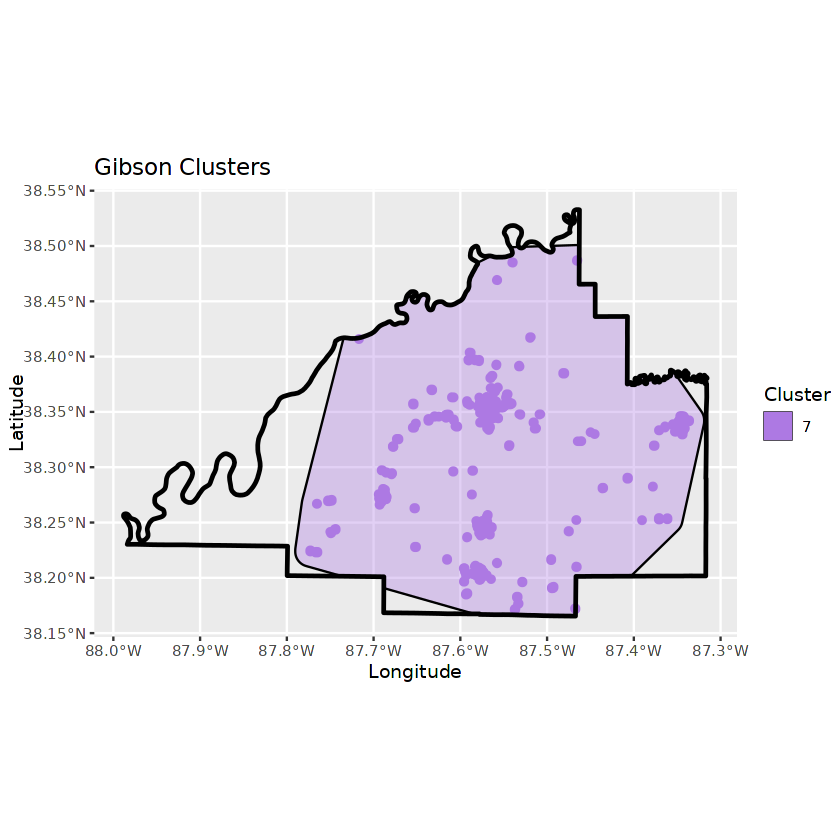

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


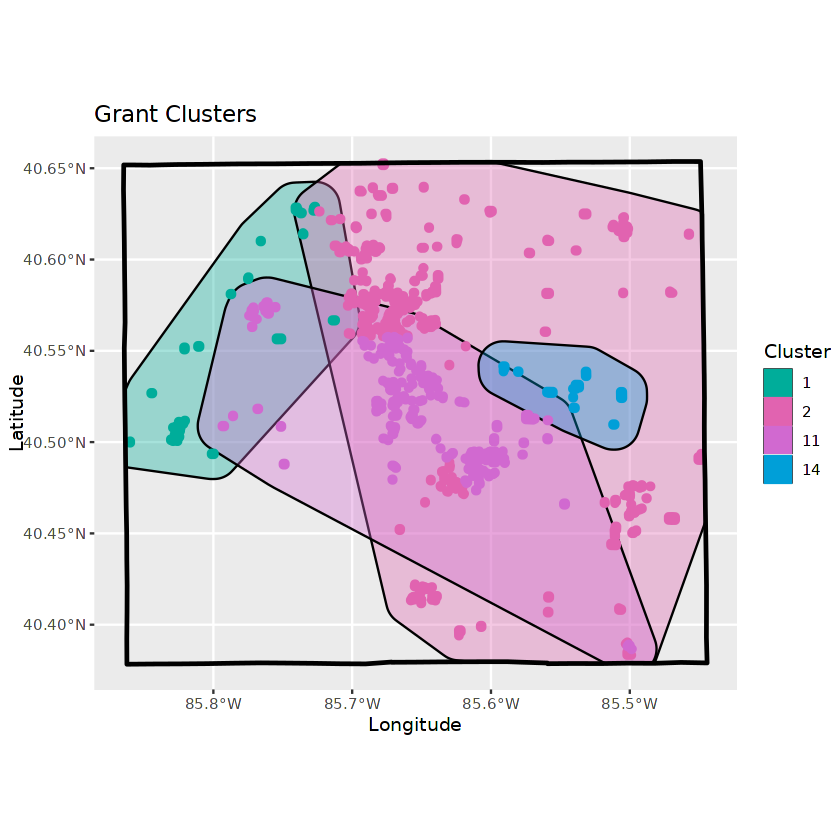

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


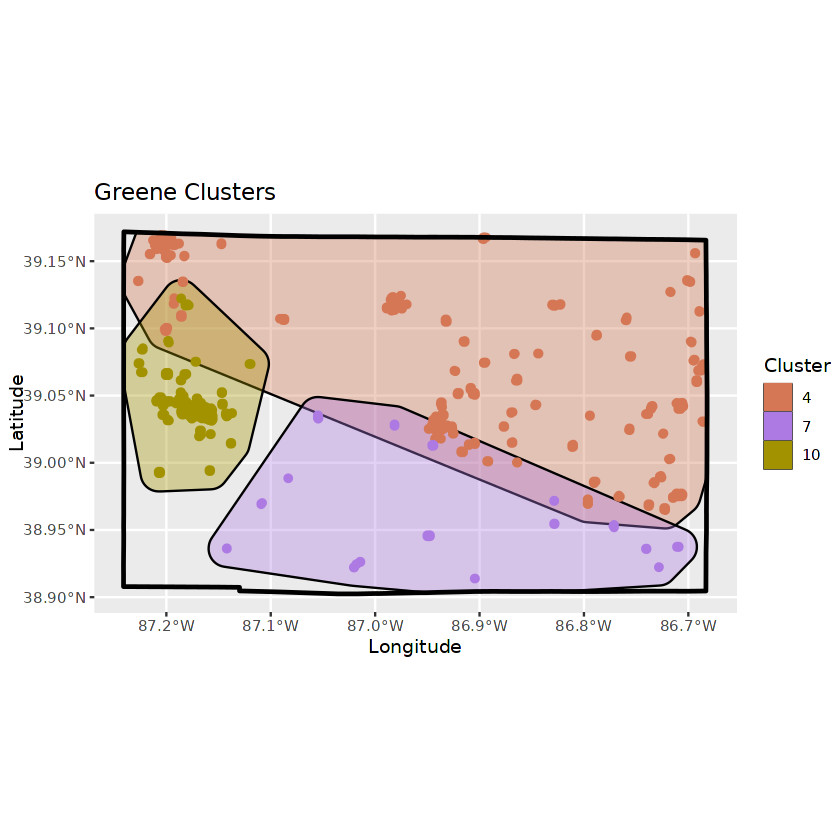

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


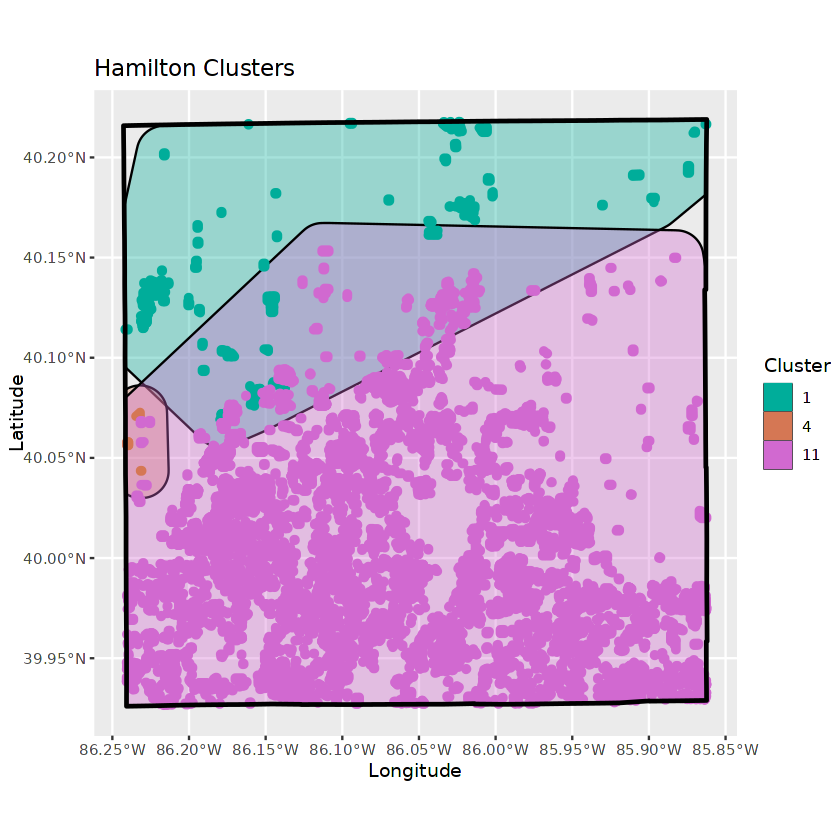

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


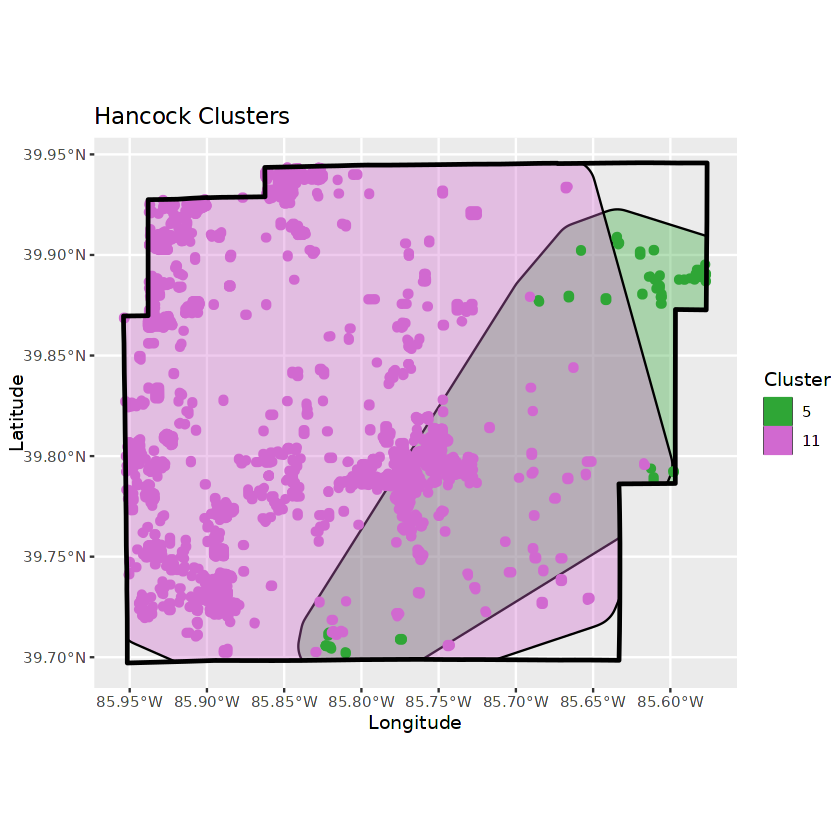

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


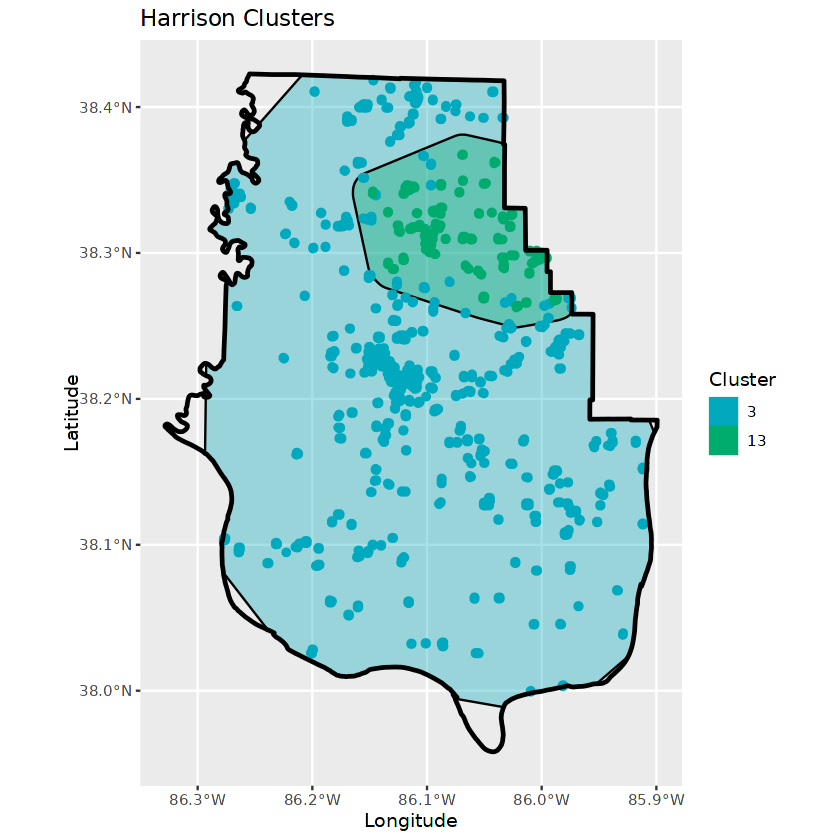

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


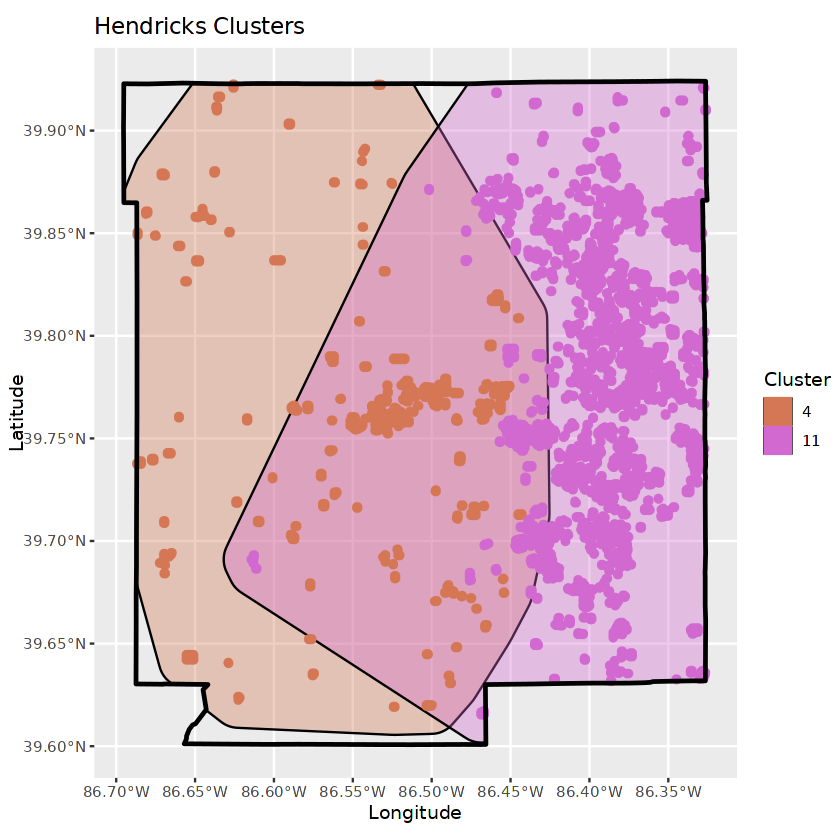

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


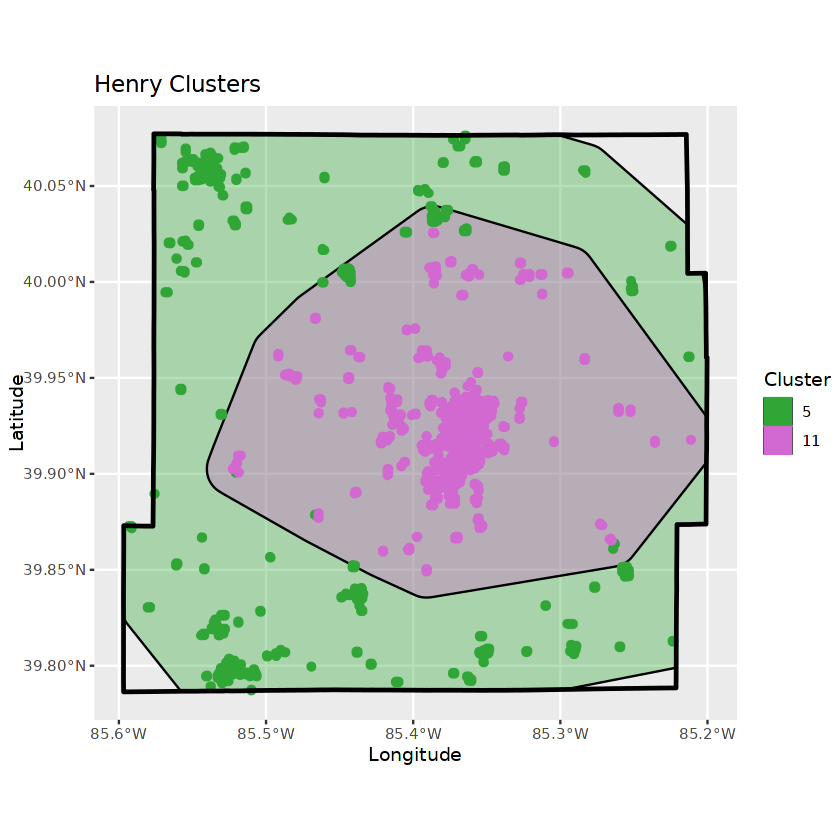

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


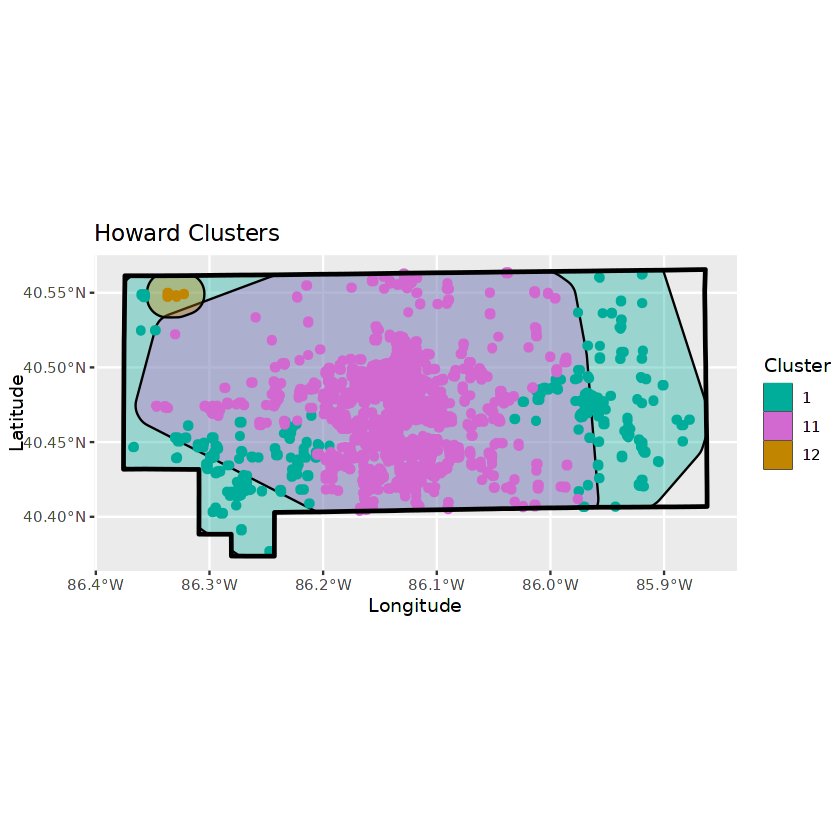

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


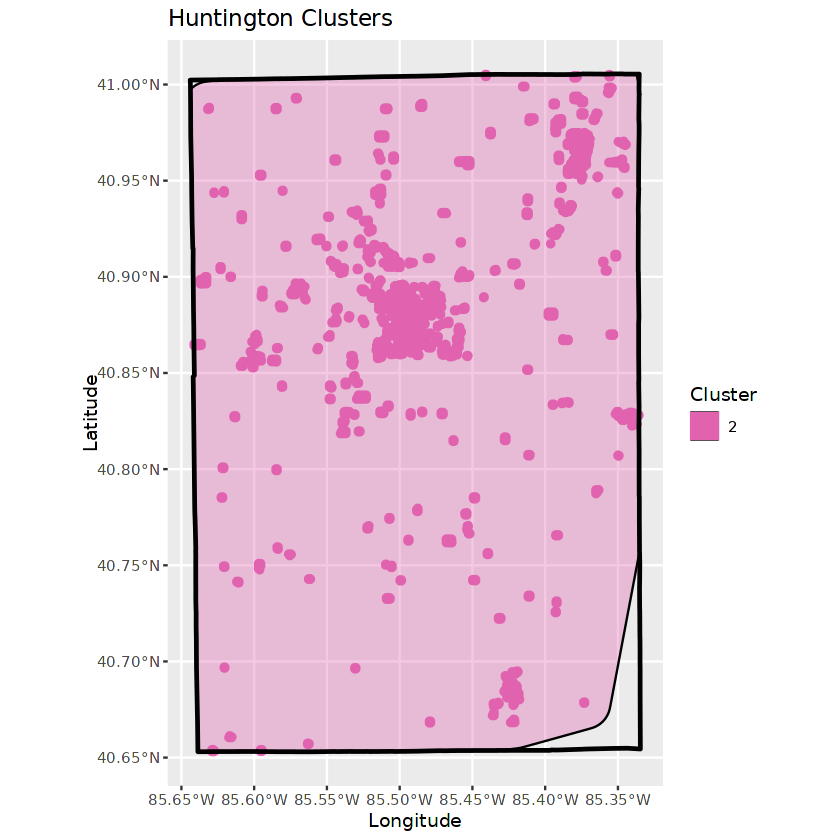

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


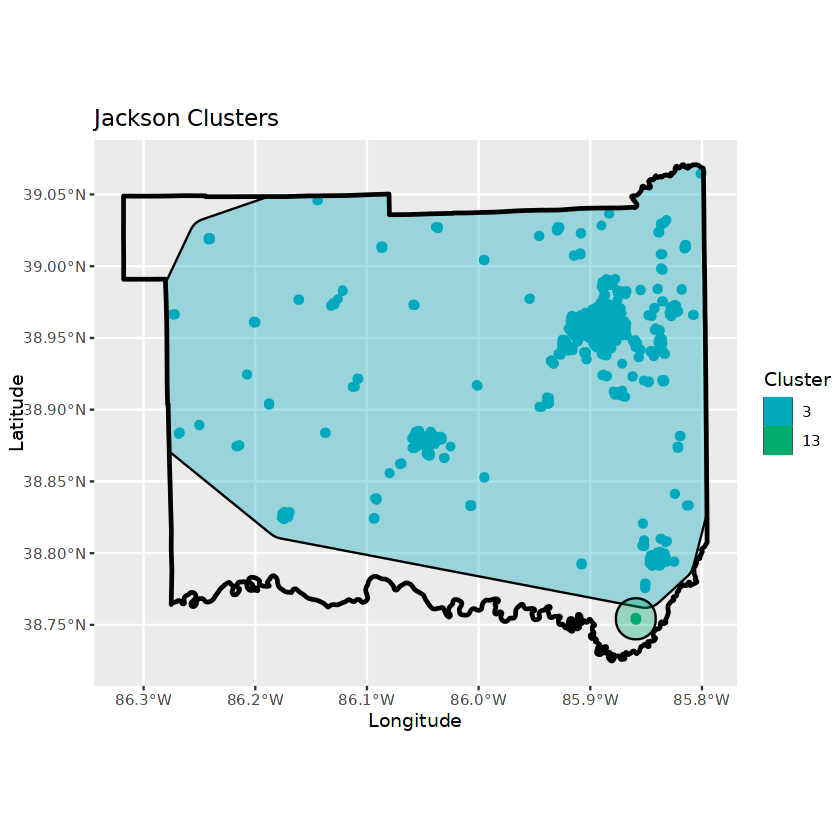

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


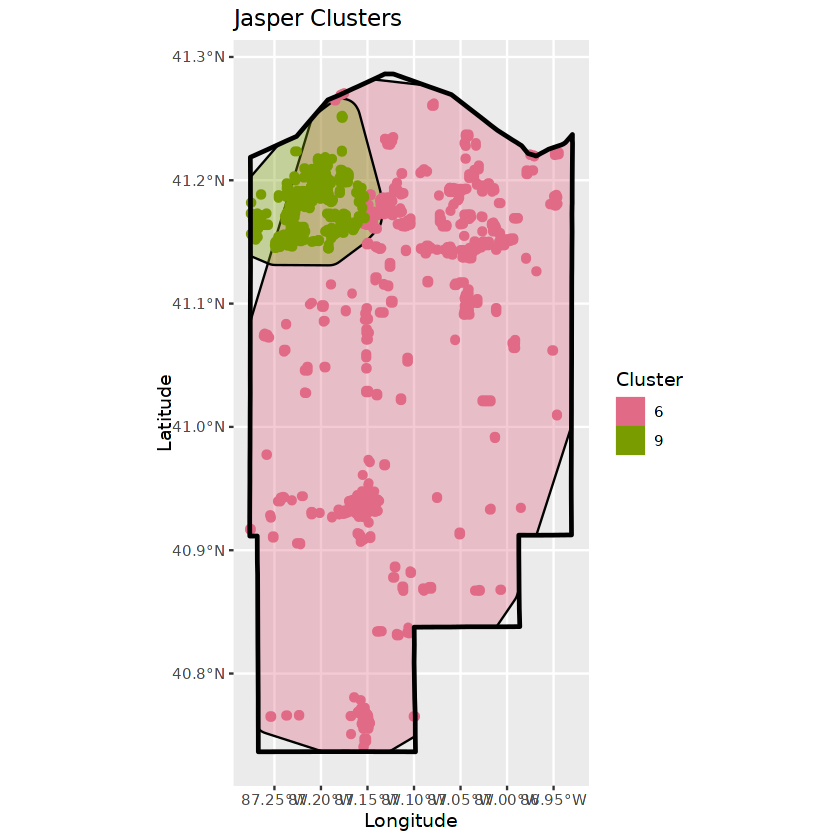

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


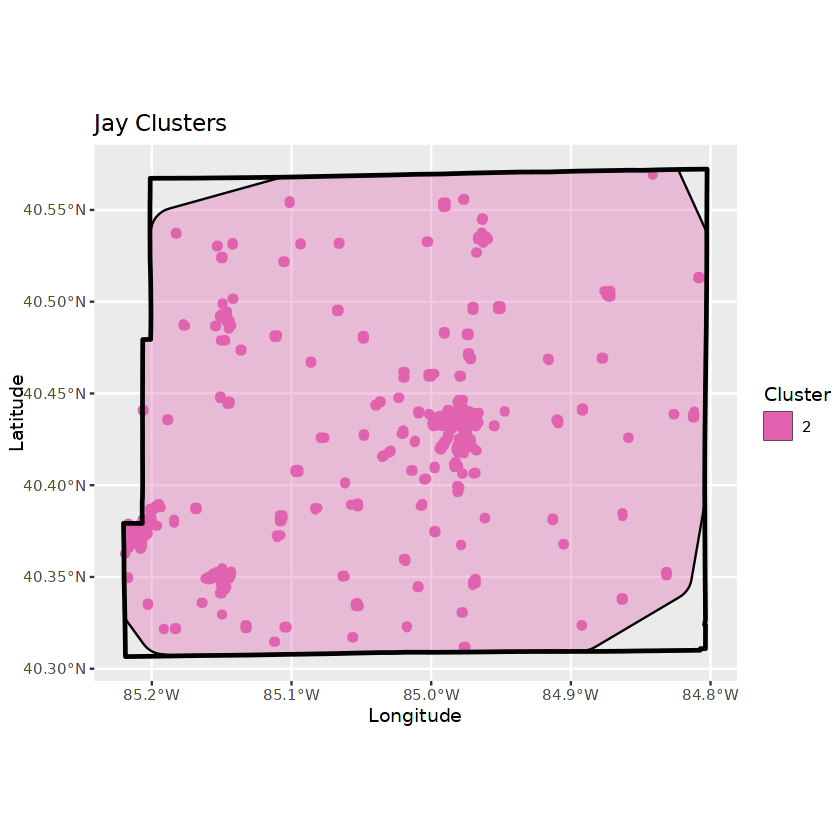

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


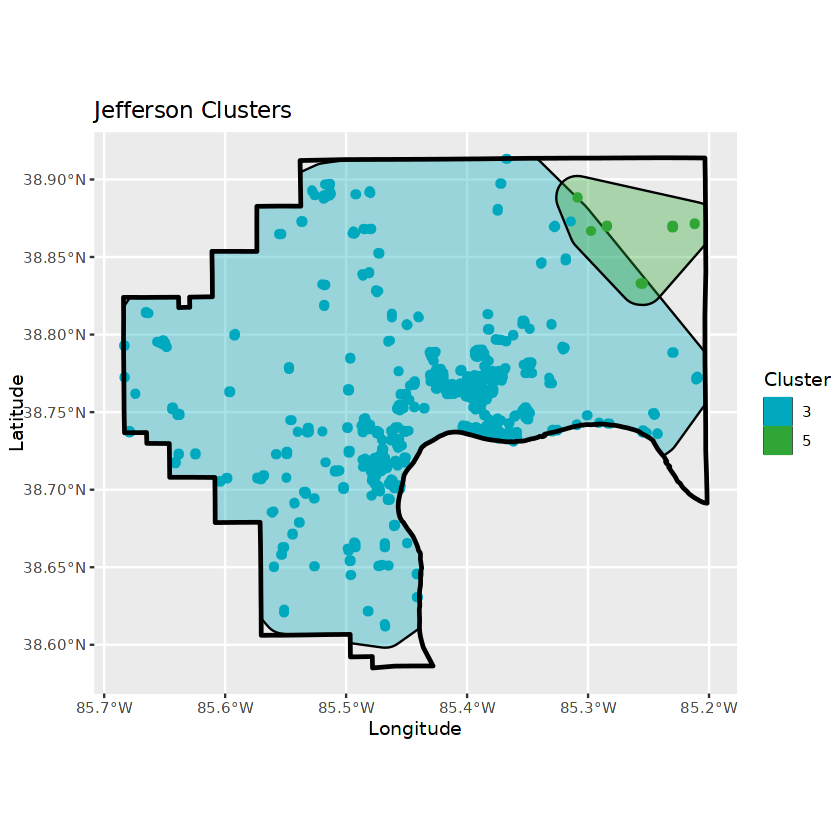

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


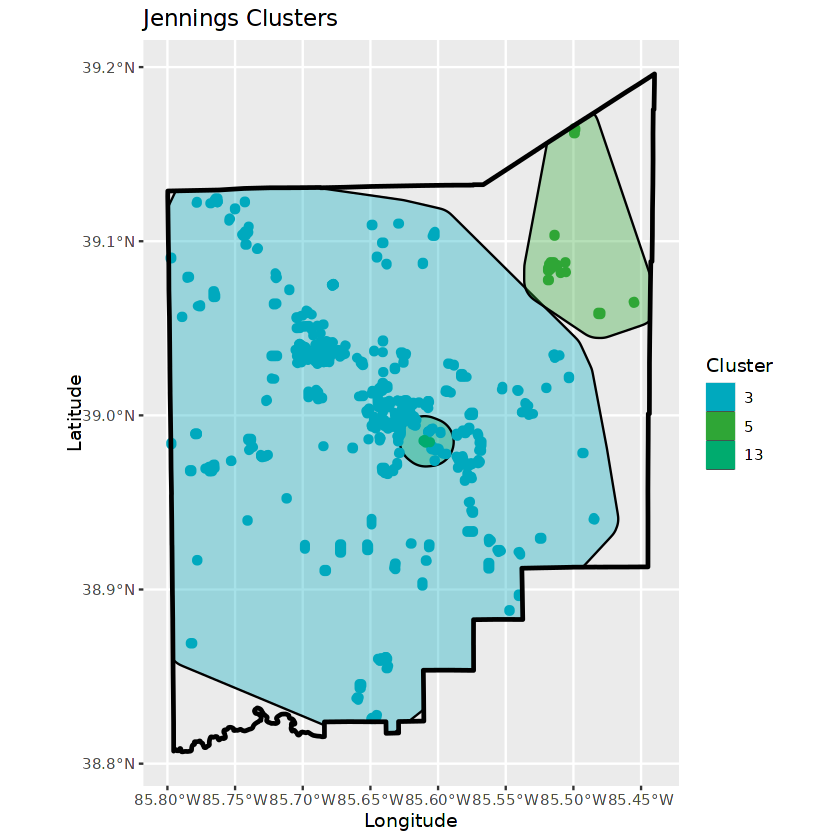

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


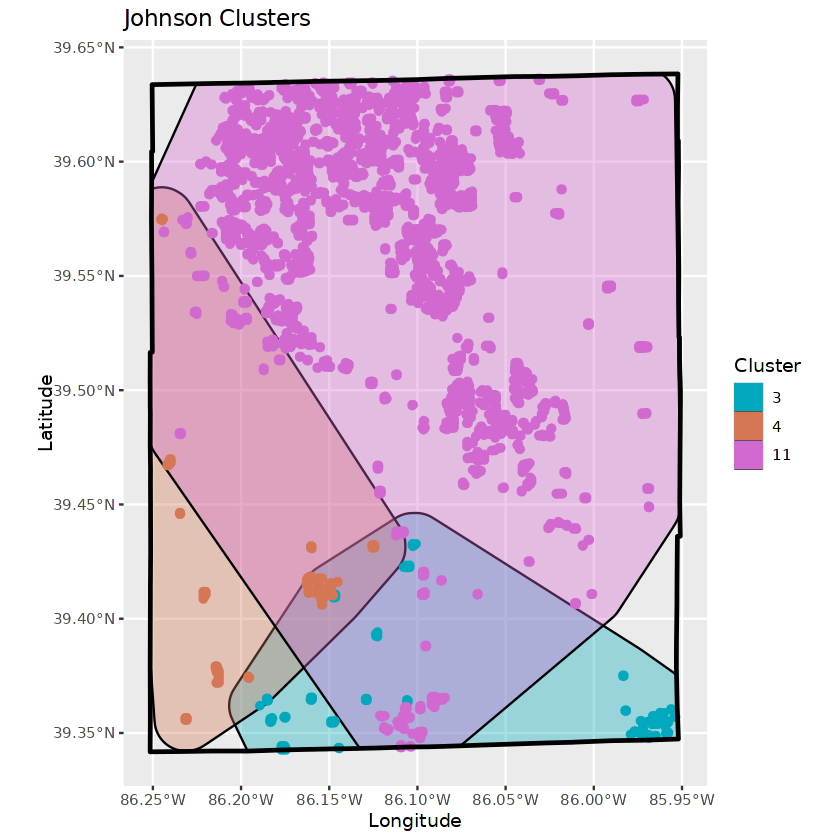

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


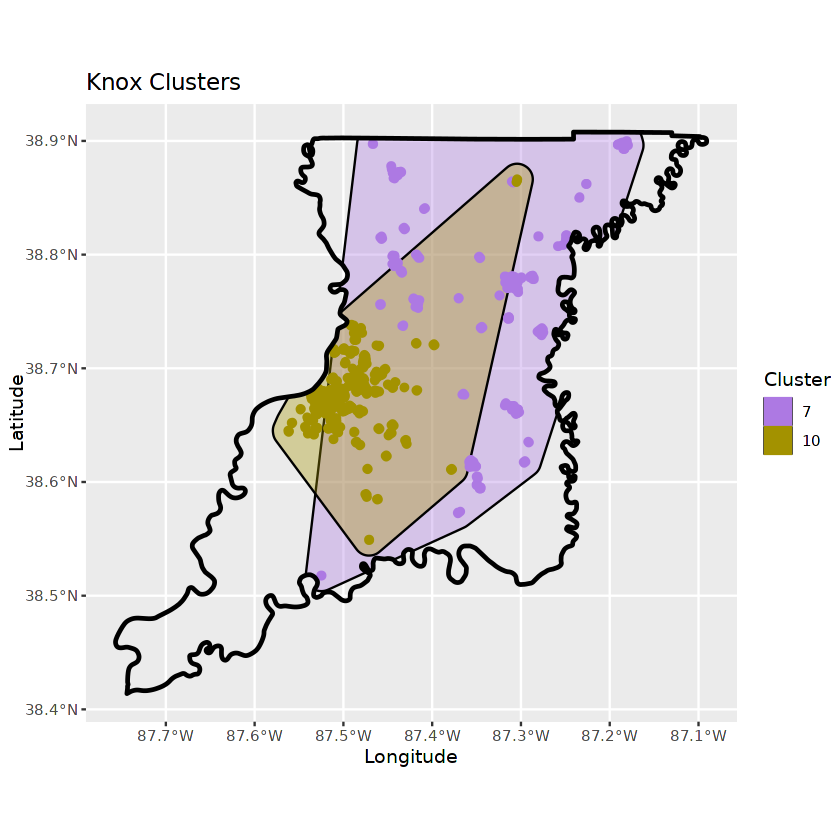

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


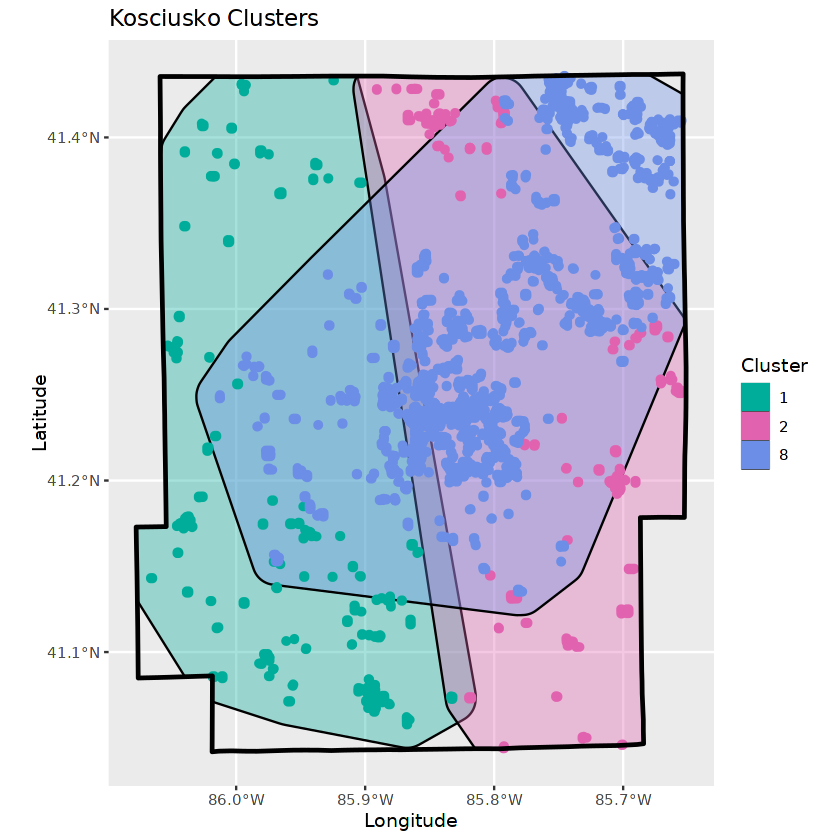

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


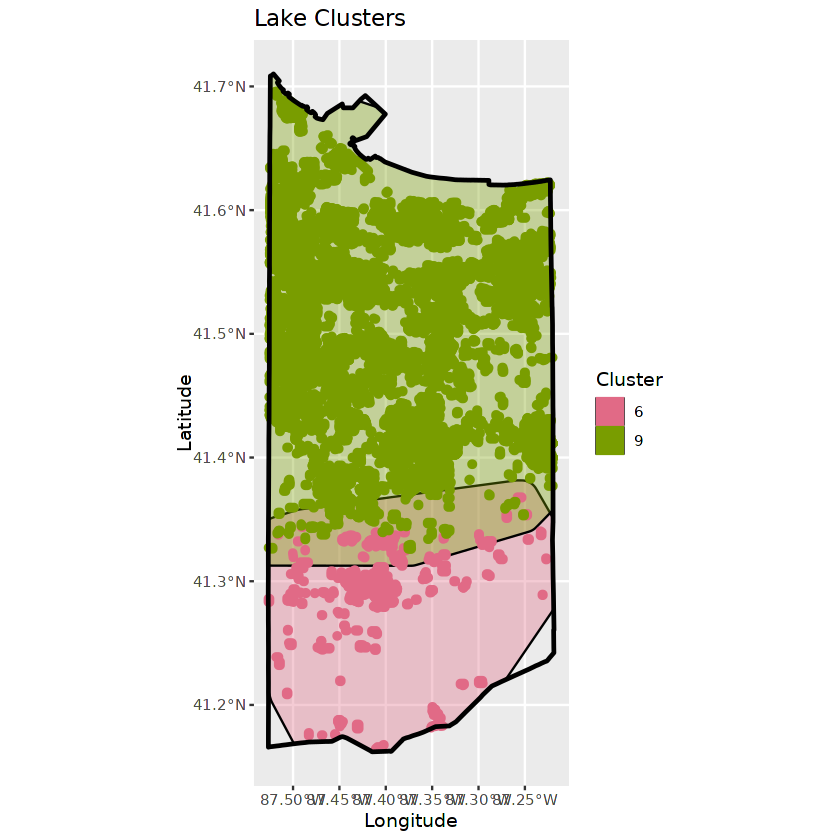

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


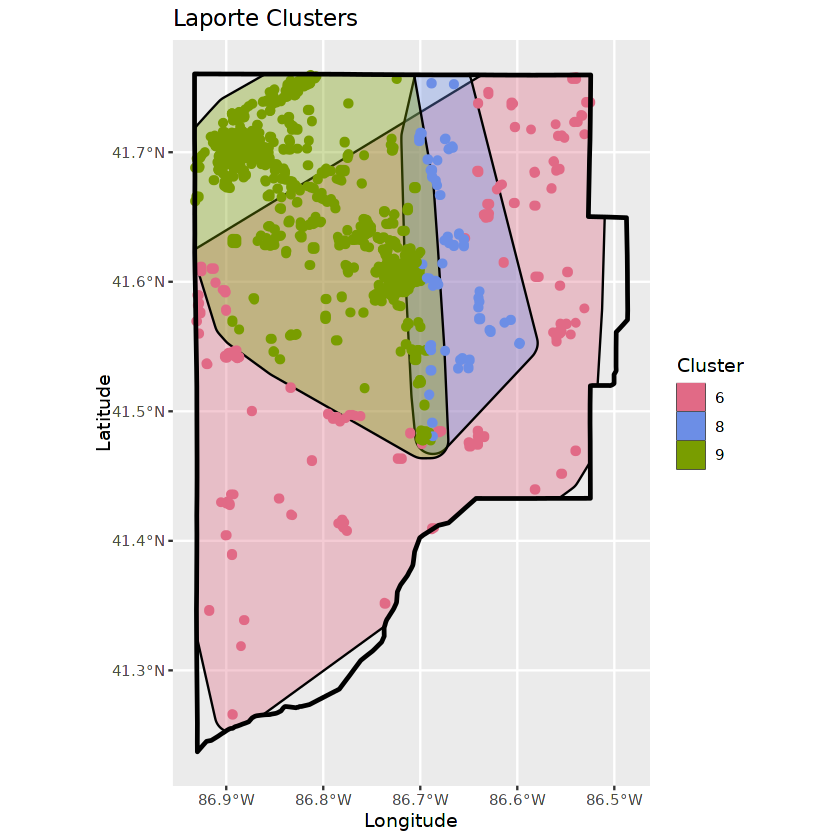

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


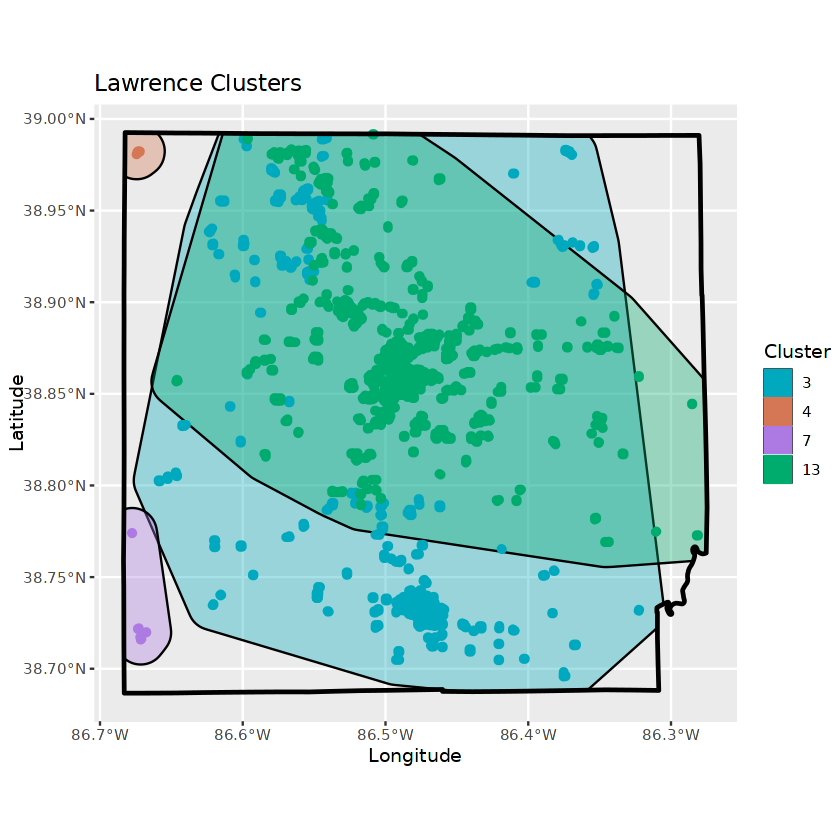

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


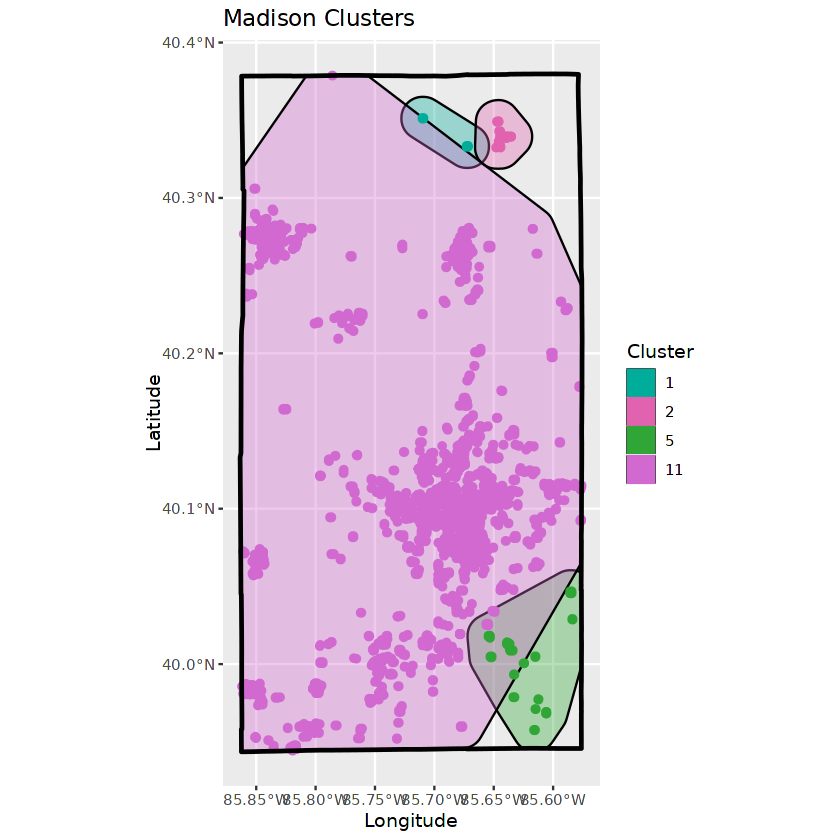

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


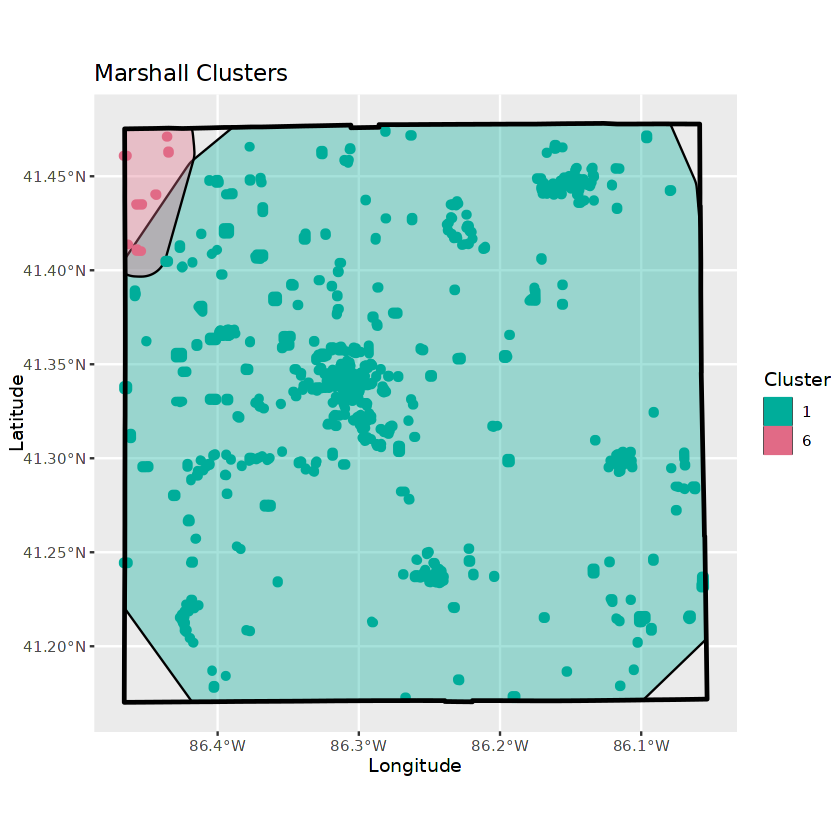

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


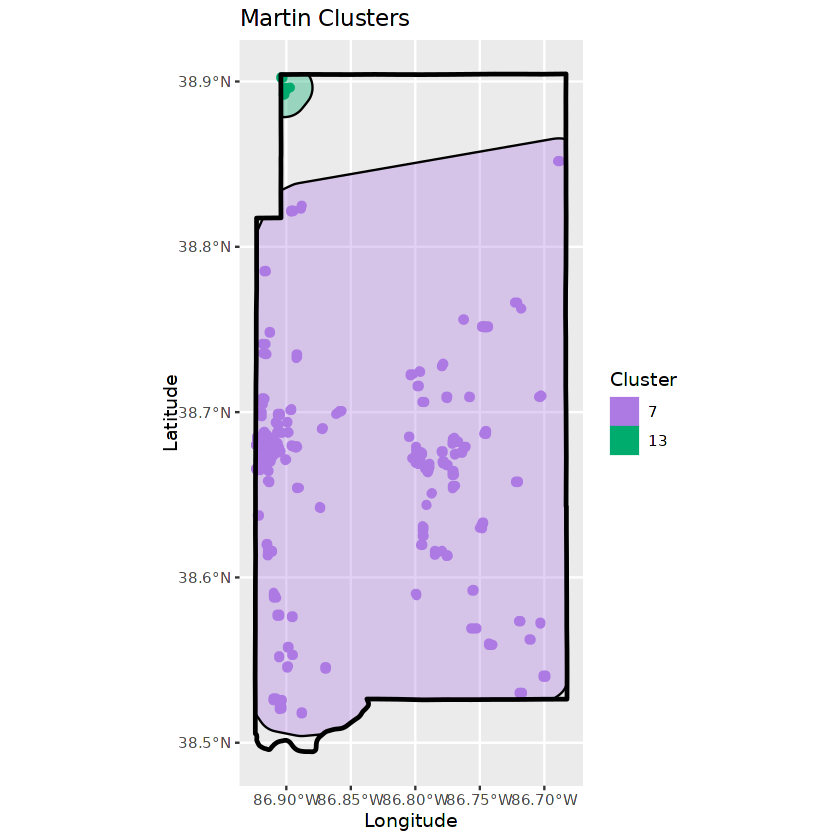

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


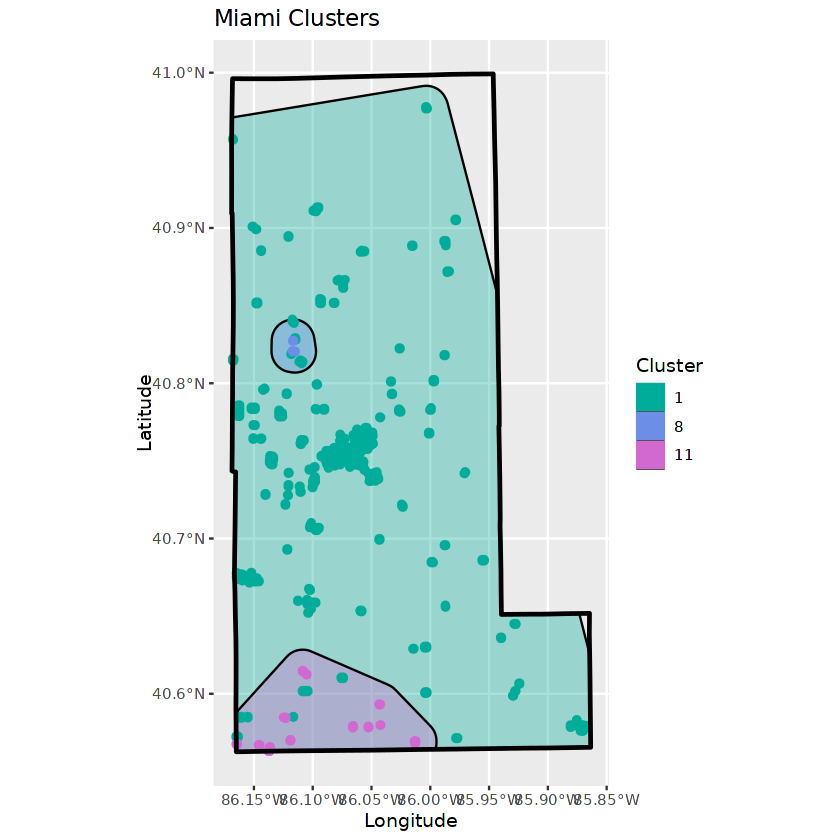

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


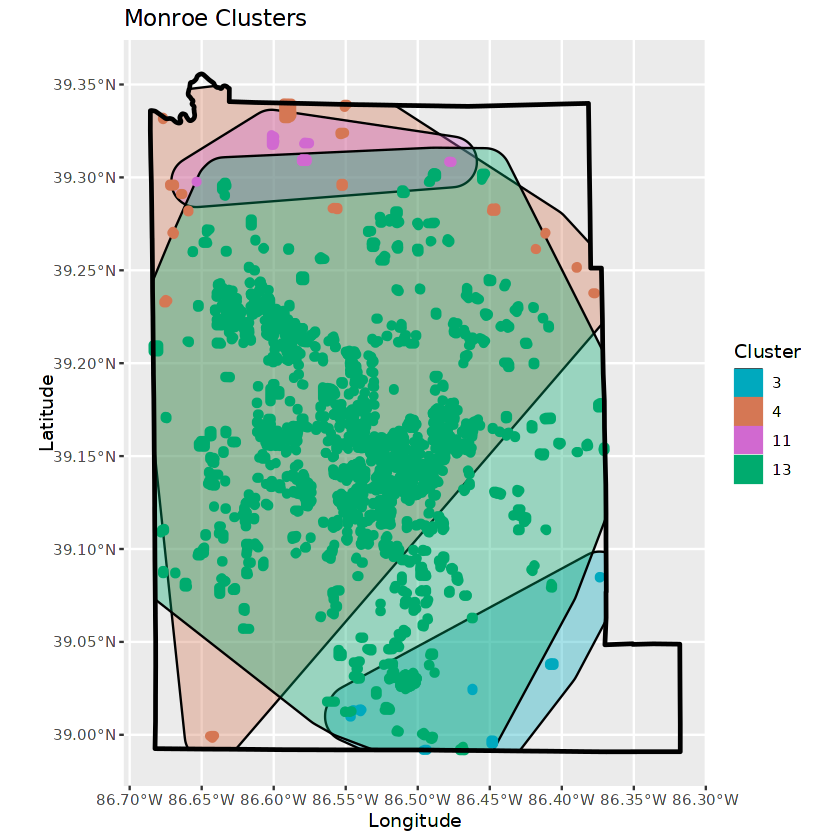

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


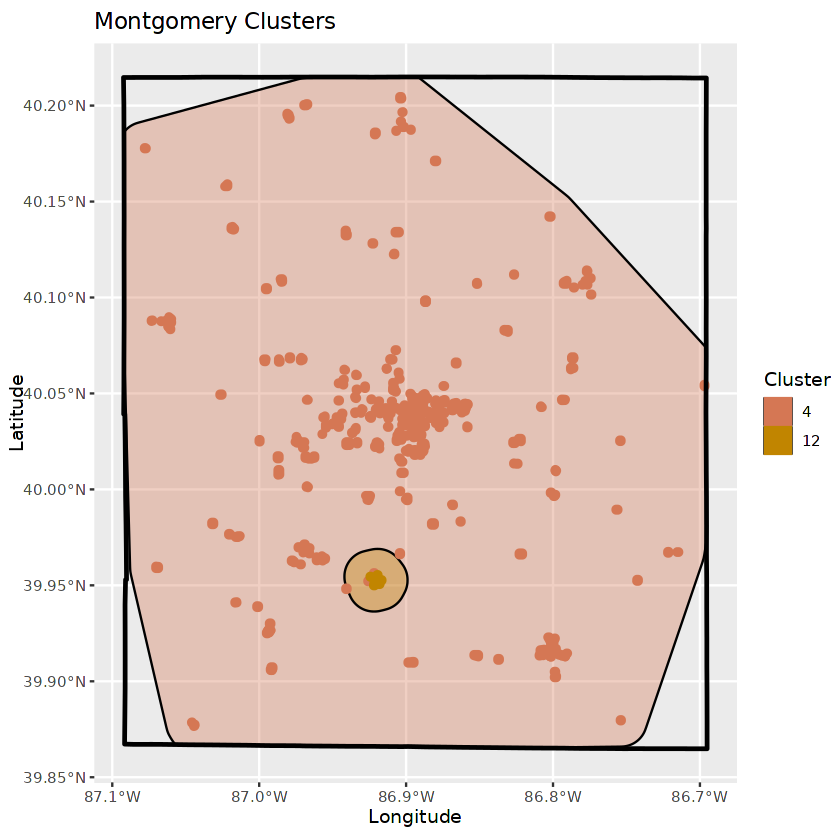

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


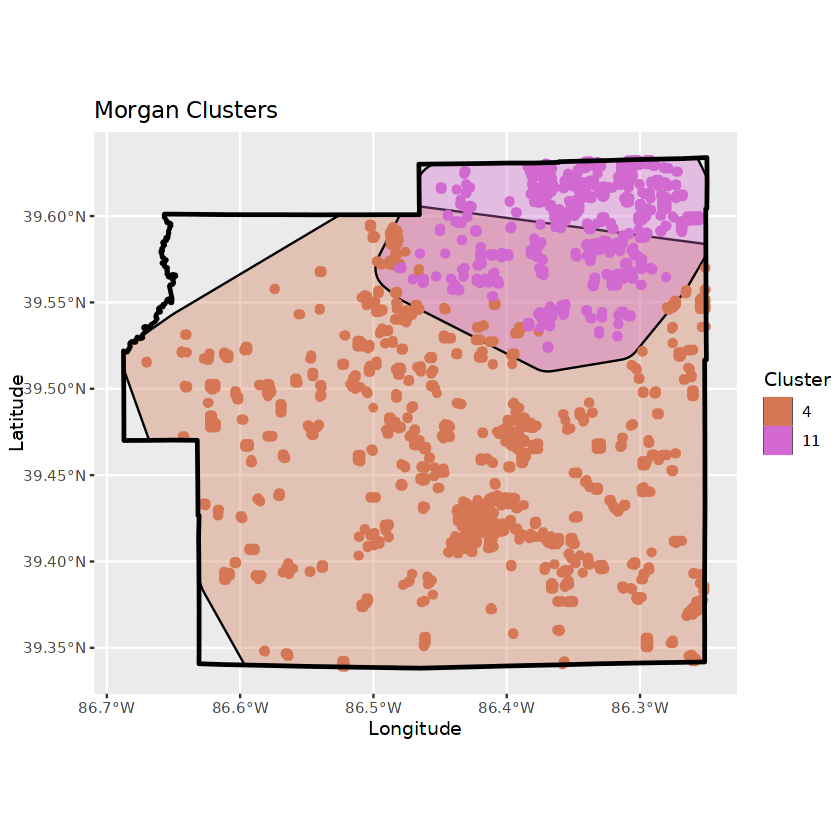

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


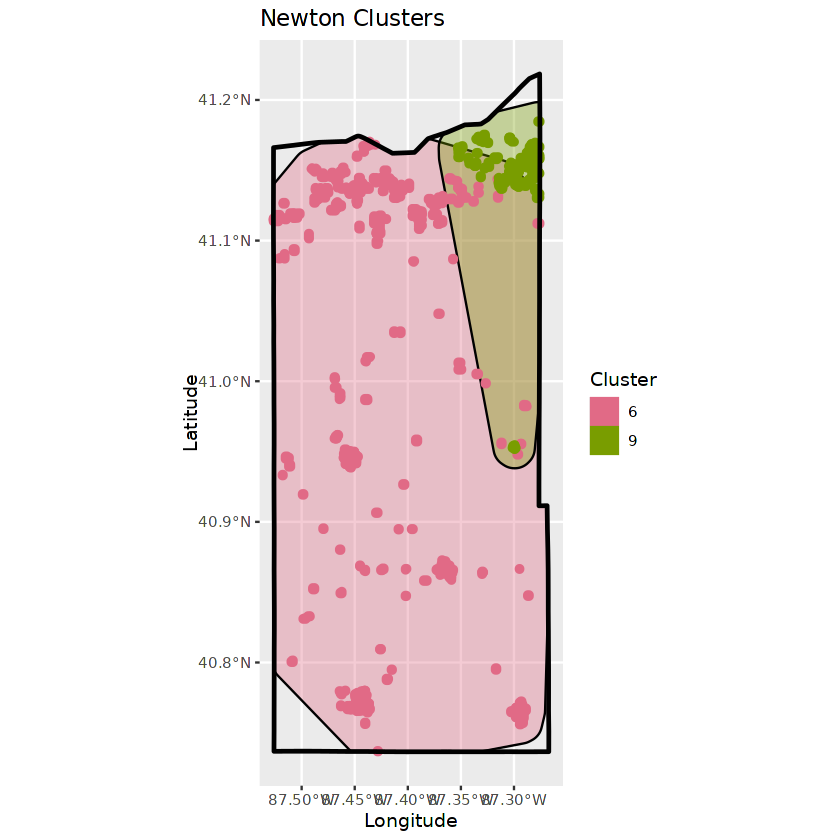

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


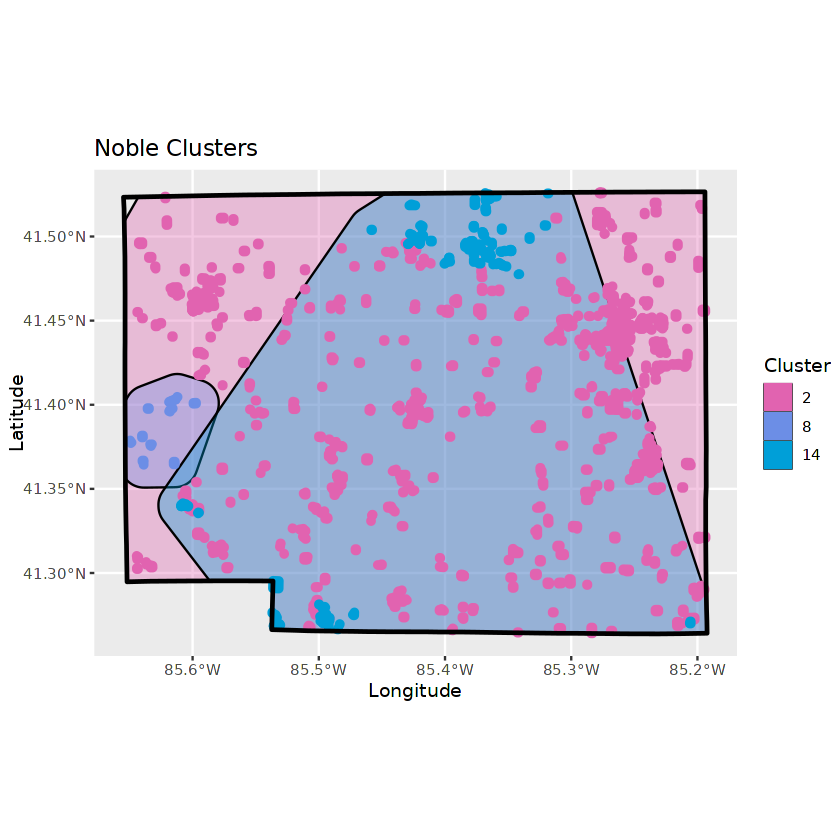

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


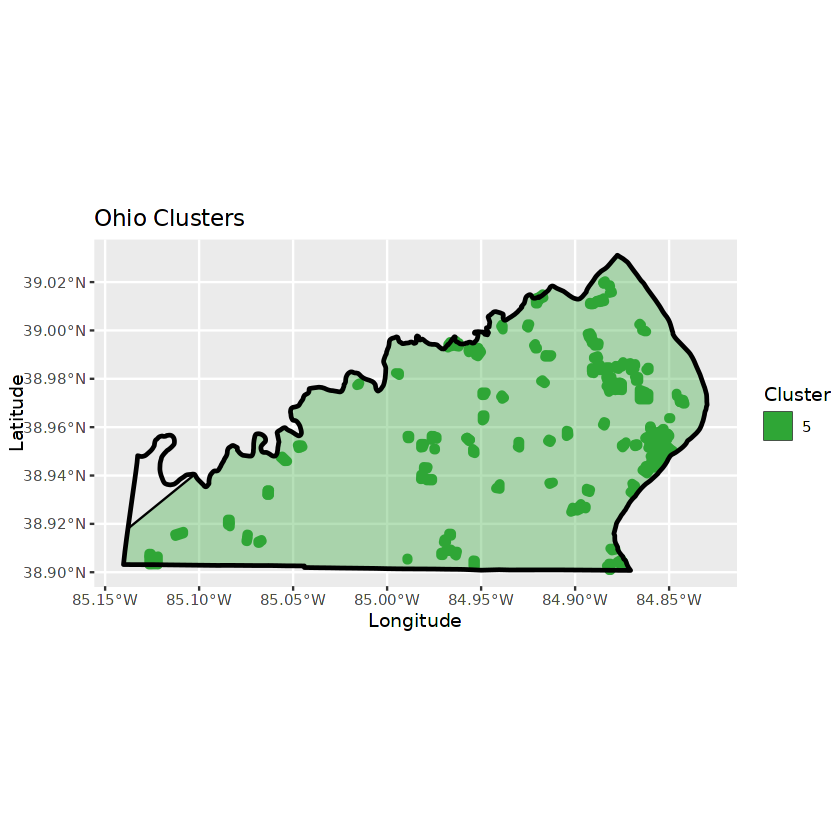

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


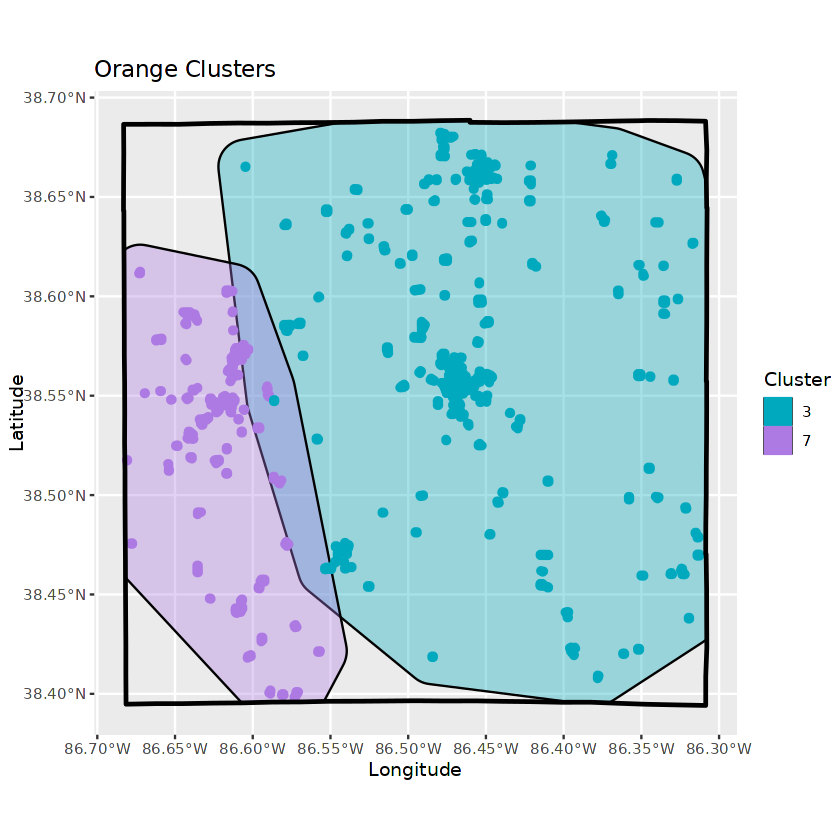

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


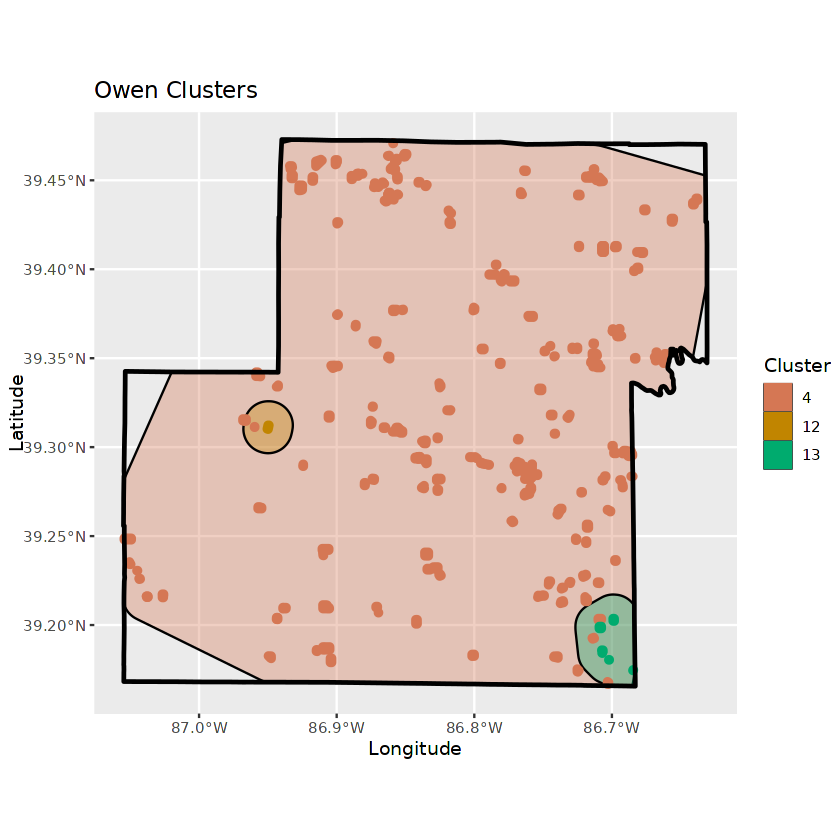

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


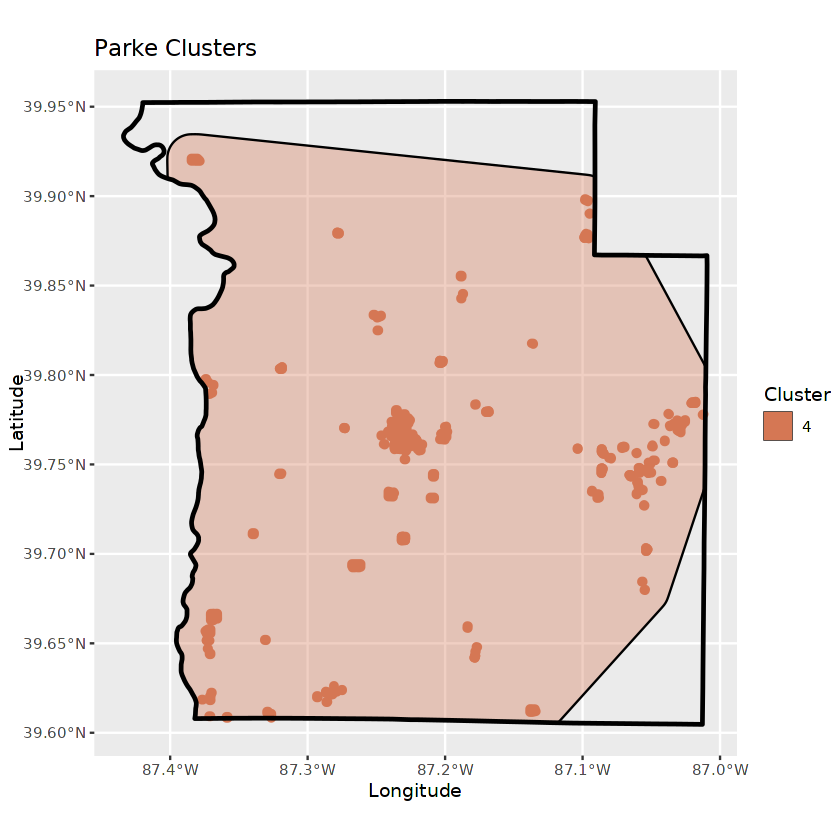

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


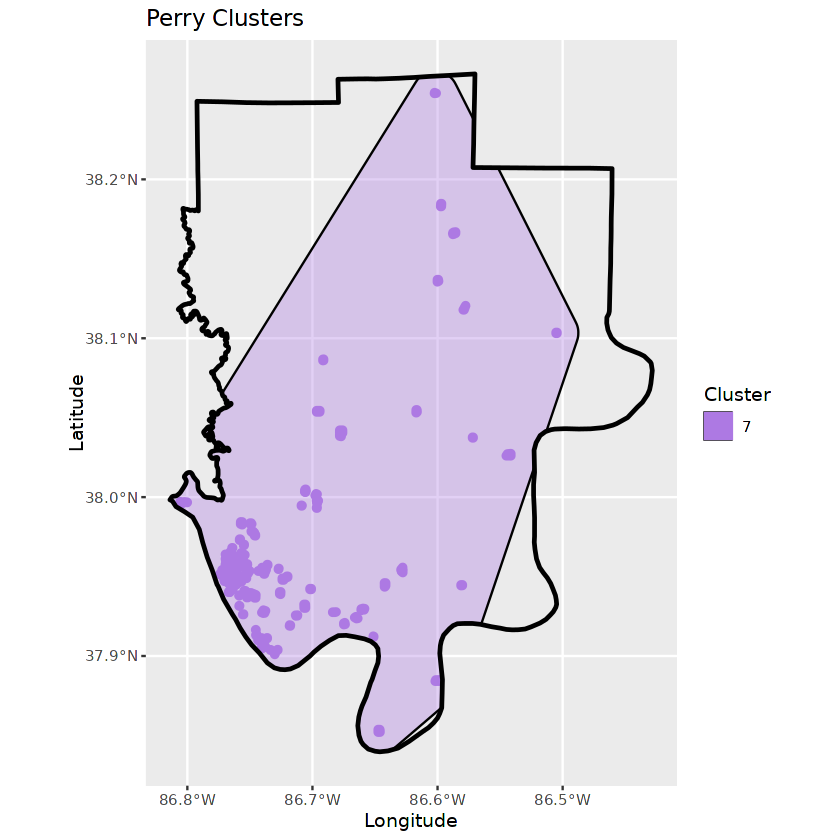

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


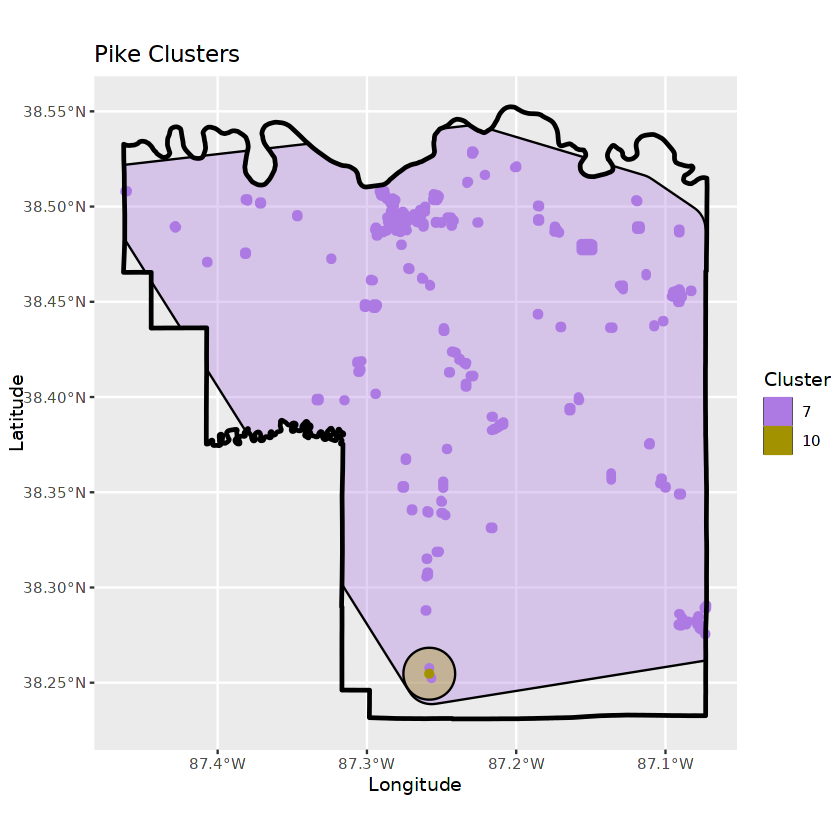

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


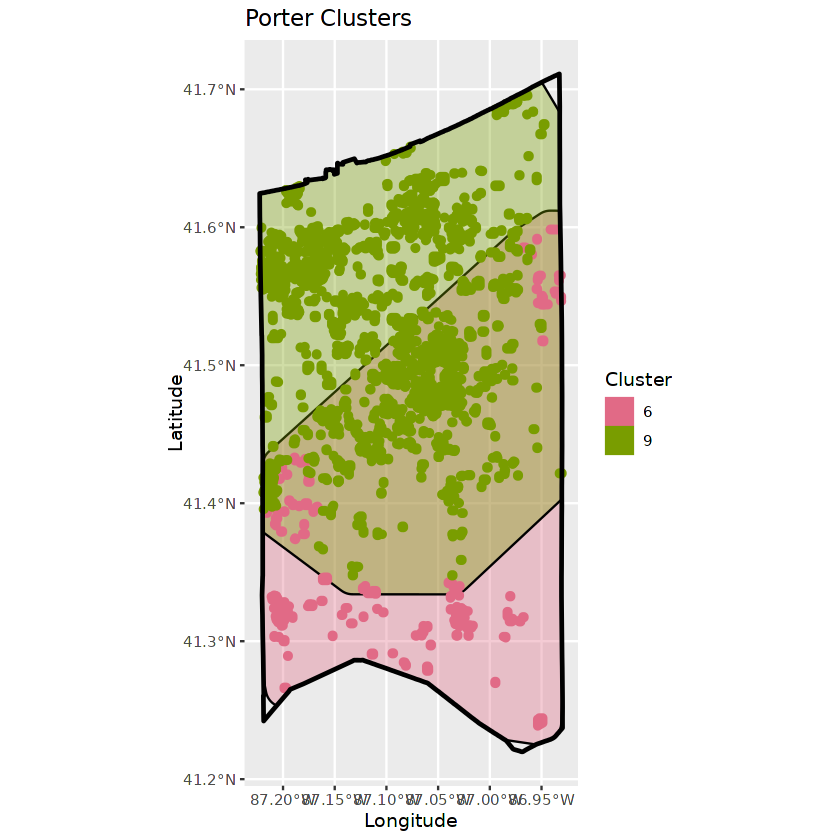

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


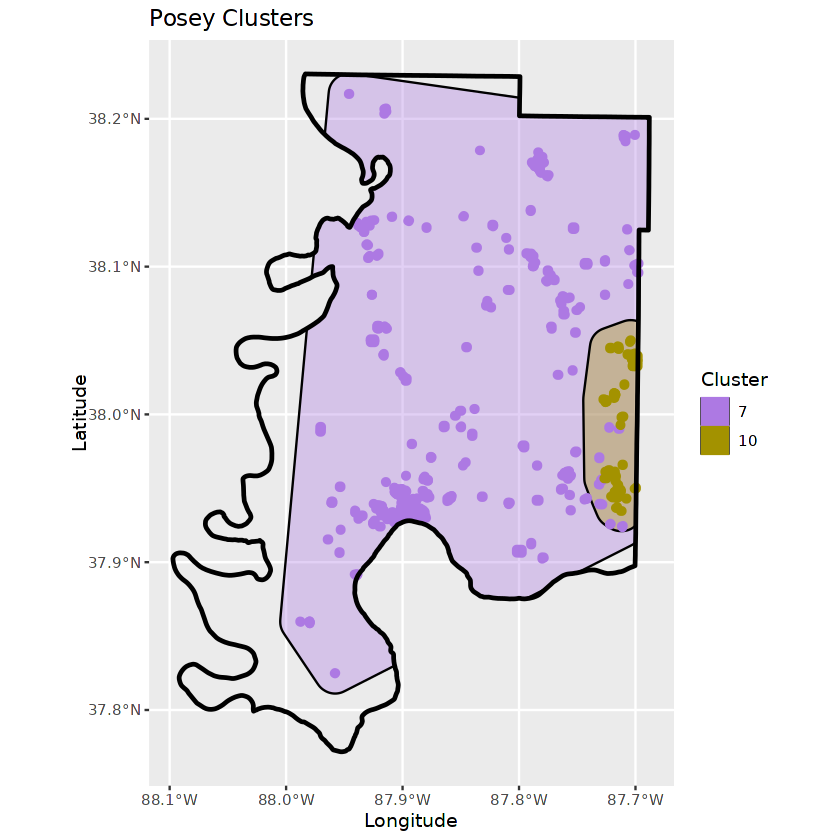

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


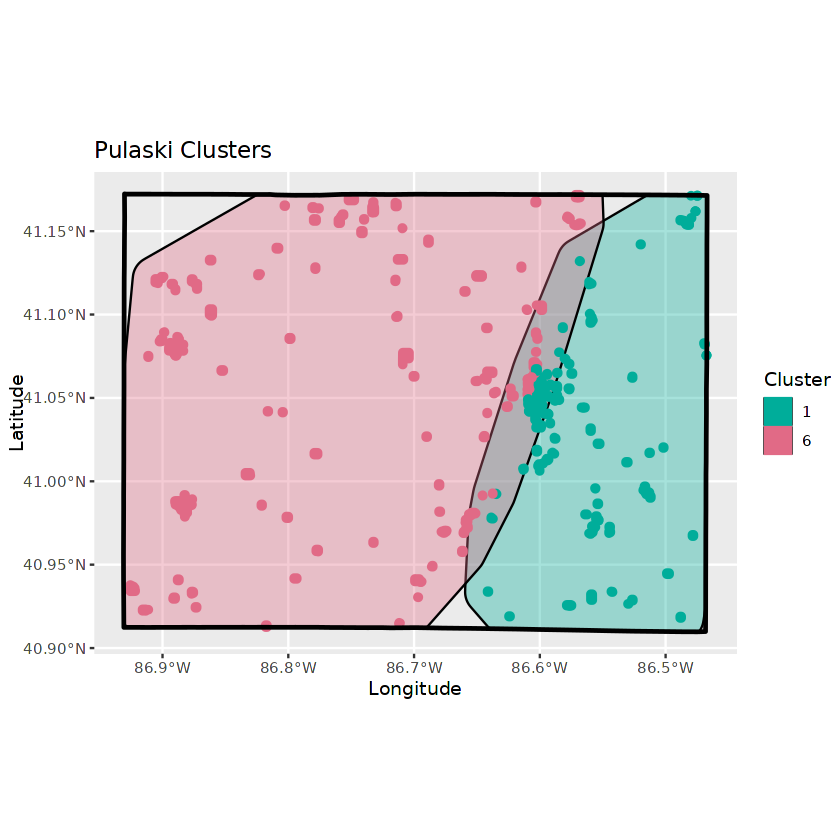

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


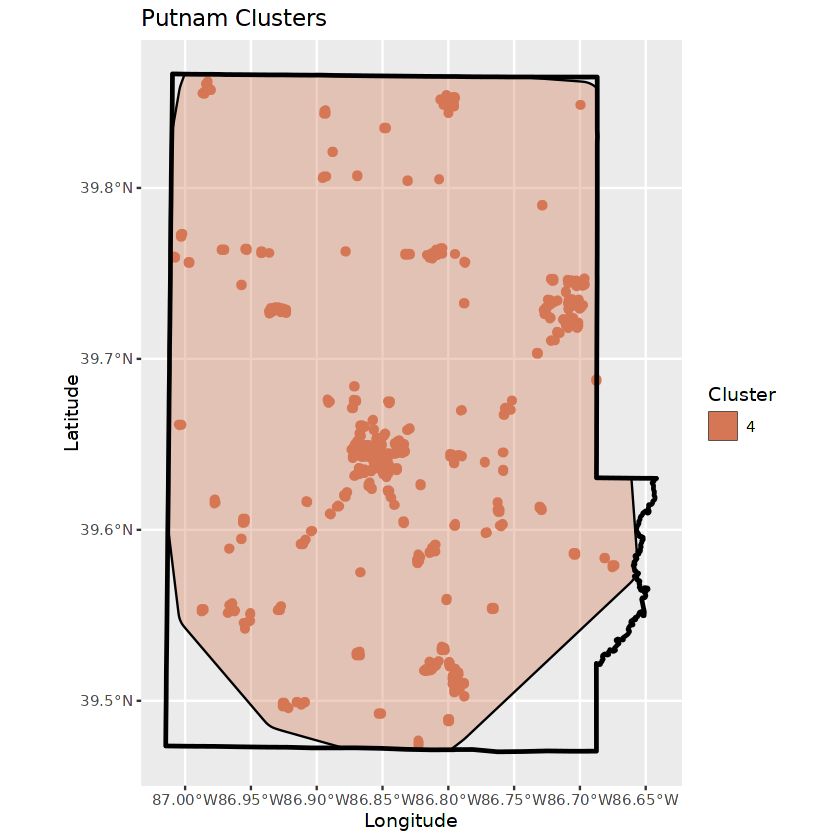

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


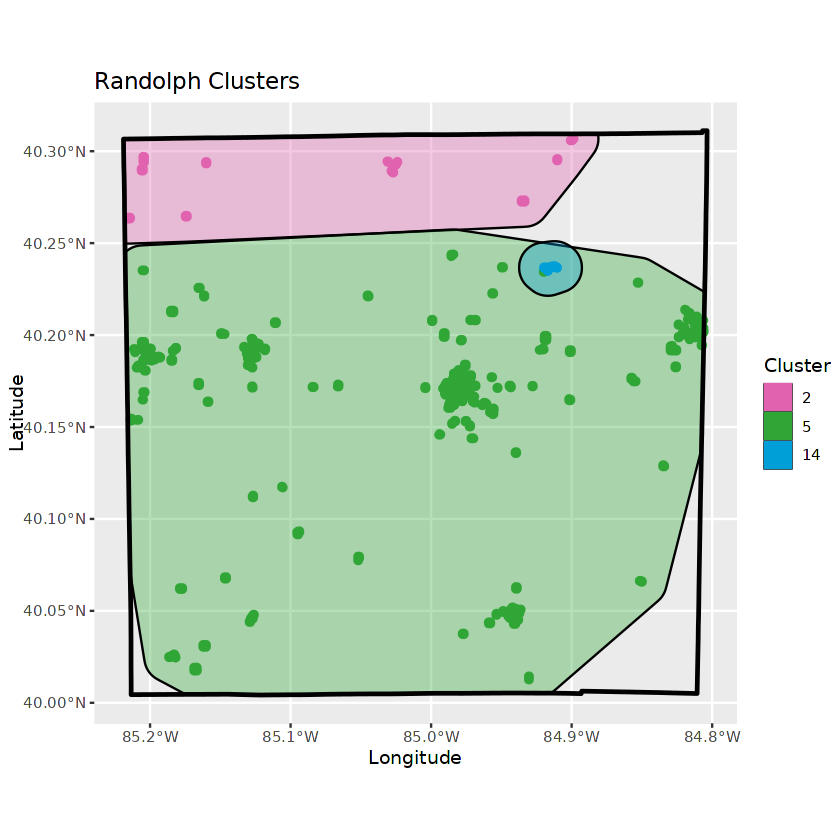

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


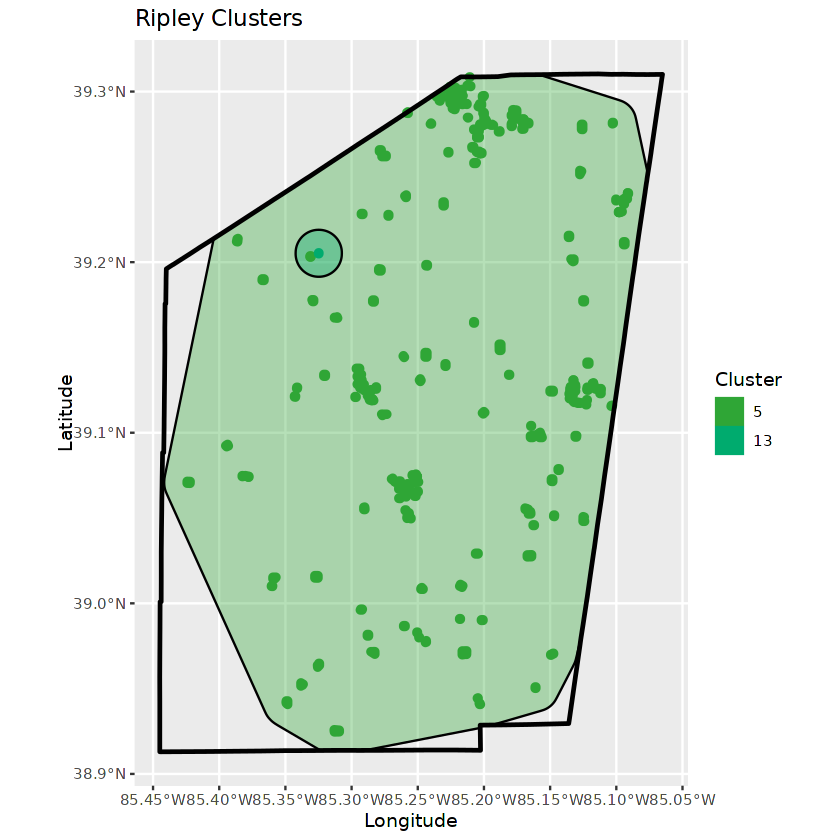

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


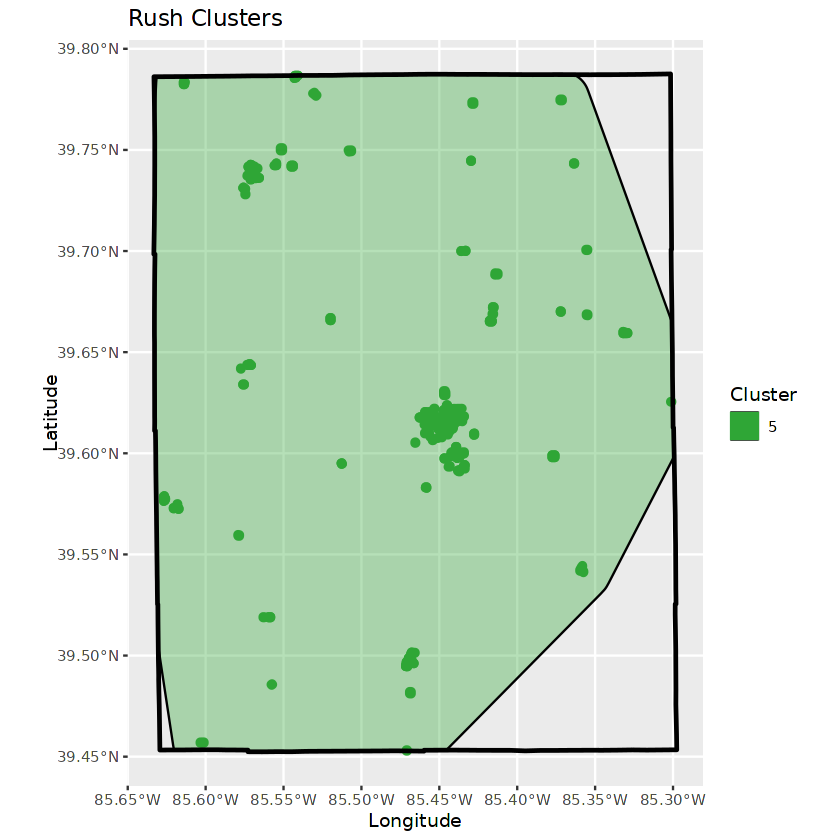

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


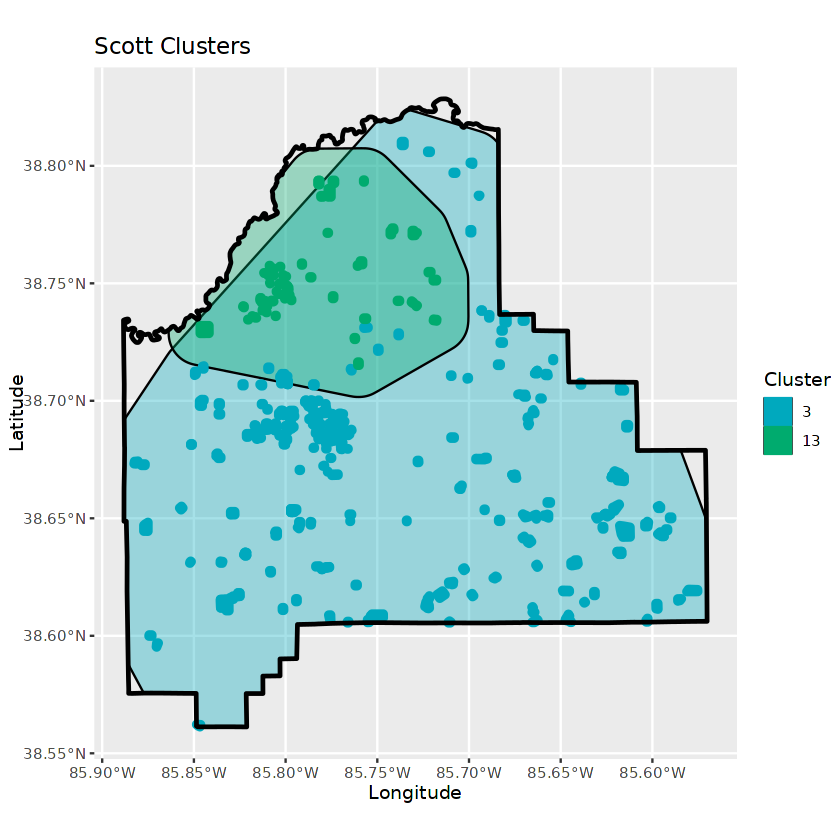

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


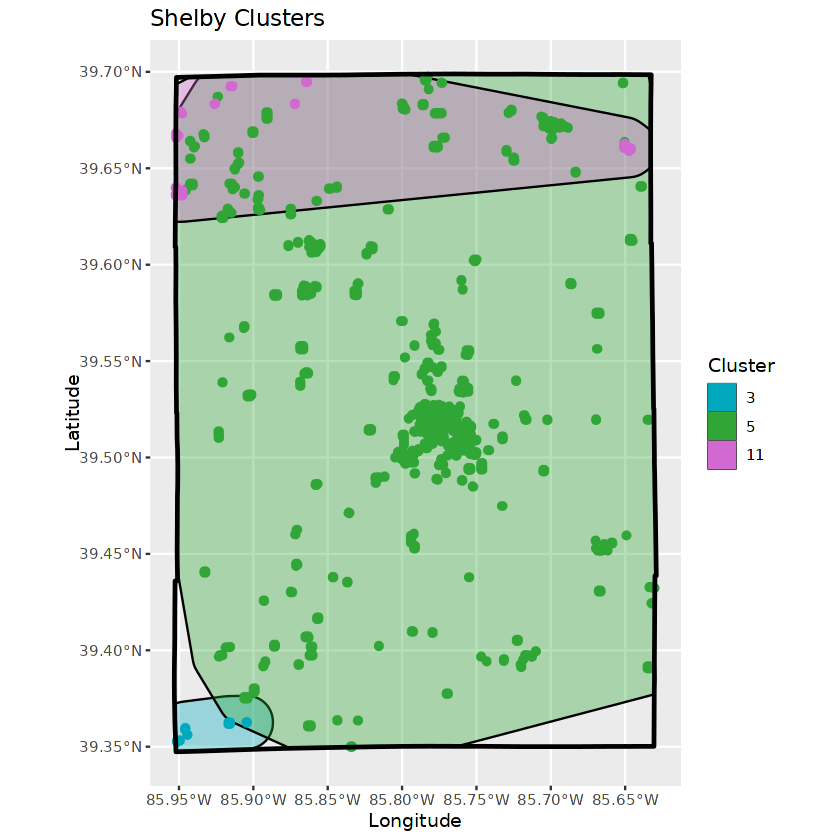

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


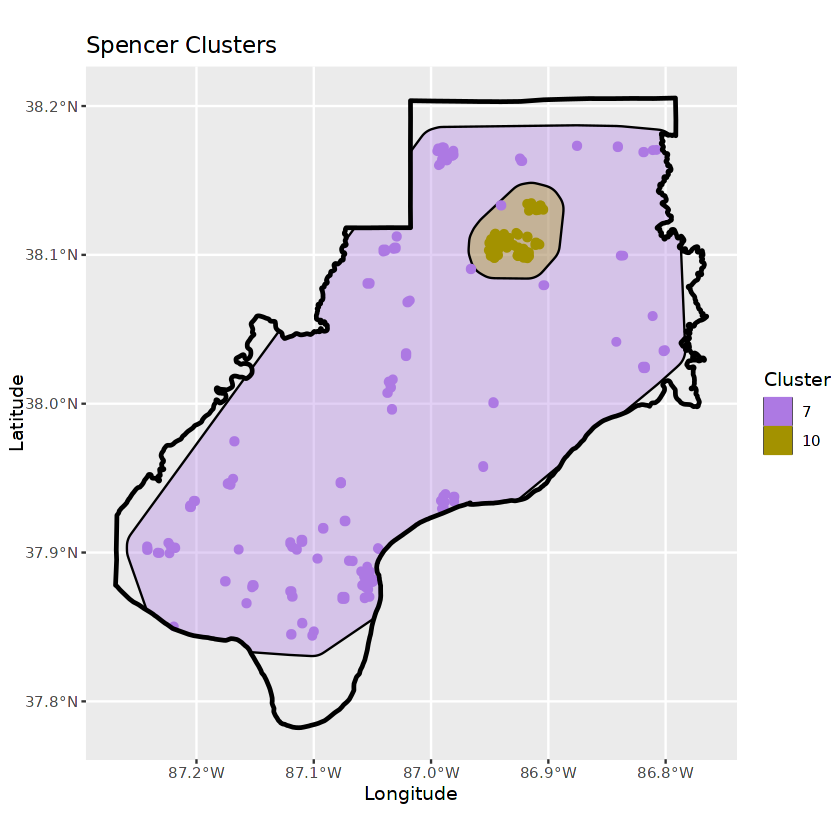

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


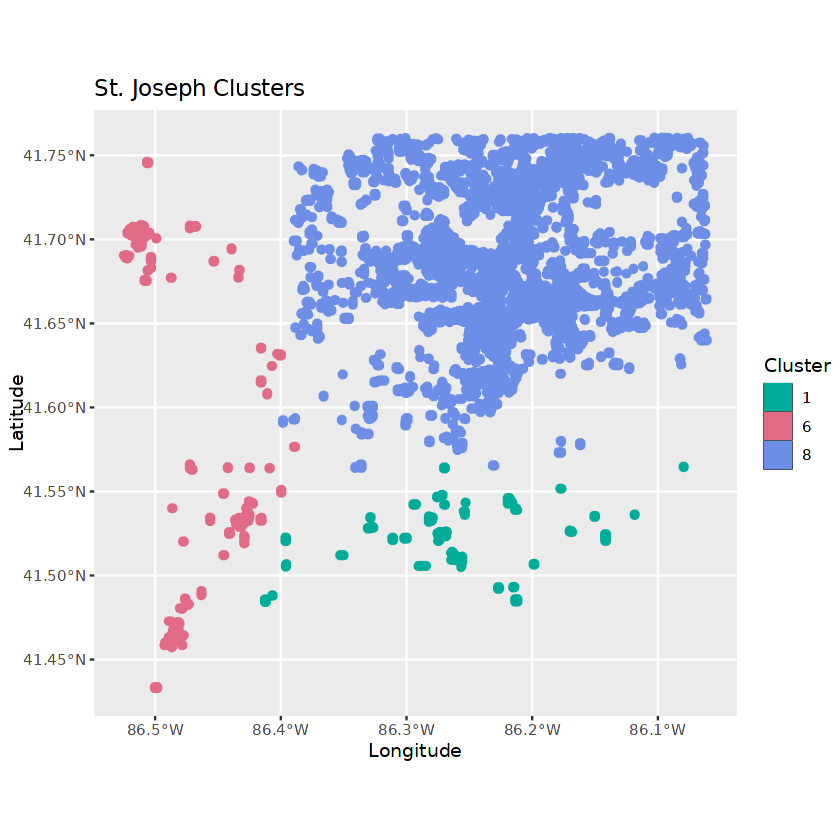

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


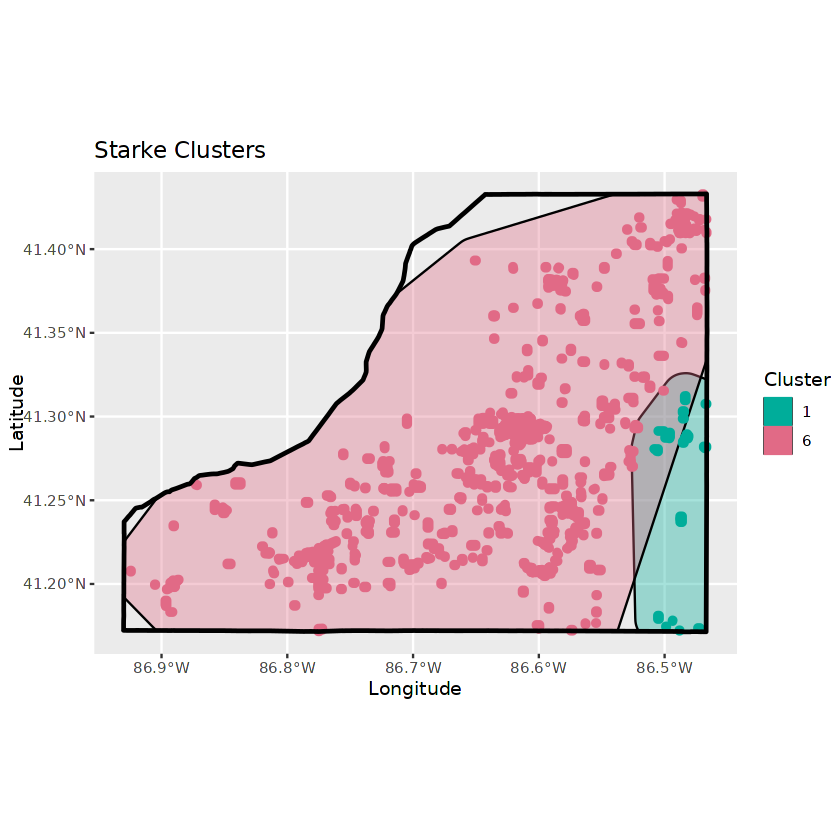

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


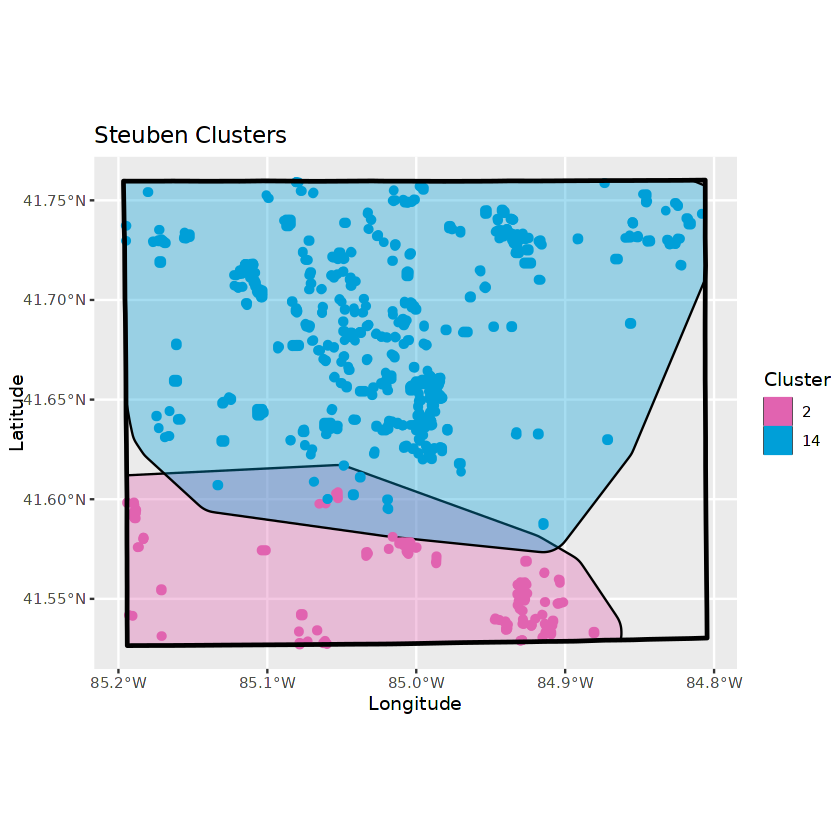

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


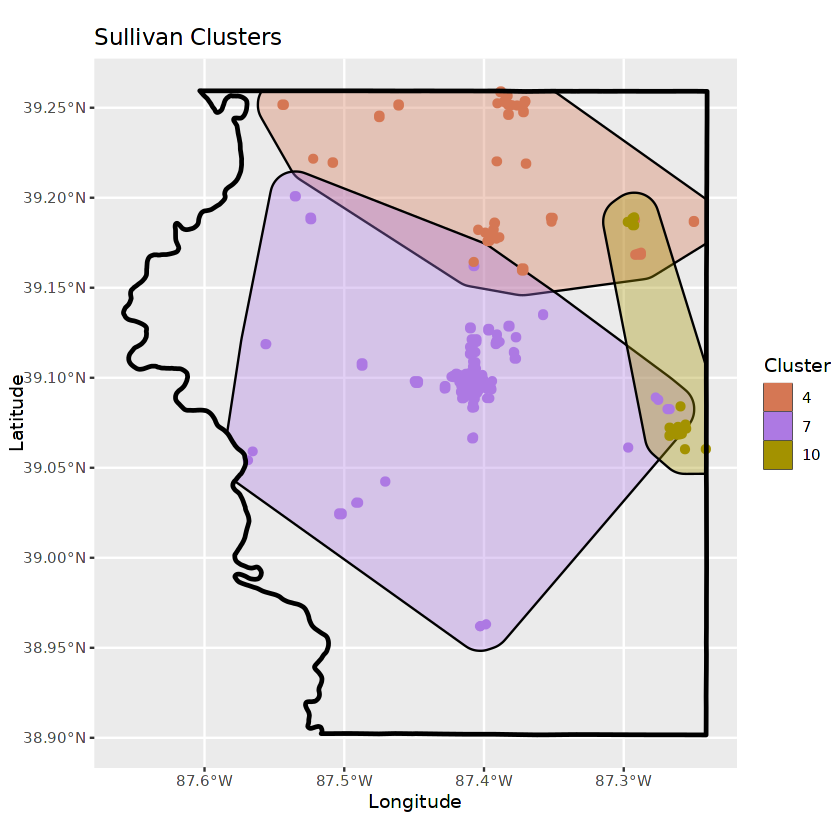

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


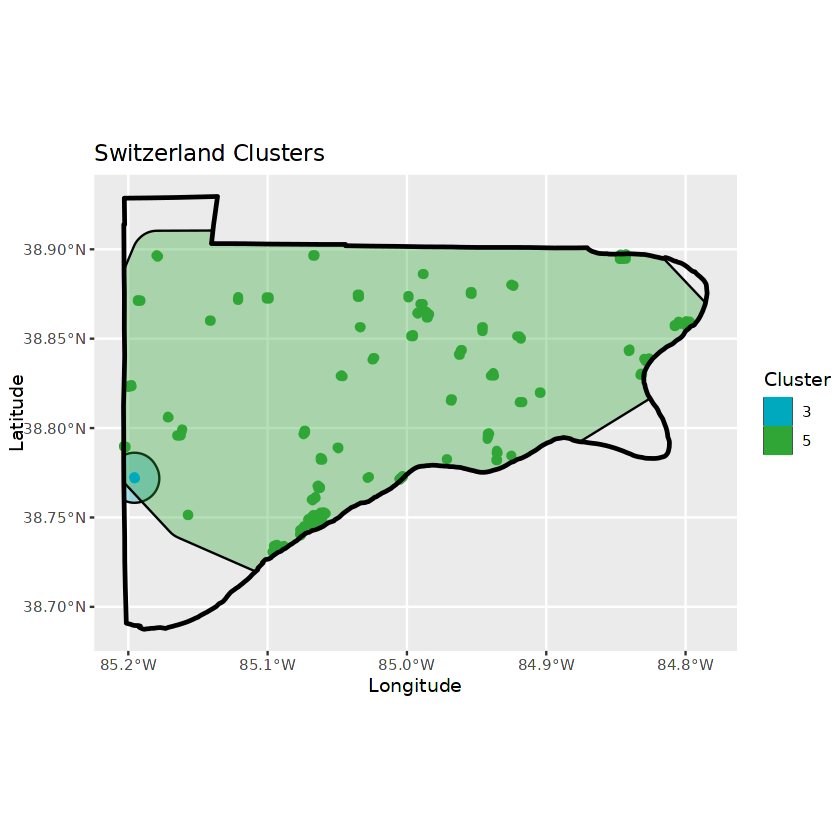

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


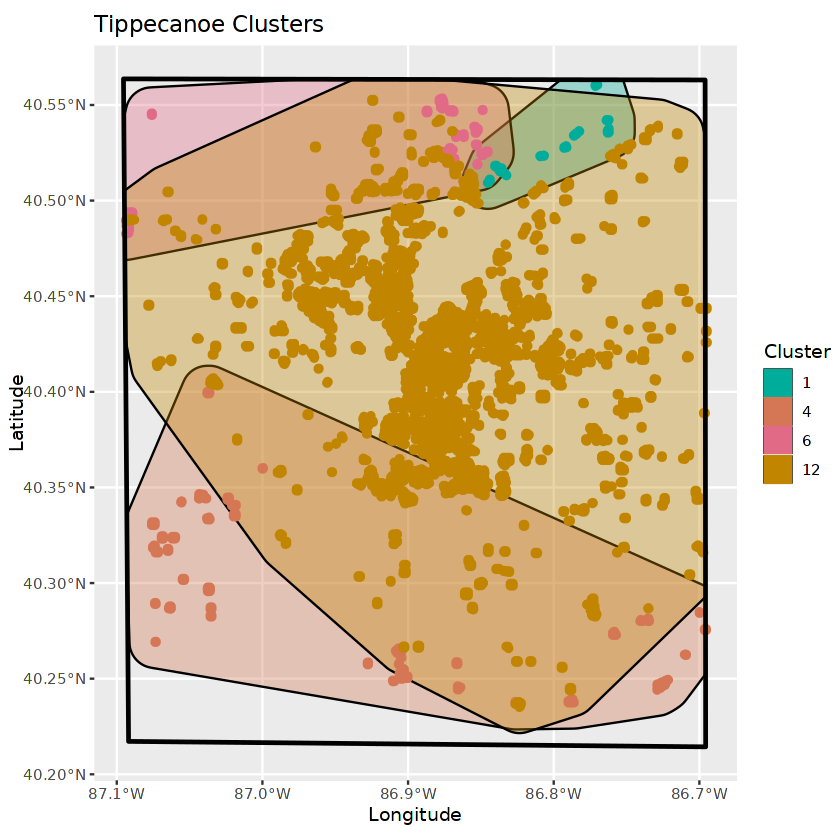

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


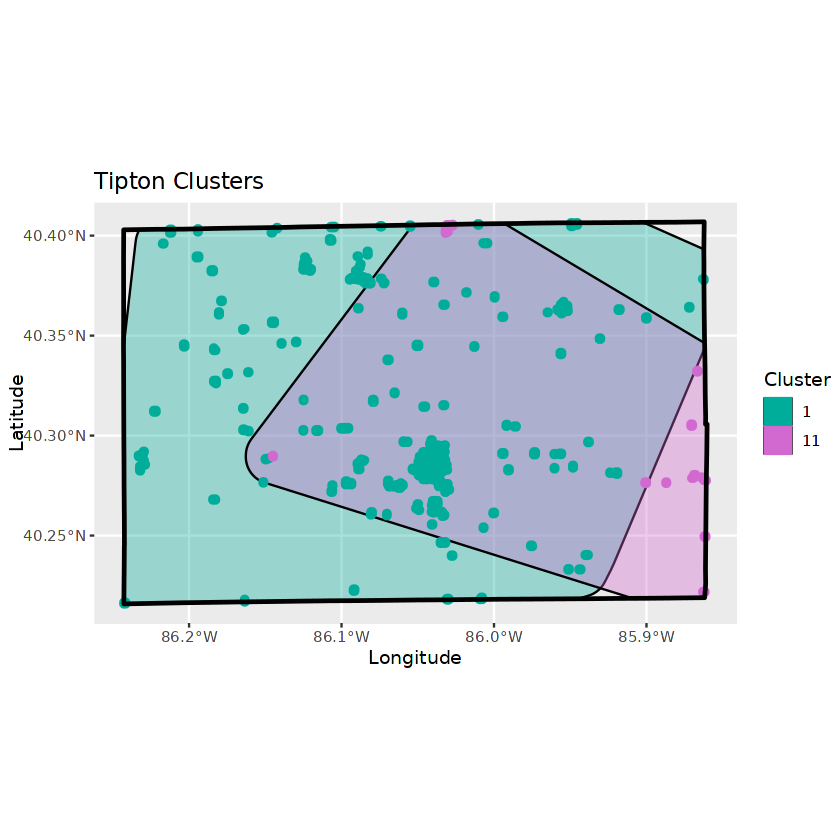

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


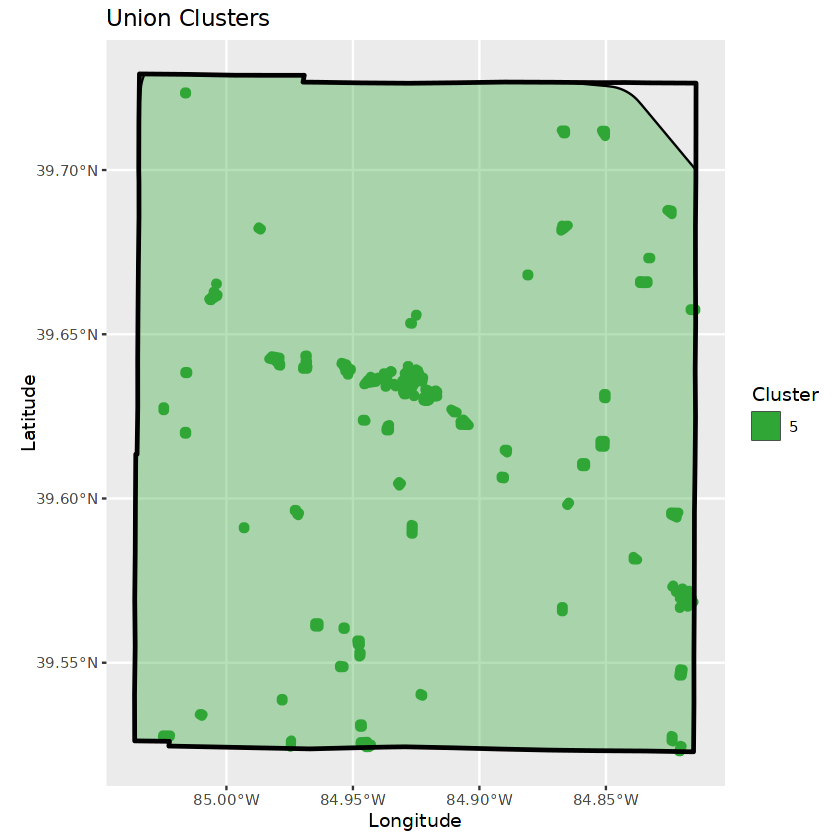

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


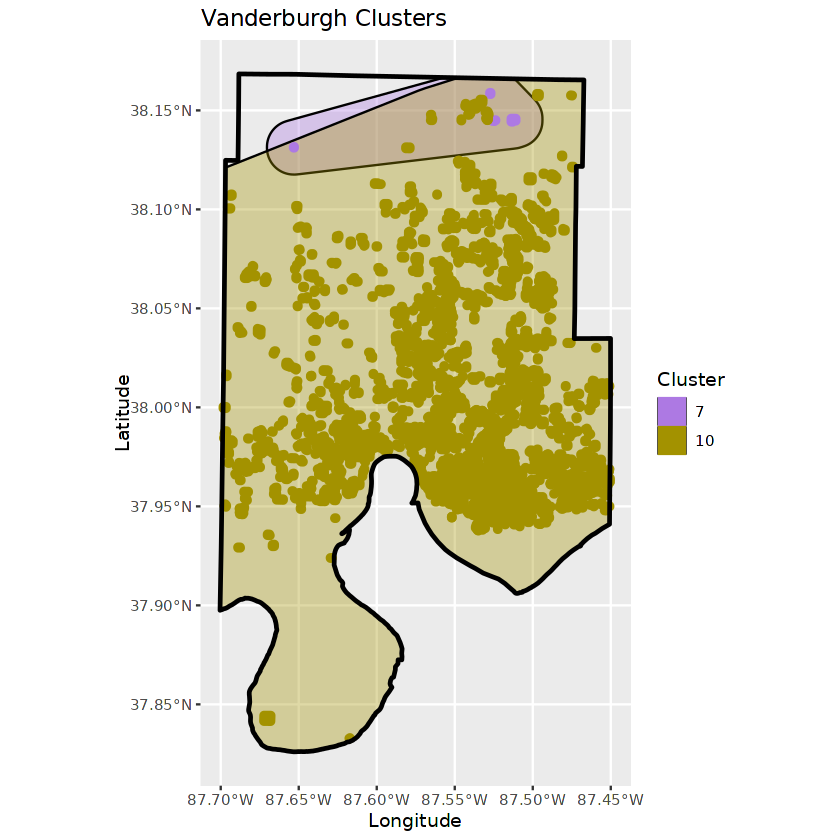

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


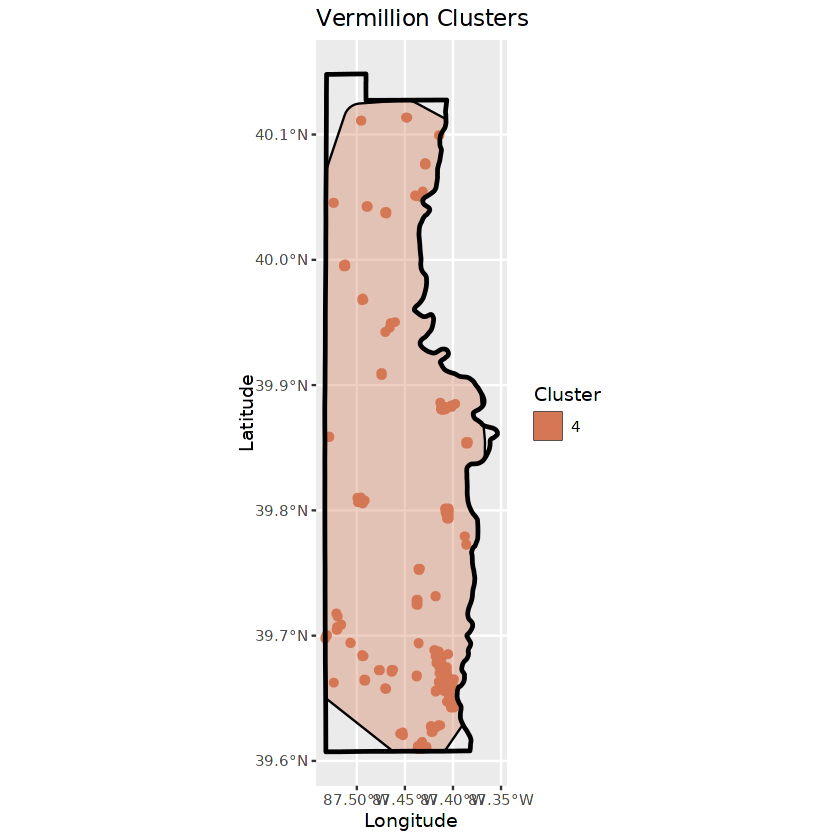

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


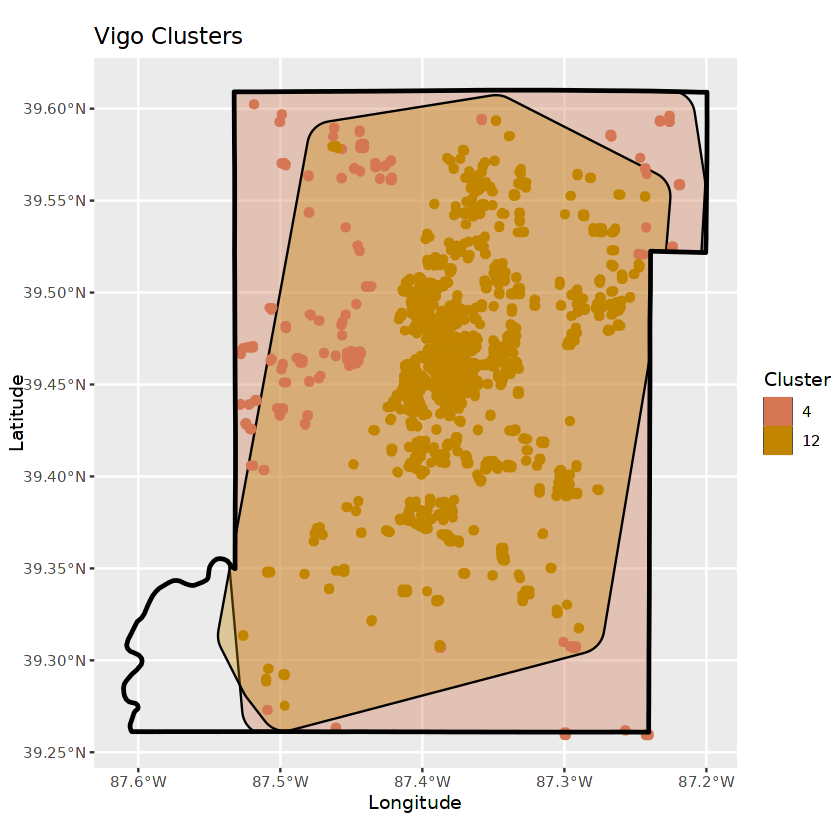

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


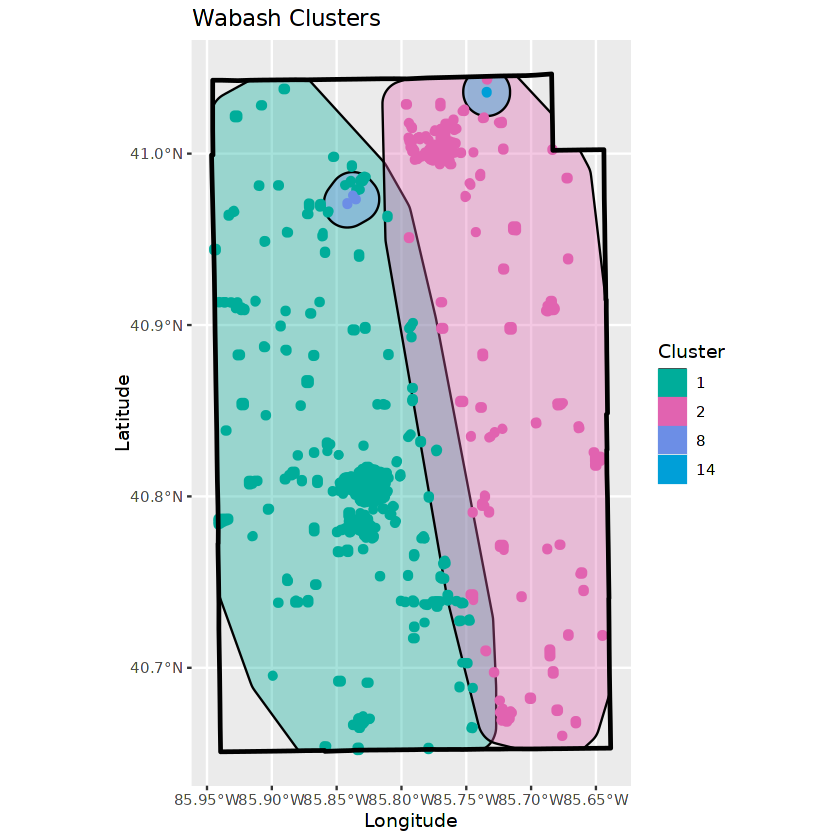

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


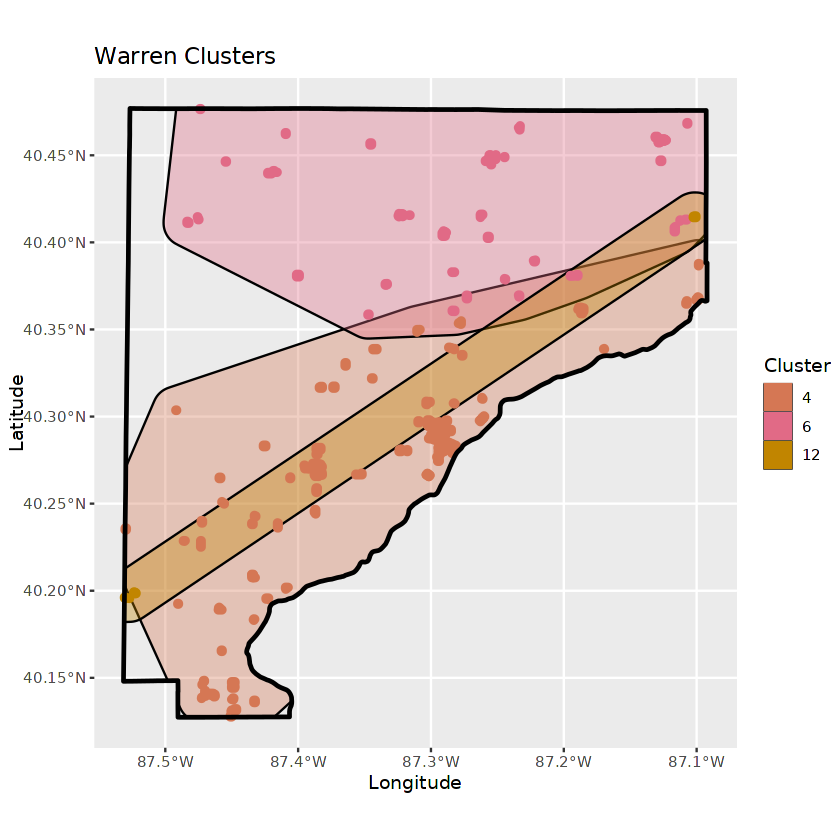

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


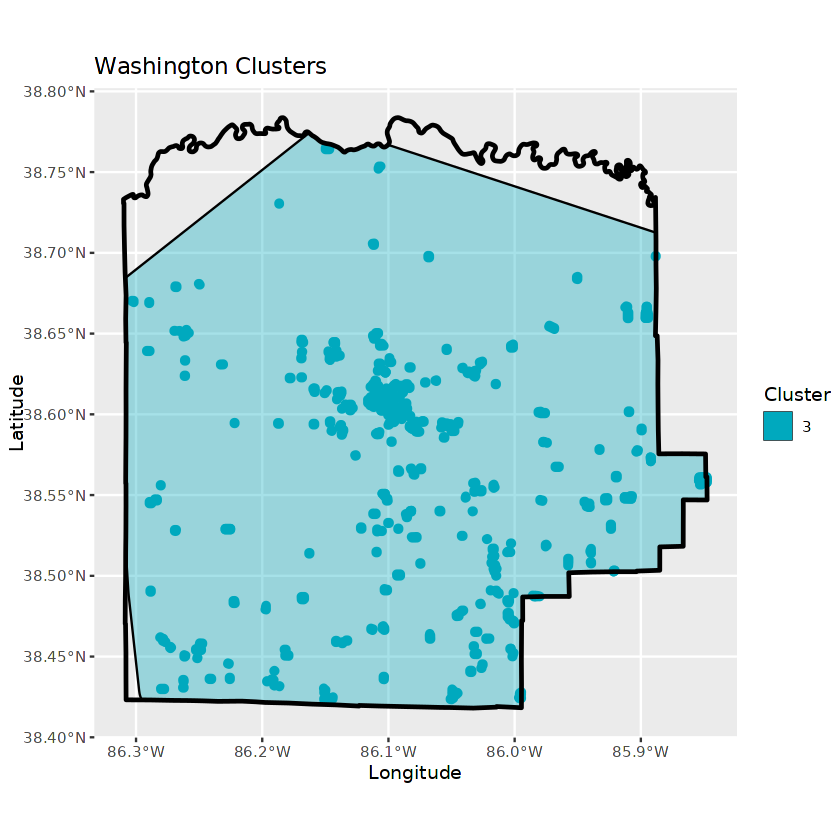

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


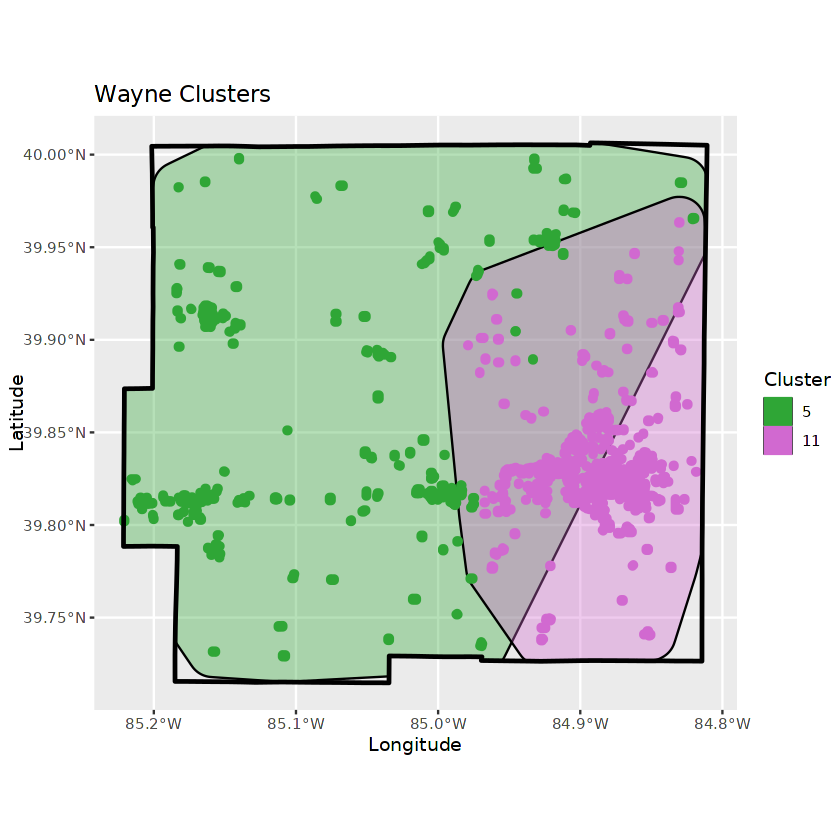

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


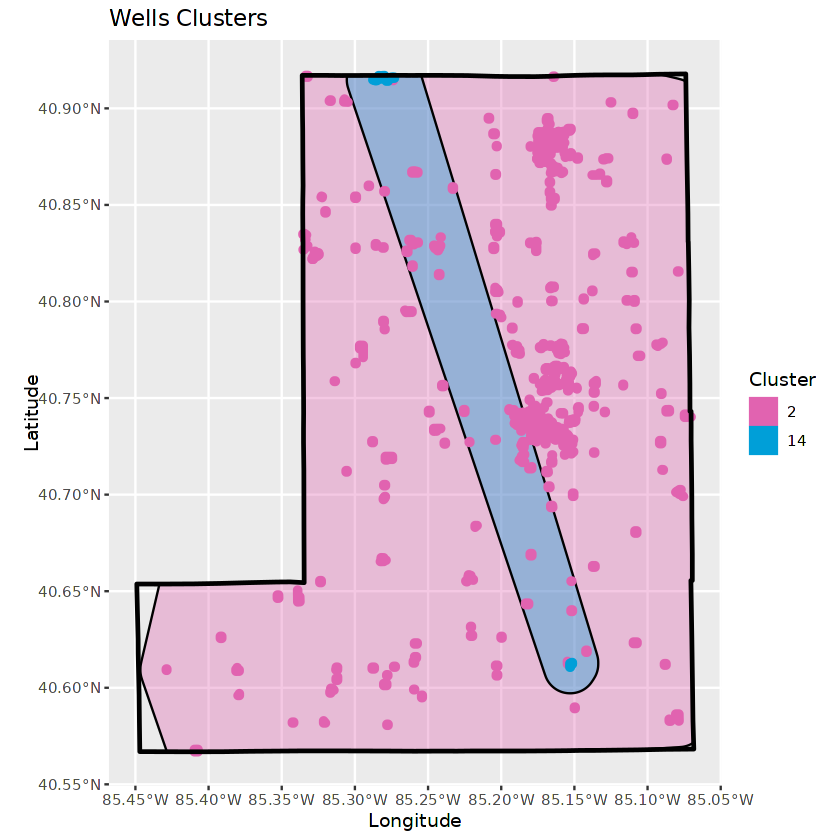

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


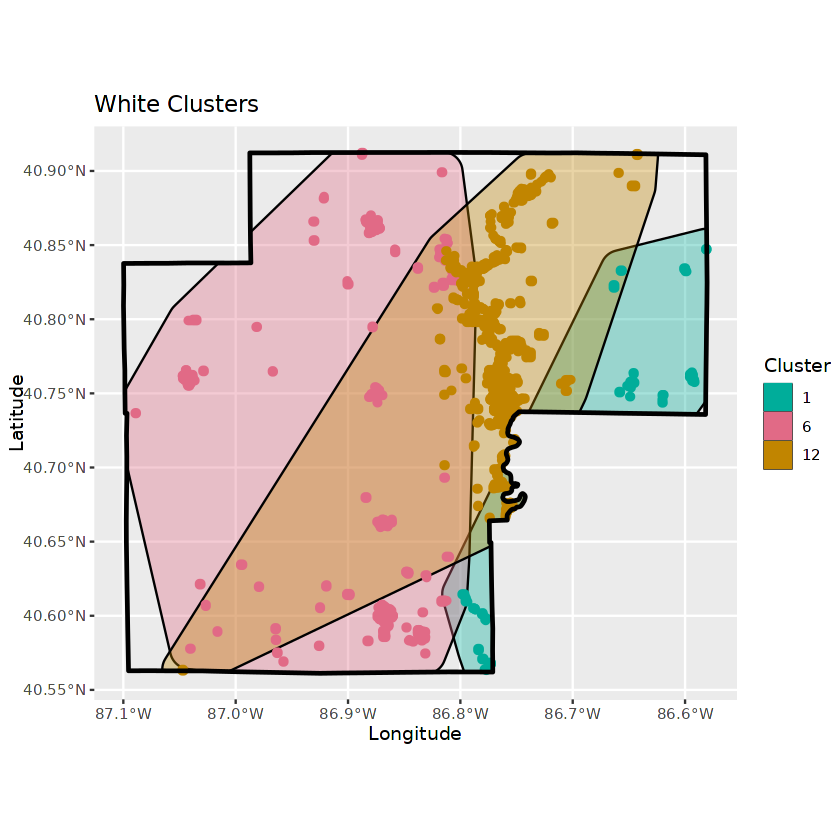

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


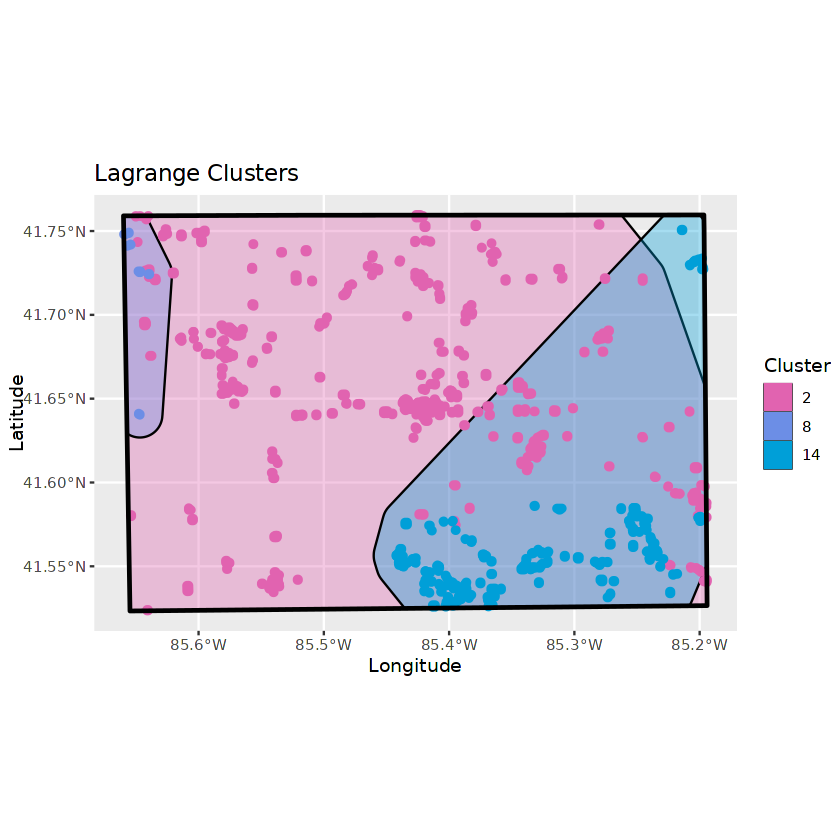

Warning message:
"attribute variables are assumed to be spatially constant throughout all geometries"


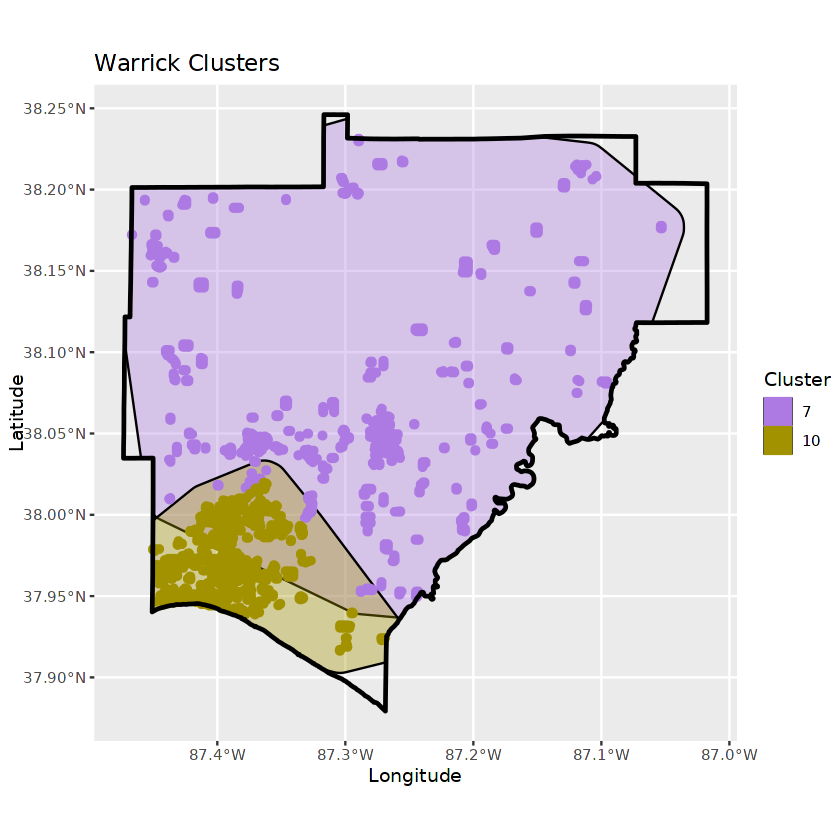

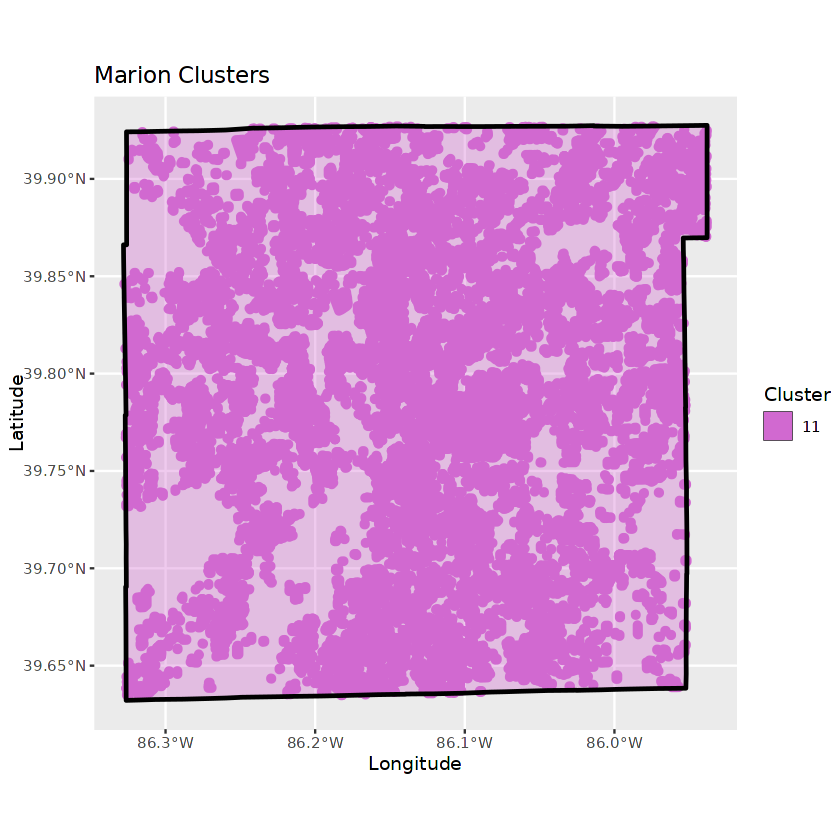

In [39]:
for (county in unique(final$County.y)) {
    county_data <- final[final$County.y == county, ]
    county_data <- county_data[!st_is_empty(county_data$geometry), ]
    ctybf = ctyb[ctyb$NAME == paste(county,'County'),]
    # Step 1: Define global cluster palette
    #all_clusters <- sort(unique(final$Cluster))
    #num_clusters <- length(all_clusters)

    # Example: use the D3 palette or pick your favorite
    #library(ggsci)
    #cluster_colors <- pal_d3("category10")(num_clusters)
    #names(cluster_colors) <- as.character(all_clusters)
      # Compute convex hulls per cluster
      hulls <- county_data %>%
        group_by(Cluster) %>%
        summarise(geometry = st_combine(geometry)) %>%
        st_convex_hull()
    hulls_projected <- hulls %>%
      st_transform(crs = 26916)  # UTM zone 16N, good for Indiana

    # Step 2: Buffer then unbuffer to round the edges
    hulls_rounded <- hulls_projected %>%
      st_buffer(dist = 10000) %>%     # Buffer outward 1000 meters
      st_buffer(dist = -8500)         # Then inward to roughly original size

    # Step 3: Transform back to EPSG:4326 for plotting
    hulls_rounded <- hulls_rounded %>%
      mutate(Cluster = hulls$Cluster) %>%  # Re-attach Cluster
      st_intersection(ctybf)               # Clip to county

    hulls_final <- st_transform(hulls_rounded, crs = 4326)
    
    print(
    ggplot() + 
        geom_sf(data = hulls_final, aes(geometry = geometry, fill = Cluster), color = "black", lwd = 0.5,alpha=0.35) +
        geom_sf(data = county_data, aes(geometry = geometry, fill = Cluster, color = Cluster), lwd = 2, alpha = 2.5) +
        geom_sf(data = ctybf, 
          fill = NA, color = "black", size = 0.5,lwd=1) +
      scale_fill_manual(values = cluster_colors) +
      scale_color_manual(values = cluster_colors) +
      labs(title = paste(county, "Clusters"), x = "Longitude", y = "Latitude")
  )
}

In [40]:
final = st_drop_geometry(final)

In [41]:
colnames(final)

[1] "PrclNmb"                "County.x"               "Address"               
 [4] "PrprtyC"                "Zip.x"                  "City"                  
 [7] "Latitud"                "Longitd"                "Length"                
[10] "Area"                   "Zip.y"                  "County.y"              
[13] "Township.x"             "TaxDistrict.x"          "CountyClassification"  
[16] "ZipClassification"      "TaxClassification"      "TownshipClassification"
[19] "SaleID"                 "County"                 "Township.y"            
[22] "TaxDistrict.y"          "PropertyClass"          "PostedAV"              
[25] "CurrentAV"              "SalePrice"              "PostedSaleRatio"       
[28] "SaleRatio"              "Cluster"

In [42]:
final = final[,c(1,11,12,13,14,15,16,17,18,29)]
colnames(final)[colnames(final) == 'PrclNmb'] = 'ParcelNumber'
colnames(final)[colnames(final) == 'Zip.y'] = 'Zip'
colnames(final)[colnames(final) == 'County.y'] = 'County'
colnames(final)[colnames(final) == 'Township.x'] = 'Township'
colnames(final)[colnames(final) == 'TaxDistrict.x'] = 'TaxDistrict'
head(final)

,ParcelNumber,Zip,County,Township,TaxDistrict,CountyClassification,ZipClassification,TaxClassification,TownshipClassification,Cluster
,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<fct>
16,01-11-29-101-025.000-019,46740,Adams,Wabash,19,Rural,Rural,Urban,Rural,2
21,01-11-04-100-051.000-018,46711,Adams,Wabash,18,Rural,Rural,Urban,Rural,2
25,01-05-03-209-009.000-022,46733,Adams,Washington,22,Rural,Rural,Urban,Urban,2
29,01-05-03-114-027.000-022,46733,Adams,Washington,22,Rural,Rural,Urban,Urban,2
40,01-11-21-302-016.000-019,46740,Adams,Wabash,19,Rural,Rural,Urban,Rural,2
52,01-11-29-211-028.000-019,46740,Adams,Wabash,19,Rural,Rural,Urban,Rural,2


In [43]:
write.csv(final,'Parcel_Clusters_2023.csv')